# Cell -1: Context & Motivation: *The Network IS the Computation*

### **The Foundational Hypothesis: *The Network IS the Computation***

#### This work is driven by the hypothesis that in complex, interconnected systems – from the brain to biological pathways – the **network structure itself, coupled with local interaction rules, directly embodies and performs computation.** Global function and behavior are not merely correlated with network activity but are the *emergent result* of this network-based computation.

### **Biological Networks as a Computational Substrate:**

#### Biological systems, particularly PPI networks, offer a rich substrate to test this hypothesis. Their complex topology and the dynamic nature of protein interactions suggest that pathways don't just passively relay signals but actively *compute* cellular responses based on inputs and internal states. Traditional static analysis often misses this computational essence.

### **The Network Automaton Approach:**

To explore this, we utilize a **Network Automaton**:
1.  We represent the biological system (M6PR pathway) as a graph `G`.
2.  Nodes (proteins) maintain an internal state `S_i(t)` (here, an abstract 5D vector).
3.  Local rules `f` (our "H/P" inspired ruleset: `hdc_5d_step_vectorized`) dictate state transitions based *only* on a node's current state and its neighbors': `S_i(t+1) = f(S_i(t), {S_j(t) | j ∈ Neighbors(i)}, rule_params)`.
4.  We simulate this local computation iteratively across the network.

### **Demonstrating Network Computation:**

The core goal is to demonstrate that this network-based computation yields **emergent global states** (like the "Red Region") that are **functionally meaningful**. We validate this by:

*   Identifying the emergent pattern (Cell 11).
*   Testing if this pattern corresponds to known biological functions via GO Enrichment (Cell 12).
*   Showing that this dynamically computed pattern reveals functional insights distinct from static network properties (Cell 11.1, 12.2).

### **Why Biology?** Successfully demonstrating "*The Network IS the Computation*" in a complex, real-world biological system offers profound implications for understanding cellular function and potentially developing novel computational approaches applicable to biotech, bioinformatics, and medicine. This notebook aims to provide compelling evidence for this theoretical perspective through concrete simulation and analysis.

# Notebook 1: Network Automaton Dynamics & Biological Relevance

## 🔥 Overview: The Network Automaton Concept

This notebook investigates whether simulating localized, dynamic interactions on a protein-protein interaction (PPI) network can reveal **emergent functional modules** that are biologically relevant and potentially distinct from those identified by static network analysis. We employ a **Network Automaton**, a computational model where node states evolve based on local rules and network topology.

**Hypothesis:** Simulating dynamic activity propagation on a PPI graph, even with abstract rules, can identify groups of proteins (an "emergent pattern") whose collective function is relevant to the initial perturbation and distinct from purely structural network properties (like hubs or static communities).

**Core Idea & Flow:**
1.  **Network Definition:** A graph `G` is constructed representing protein-protein interactions (PPI) around a target protein (M6PR), using data from the STRING database filtered by confidence scores (Cell 2).
2.  **State Representation:** Each protein `i` is assigned a multi-dimensional state vector `S_i(t)`. Here, we use an abstract 5D state `S = [u, v, w, x, y]`, inspired by concepts like activation (u), inhibition (v), and hypothetical internal factors (w, x, y) (Cell 3). *Justification: Exploratory, testing if multi-dimensional state adds value.*
3.  **Local Update Rules:** A function `f` determines the next state: `S_i(t+1) = f(S_i(t), {S_j(t) | j ∈ Neighbors(i)}, rule_params)`. The rules (`hdc_5d_step_vectorized`, Cell 4) include activation/inhibition, decay, diffusion, feedback, noise, and abstract harmonic/pheromone effects, governed by `rule_params` (detailed in Cell 1).
4.  **Simulation:** Starting with M6PR activated, rules are applied iteratively via `run_simulation_network_automaton` (Cell 5) for `MAX_SIMULATION_STEPS` (Cell 6).
5.  **Emergent Pattern Analysis:** We identify the "Red Region" - nodes with high final state magnitude (`max(|S_i(T_final)|) > RED_REGION_THRESHOLD`) (Cell 11).
6.  **Validation & Comparison:** We test the biological relevance of the Red Region via GO Enrichment (Cell 12) and critically compare its composition and enrichment profile to baseline node sets derived from static graph properties (degree, RWR, community) (Cells 7, 11.1, 12.2).

**Target Result:** Demonstration that the dynamically derived Red Region yields significant *and* relevant GO enrichment (related to M6PR pathways) that provides unique biological insights compared to static baseline analyses.

---

## 🚀 Running the Notebook: Workflows

This notebook supports two main workflows: a standard baseline run and interactive parameter exploration.

**Workflow 1: Baseline Analysis (Recommended First Run)**

1.  **Configure:** Review and set desired baseline parameters in **Cell 1**.
2.  **Execute Sequentially:** Run cells **0 through 14** in order.
    *   **Cell 6** executes the simulation using parameters from Cell 1.
    *   **Cells 7-13** analyze and visualize the results of *this baseline run*.
    *   **Cell 14** provides a summary based on the baseline.
3.  **Review:** Examine the outputs, particularly the enrichment results (Cells 12-13), comparisons (Cell 7, 11.1, 12.2), dynamics (Cells 6.1, 13.4, 13.5), sensitivity (Cell 13.2) and the final summary (Cell 14).

**Workflow 2: Interactive Exploration (After Baseline Run)**

1.  **Run Baseline First:** Complete Workflow 1 at least once to ensure all functions are defined and baseline results are available for comparison.
2.  **Locate Widgets:** Go to the output area of **Cell 6.3**. The interactive sliders and button should be displayed.
3.  **Adjust & Run:** Modify the `Diffusion`, `Noise`, and `Red Thresh` sliders. Click the **"Run Simulation with Sliders"** button. Wait for the simulation to complete in the output area below the button.
    *   *Effect:* This re-runs the simulation using the new dynamics parameters (Diffusion, Noise). It **overwrites** the global simulation history (`global_state_history_list`, `global_state_history_np`) and updates the global `RED_REGION_THRESHOLD`.
4.  **Re-Analyze:** Go to **Cell 7** and **re-execute Cells 7 through 14 sequentially**. These cells will now process and display the results based on the interactive run's parameters and history.
5.  **Iterate:** Repeat steps 2-4 to explore different parameter combinations.

**Resetting to Baseline:** To re-analyze the original baseline results after an interactive run, you must **re-execute Cell 6** (which uses Cell 1 parameters) and then re-execute Cells 7-14. If the kernel is restarted, you must run Cells 0-6 again.

---

## 🔬 Exploring the Model: Additional Analytical Cells

Beyond the core workflow and interactive widgets, this notebook includes cells for deeper analysis:

*   **Metadata Summary (Cell 4.1):** Provides a quick overview of the configuration used for the run.
*   **Animation (Cell 6.1):** Visualizes the baseline simulation's state evolution over time.
*   **PCA Trajectory (Cell 7.1):** Reduces the high-dimensional state space to 2D to visualize the overall system trajectory and offers neuromorphic mapping ideas.
*   **Sensitivity Analysis (Cell 13.1/13.2):** Systematically tests the impact of changing `diffusion_factor`.
*   **Dynamics Analysis (Cells 13.3-13.5):** Investigates the stability and temporal evolution of the Red Region using line plots and a heatmap.

These cells provide further insights complementing the main simulation and interactive exploration.

---

## 🗺️ Notebook Structure Summary

1.  **Setup & Config (Cells 0-1)**
2.  **Graph & State Prep (Cells 2-3)**
3.  **Define Logic (Cells 2.2, 4, 5)**: Visualization Func, Rule Def, Sim Runner
4.  **(Info) Metadata Summary (Cell 4.1)**
5.  **Run Baseline Simulation (Cell 6)**
6.  **(Optional) Visualize Dynamics (Cell 6.1)**: Animation
7.  **(Optional) Interactive Exploration (Cells 6.2-6.3)**: Widgets & Re-run Logic
8.  **Analyze Results (Cells 7-11)**: Formatting, Baseline Calcs, PCA, Plots, Red Region ID *(Operates on LAST run)*
9.  **Biological Validation (Cells 12-13)**: GO Enrichment (Red Region & Baselines), Plot *(Operates on LAST run's Red Region)*
10. **(Optional) Deeper Analysis (Cells 13.1-13.5)**: Sensitivity, Stability/Dynamics Plots *(Operates mostly on Baseline Run, check cell descriptions)*
11. **Summarize (Cell 14)**

In [1]:
# Cell 0: Initial Setup & Imports (Network Automaton Demo)
# Description: Basic imports, setup, device check for the Network Automaton demonstration.

import os
import sys # Keep sys import if needed
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import torch
import requests
import gzip
import shutil
import copy
import math
import json
import time
import pickle
import io
import warnings
import subprocess # Added for check in Cell 6.1
from tqdm.auto import tqdm
from scipy import stats # Keep for potential analysis
from numpy.fft import fft, fftfreq # Keep for potential analysis
from scipy.signal import find_peaks # Keep for potential analysis
import matplotlib.colors as mcolors
import matplotlib.cm as cm
# Import analysis-specific libraries here as needed later
from sklearn.preprocessing import StandardScaler
# from sklearn.cluster import KMeans # Not used currently
from sklearn.impute import SimpleImputer # Might be needed if NaNs become issue
from sklearn.decomposition import PCA # Added for Cell 7.1

# Third-party bio libraries (ensure installed: pip install gseapy python-igraph leidenalg)
try:
    import gseapy as gp # Rename to gp for consistency
except ImportError:
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print("!!! WARNING: gseapy not found. Enrichment analysis will fail.!!!")
    print("!!! Please install it: pip install gseapy                    !!!")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    gp = None # Set to None to allow checks later
try:
    import igraph as ig
    import leidenalg as la
    HAS_LEIDEN = True
except ImportError:
    print("--- INFO: leidenalg or python-igraph not found. Community detection baseline (Cell 11.1) disabled. ---")
    HAS_LEIDEN = False

# Import display tools
from IPython.display import display, Image, clear_output
import ipywidgets as widgets
import matplotlib.animation as animation


# Ignore common warnings for cleaner output (optional)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")
warnings.filterwarnings("ignore", category=UserWarning, module="seaborn")
warnings.filterwarnings("ignore", category=RuntimeWarning) # Ignore runtime warnings during calculations


print(f"--- Cell 0: Initial Setup (Network Automaton Demo) ({time.strftime('%Y-%m-%d %H:%M:%S')}) ---")

# --- Device Check ---
if torch.cuda.is_available():
    device = torch.device('cuda:0')
    try:
        dev_name = torch.cuda.get_device_name(0)
        print(f"✅ CUDA available, using GPU: {dev_name}")
    except Exception as e:
        print(f"✅ CUDA available, but couldn't get device name: {e}")
else:
    device = torch.device('cpu')
    print("⚠️ CUDA not available, using CPU.")
# Make device globally accessible if needed
global_device = device
print(f"PyTorch Device set to: {global_device}")

# --- Base Directory ---
DATA_ROOT_DIR = "/tmp/cakg_data" # Base for downloaded data
os.makedirs(DATA_ROOT_DIR, exist_ok=True)
print(f"Checked/created base data directory: {DATA_ROOT_DIR}")
OUTPUT_DIR_BASE = "network_automaton_results" # Base for experiment outputs
os.makedirs(OUTPUT_DIR_BASE, exist_ok=True)
print(f"Checked/created base output directory: {OUTPUT_DIR_BASE}")

print("Cell 0 execution complete.")

--- INFO: leidenalg or python-igraph not found. Community detection baseline (Cell 11.1) disabled. ---
--- Cell 0: Initial Setup (Network Automaton Demo) (2025-04-13 16:59:12) ---
⚠️ CUDA not available, using CPU.
PyTorch Device set to: cpu
Checked/created base data directory: /tmp/cakg_data
Checked/created base output directory: network_automaton_results
Cell 0 execution complete.


/home/irbsurfer/miniconda3/envs/graph-automaton/lib/python3.10/site-packages/torch/cuda/__init__.py:107: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


In [2]:
# Cell 1: Configuration (Network Automaton - M6PR)
# Description: Defines parameters. Corrected config saving logic. Includes notes on param origins and justification.

import numpy as np
import os
import json
import time
import traceback # Added for config save debugging
import copy # Added for config save debugging

print(f"\n--- Cell 1: Configuration (Network Automaton - M6PR) ({time.strftime('%Y-%m-%d %H:%M:%S')}) ---")

# --- Experiment Setup ---
TARGET_NODE_ID = '9606.ENSP00000000412'  # M6PR STRING ID
TARGET_NODE_NAME = "M6PR" # Human readable name
EXPERIMENT_BASE_NAME = f"NetworkAutomaton_{TARGET_NODE_NAME}_5D_LRRK2Style"
EXPERIMENT_NAME = f"{EXPERIMENT_BASE_NAME}_{time.strftime('%Y%m%d_%H%M%S')}" # Added seconds for uniqueness
SPECIES_ID = "9606" # Human taxonomy ID
print(f"🧬 Target Protein: {TARGET_NODE_NAME} ({TARGET_NODE_ID})")
print(f"🧪 Experiment Name: {EXPERIMENT_NAME}")

# --- Graph Construction ---
STRING_SCORE_THRESHOLD = 700 # Confidence score threshold (High confidence interactions)
SUBGRAPH_RADIUS = 2 # Ego graph radius (Immediate neighbors and neighbors-of-neighbors)
STRING_DATA_DIR = "datasets" # Local data directory
print(f"📊 Graph Params: STRING Score >= {STRING_SCORE_THRESHOLD}, Subgraph Radius = {SUBGRAPH_RADIUS}")
print(f"   Using local data directory: {STRING_DATA_DIR}")

# --- State Initialization (5D) ---
# NOTE (Model Justification): The 5D state S = [u, v, w, x, y] is an abstract representation.
# - u: 'Activation' - Conceptual measure of primary functional activity/signaling potential.
# - v: 'Inhibition' - Conceptual measure of counteracting/inhibitory potential.
# - w, x, y: Hypothetical internal factors (e.g., 'Stress', 'Energy', 'Feedback Modulator'). Added to explore richer dynamics,
#   but specific biological mapping is currently undefined and heuristic for this general model.
INIT_MODE = 'seeds' # Start simulation by activating the target protein
STATE_DIM = 5
SEED_ACTIVATION_VALUE = np.array([1.0, 0.0, 0.0, 0.0, 0.0], dtype=float) # Start target with u=1
DEFAULT_INACTIVE_STATE = np.array([0.0, 0.0, 0.0, 0.0, 0.0], dtype=float) # Default for other nodes
print(f"🌱 State Params: Dim = {STATE_DIM}, Init Mode = {INIT_MODE}")

# --- Simulation Parameters ---
MAX_SIMULATION_STEPS = 5000 # Extended duration for observing dynamics
CONVERGENCE_THRESHOLD = 0.0001 # Threshold for average state change (NOTE: Rarely met, indicates complex dynamics)
print(f"⏱️ Simulation Params: Max Steps = {MAX_SIMULATION_STEPS}, Convergence Threshold = {CONVERGENCE_THRESHOLD}")

# --- Rule Parameters ---
# NOTE (Model Justification): Parameters initially chosen heuristically, informed by prior work (LRRK2/TP53 models),
# and tuned to ensure non-trivial, bounded dynamics. They are not derived from specific M6PR biochemical kinetics.
# Sensitivity analysis (Cell 13.2) provides some insight into robustness.
rule_params = {
    # Activation/Inhibition: Standard competitive dynamics terms, values balance influence
    'activation_threshold': 0.5, 'activation_increase_rate': 0.15, 'activation_decay_rate': 0.05,
    'inhibition_threshold': 0.5, 'inhibition_increase_rate': 0.1, 'inhibition_decay_rate': 0.1,
    'inhibition_feedback_threshold': 0.6, 'inhibition_feedback_strength': 0.3, # u>thresh increases v
    # Spatial/System Effects: Standard diffusion, low noise
    'diffusion_factor': 0.05, # Neighbor state averaging (Moderate sensitivity found)
    'noise_level': 0.001, # Small random perturbations (Low sensitivity found)
    # Abstract/Heuristic Terms: Added to explore potential complex behaviors
    'harmonic_factor': 0.05, # Rationale: Non-linear influence based on collective neighbor activity (Bio justification TBD)
    'pheromone_increase_rate': 0.02, 'pheromone_multiplicative_decay_rate': 0.99, # Rationale: Simple edge reinforcement analogue (Bio justification TBD)
    # Decay for Abstract Dimensions: Assumed slow decay to allow persistence
    'w_decay_rate': 0.05, 'x_decay_rate': 0.05, 'y_decay_rate': 0.05,
    'use_confidence_weight': True, # Modulate interactions by STRING score
}
print(f"📐 Rule Params (5D - Heuristically Tuned):\n{json.dumps(rule_params, indent=2)}")

# --- Analysis & Output Parameters ---
NODES_TO_PLOT_COUNT = 10 # For timeseries plots (Cell 8)
RED_REGION_THRESHOLD = 0.5 # For defining high-activity nodes (Cell 11) (NOTE: Size sensitive to threshold)
GO_ENRICHMENT_LIBRARY = 'GO_Biological_Process_2023' # Database for enrichment (Cell 12)
TOP_N_ENRICHMENT_TERMS = 15 # For display/plotting (Cell 12, 13)
STRING_API_BATCH_SIZE = 100; STRING_API_MAX_RETRIES = 3; STRING_API_RETRY_DELAY = 5 # For ID mapping (Cell 12)
SNAPSHOT_STEPS = [0, MAX_SIMULATION_STEPS // 4, MAX_SIMULATION_STEPS // 2, 3 * MAX_SIMULATION_STEPS // 4, MAX_SIMULATION_STEPS - 1] # For static snapshots (Cell 10)
SNAPSHOT_STEPS = [int(s) for s in SNAPSHOT_STEPS if s < MAX_SIMULATION_STEPS] # Ensure steps are within bounds
if MAX_SIMULATION_STEPS - 1 not in SNAPSHOT_STEPS and MAX_SIMULATION_STEPS > 0 : SNAPSHOT_STEPS.append(MAX_SIMULATION_STEPS - 1) # Make sure last step included
SNAPSHOT_STEPS = sorted(list(set(SNAPSHOT_STEPS))) # Ensure unique and sorted
print(f"📸 Snapshot Steps: {SNAPSHOT_STEPS}")
print(f"📈 Analysis Params: Red Region Threshold = {RED_REGION_THRESHOLD}, GO Library = {GO_ENRICHMENT_LIBRARY}")
print(f"🖼️ Output Params: Nodes to Plot = {NODES_TO_PLOT_COUNT}")

# --- Experiment-specific Output Subdirectory ---
if 'OUTPUT_DIR_BASE' not in globals(): raise NameError("❌ OUTPUT_DIR_BASE missing.")
OUTPUT_DIR = os.path.join(OUTPUT_DIR_BASE, EXPERIMENT_NAME)
os.makedirs(OUTPUT_DIR, exist_ok=True); os.makedirs(STRING_DATA_DIR, exist_ok=True)
print(f"➡️ Results will be saved in: {OUTPUT_DIR}")
print(f"   Checked/created local data directory: {STRING_DATA_DIR}")

# --- Save Configuration ---
config_save_path = os.path.join(OUTPUT_DIR, "run_config.json")
try:
    config_to_save = {}
    # Iterate over a copy of the global keys to avoid runtime errors
    global_items_copy = list(globals().items())
    for k, v in global_items_copy:
        if k.isupper(): # Filter for uppercase convention
            if isinstance(v, (str, int, float, bool)):
                config_to_save[k] = v
            elif isinstance(v, (list, tuple)):
                 # Ensure lists/tuples contain only simple types for JSON
                 if all(isinstance(item, (str, int, float, bool, dict)) for item in v):
                      config_to_save[k] = list(v) # Convert tuple to list
            elif isinstance(v, dict):
                # Ensure dicts contain only simple types for JSON keys/values
                 try: # Attempt simple check, might need more robust for nested
                     json.dumps(v)
                     config_to_save[k] = copy.deepcopy(v)
                 except TypeError:
                     print(f"   (Skipping config variable '{k}' of type dict due to non-serializable content)")
            elif isinstance(v, np.ndarray):
                config_to_save[k] = v.tolist()
            # Add other simple types if needed

    # Explicitly add rule_params from local scope if it exists and is a dict
    if 'rule_params' in locals() and isinstance(rule_params, dict):
        config_to_save['rule_params'] = rule_params # Add the rules dictionary

    with open(config_save_path, 'w') as f:
        json.dump(config_to_save, f, indent=4, default=str) # Use default=str for unknown types
    print(f"   ✅ Saved run configuration to {config_save_path}")
except Exception as e:
    print(f"   ⚠️ Warning: Could not save configuration. Error: {e}")
    traceback.print_exc(limit=1) # Print limited traceback for debugging

print("\nCell 1 execution complete.")


--- Cell 1: Configuration (Network Automaton - M6PR) (2025-04-13 16:59:12) ---
🧬 Target Protein: M6PR (9606.ENSP00000000412)
🧪 Experiment Name: NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912
📊 Graph Params: STRING Score >= 700, Subgraph Radius = 2
   Using local data directory: datasets
🌱 State Params: Dim = 5, Init Mode = seeds
⏱️ Simulation Params: Max Steps = 5000, Convergence Threshold = 0.0001
📐 Rule Params (5D - Heuristically Tuned):
{
  "activation_threshold": 0.5,
  "activation_increase_rate": 0.15,
  "activation_decay_rate": 0.05,
  "inhibition_threshold": 0.5,
  "inhibition_increase_rate": 0.1,
  "inhibition_decay_rate": 0.1,
  "inhibition_feedback_threshold": 0.6,
  "inhibition_feedback_strength": 0.3,
  "diffusion_factor": 0.05,
  "noise_level": 0.001,
  "harmonic_factor": 0.05,
  "pheromone_increase_rate": 0.02,
  "pheromone_multiplicative_decay_rate": 0.99,
  "w_decay_rate": 0.05,
  "x_decay_rate": 0.05,
  "y_decay_rate": 0.05,
  "use_confidence_weight": true
}
📸 Sn

In [3]:
# Cell 2: Graph Preparation (Robust STRING Loading for M6PR) - Network Automaton Demo
# Description: Loads local/downloads STRING links, filters by score,
#              builds NetworkX graph, extracts M6PR ego subgraph, calculates layout.
#              Sets global graph vars: G, node_list, node_to_int, int_to_node, global_pos, INITIAL_SEED_NODES_IDX.

import os
import pandas as pd
import requests
import gzip
import shutil
from tqdm.auto import tqdm
import warnings
import numpy as np
import networkx as nx
import time
import traceback
import gc # For garbage collection

print("\n--- Cell 2: Graph Preparation (Targeting M6PR) ---")

# --- Configuration (from Cell 1) ---
required_globals_cell2 = ['DATA_ROOT_DIR', 'STRING_DATA_DIR', 'TARGET_NODE_ID', 'TARGET_NODE_NAME',
                          'SUBGRAPH_RADIUS', 'STRING_SCORE_THRESHOLD', 'SPECIES_ID', 'INIT_MODE']
for var_name in required_globals_cell2:
     if var_name not in globals():
         raise NameError(f"Configuration variable '{var_name}' missing. Re-run Cell 1.")

print(f"Target Node: {TARGET_NODE_ID} ({TARGET_NODE_NAME}), Radius: {SUBGRAPH_RADIUS}, Score Threshold: {STRING_SCORE_THRESHOLD}")

# --- Declare global variables to be set ---
G = None; node_list = []; node_to_int = {}; int_to_node = {}; pos = None; INITIAL_SEED_NODES_IDX = []
global_pos = None # Initialize global_pos as well

# --- Helper Functions (Expanded Download/Extract) ---
def download_file_robust(url, dest_path, desc=None):
    # Check if file exists in the specified local directory first
    if os.path.exists(dest_path) and os.path.getsize(dest_path) > 0:
        print(f"Using existing file: {os.path.basename(dest_path)}")
        return True
    # If not found locally, attempt download
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)
    effective_desc = desc or os.path.basename(dest_path)
    print(f"Downloading {url} to {dest_path}...")
    headers = {'User-Agent': 'Mozilla/5.0 (compatible; NetworkAutomatonSim/1.0)'}
    try:
        response = requests.get(url, stream=True, timeout=900, headers=headers) # Increased timeout
        response.raise_for_status()
        total_size = int(response.headers.get('content-length', 0))
        with open(dest_path, 'wb') as f, tqdm(desc=effective_desc, total=total_size, unit='iB', unit_scale=True, unit_divisor=1024, leave=False) as bar:
            for chunk in response.iter_content(chunk_size=1024*1024):
                if chunk:
                    size = f.write(chunk)
                    bar.update(size)
        actual_size = os.path.getsize(dest_path)
        if total_size != 0 and actual_size < total_size:
             warnings.warn(f"Downloaded size mismatch for {os.path.basename(dest_path)}: Expected {total_size}, got {actual_size}.")
        elif actual_size == 0:
             warnings.warn(f"Downloaded file is empty: {dest_path}")
             return False # Treat empty download as failure
        print(f"Download completed: {os.path.basename(dest_path)}")
        return True
    except requests.exceptions.Timeout:
        print(f"❌ Timeout error downloading {url} (after 900 seconds).")
        return False
    except requests.exceptions.RequestException as e:
        print(f"❌ Download error {url}: {e}")
        return False
    except Exception as e:
        print(f"❌ An unexpected error occurred during download: {e}")
        return False
    finally:
         # Cleanup partial download on error
         if 'response' in locals() and response is not None and (not response.ok or ('success' in locals() and not success)):
             if os.path.exists(dest_path):
                 try: os.remove(dest_path); print(f"   (Removed potentially incomplete download: {os.path.basename(dest_path)})")
                 except OSError as remove_e: print(f"   (Warning: Could not remove file {os.path.basename(dest_path)}: {remove_e})")

def extract_gz_robust(src_path, dest_path, desc=None):
    if not os.path.exists(src_path): print(f"❌ Source not found: {src_path}"); return False
    if os.path.exists(dest_path):
        if os.path.getsize(dest_path) == 0: print(f"Destination '{os.path.basename(dest_path)}' empty. Overwriting.")
        elif os.path.getmtime(dest_path) >= os.path.getmtime(src_path): print(f"Extracted file '{os.path.basename(dest_path)}' is up-to-date. Skipping."); return True
        else: print(f"Destination file exists but is older. Overwriting.")
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)
    effective_desc = desc or f"Extracting {os.path.basename(src_path)}"
    print(f"Extracting {src_path} to {dest_path}...")
    try:
        src_size = os.path.getsize(src_path)
        with gzip.open(src_path, 'rb') as f_in, open(dest_path, 'wb') as f_out, \
             tqdm(desc=effective_desc, total=src_size, unit='iB', unit_scale=True, unit_divisor=1024, leave=False) as bar:
            chunk_size=1024*1024
            while True:
                 chunk = f_in.read(chunk_size)
                 if not chunk: break
                 f_out.write(chunk)
                 try: # Update progress bar based on compressed file position if possible
                     current_pos = f_in.tell(); update_amount = current_pos - bar.n
                     if update_amount > 0: bar.update(update_amount)
                 except Exception: bar.update(len(chunk)) # Fallback to chunk size
            if bar.n < bar.total: bar.update(bar.total - bar.n) # Ensure 100%
        print(f"Extraction completed: {os.path.basename(dest_path)}")
        if not os.path.exists(dest_path) or os.path.getsize(dest_path) == 0:
            warnings.warn(f"Extraction output file is missing or empty: {dest_path}"); return False
        return True
    except Exception as e:
        print(f"❌ Extraction error: {e}"); traceback.print_exc()
        if os.path.exists(dest_path):
            try: os.remove(dest_path)
            except OSError: pass
        return False

# ==============================================================================
# == Main Graph Preparation Logic ==============================================
# ==============================================================================
try:
    # --- Step 1: Define File Paths & URLs ---
    string_version = "v12.0"
    edge_file_base = f"{SPECIES_ID}.protein.links.full.{string_version}.txt"
    edge_url = f"https://stringdb-downloads.org/download/protein.links.full.{string_version}/{edge_file_base}.gz"
    edge_gz_path = os.path.join(STRING_DATA_DIR, f"{edge_file_base}.gz")
    edge_txt_path = os.path.join(STRING_DATA_DIR, edge_file_base)

    # --- Step 2: Ensure Protein Links TXT File is Available ---
    print("Ensuring protein links file is available...")
    if os.path.exists(edge_txt_path) and os.path.getsize(edge_txt_path) > 0: print(f"Using existing links file: {edge_txt_path}")
    elif os.path.exists(edge_gz_path) and os.path.getsize(edge_gz_path) > 0:
        print(f"Found GZ file: {edge_gz_path}. Attempting extraction...")
        if not extract_gz_robust(edge_gz_path, edge_txt_path, desc="Extracting Links"): raise RuntimeError(f"Failed to extract STRING links from local GZ file.")
    else:
        print("Local files not found. Attempting download...")
        if not download_file_robust(edge_url, edge_gz_path, desc="STRING Links"): raise RuntimeError(f"Failed to download STRING links.")
        if not extract_gz_robust(edge_gz_path, edge_txt_path, desc="Extracting Links"): raise RuntimeError(f"Failed to extract downloaded STRING links.")
    if not os.path.exists(edge_txt_path) or os.path.getsize(edge_txt_path) == 0: raise FileNotFoundError(f"Required STRING links file missing/empty after check: {edge_txt_path}")
    print(f"Using STRING links data file: {edge_txt_path}")

    # --- Step 3: Load Links Data & Filter ---
    print(f"Loading STRING links data...")
    required_cols = ['protein1', 'protein2', 'combined_score']
    col_dtypes = {'protein1': str, 'protein2': str, 'combined_score': int}
    edges_df = pd.read_csv(edge_txt_path, sep=' ', usecols=required_cols, dtype=col_dtypes, engine='c', low_memory=False)
    print(f"Loaded {len(edges_df):,} raw interactions.")
    if edges_df.empty: raise ValueError("Loaded empty DataFrame.")
    target_node_str = str(TARGET_NODE_ID)
    present_pre_filter = edges_df['protein1'].eq(target_node_str).any() or edges_df['protein2'].eq(target_node_str).any()
    if not present_pre_filter: raise ValueError(f"Target '{target_node_str}' ({TARGET_NODE_NAME}) NOT FOUND in raw links file.")
    else: print(f"✅ Target '{target_node_str}' ({TARGET_NODE_NAME}) present in raw links data.")
    score_int_threshold = int(STRING_SCORE_THRESHOLD)
    edges_df_filtered = edges_df[edges_df['combined_score'] >= score_int_threshold].copy()
    print(f"Filtered edges by score >= {score_int_threshold}: {len(edges_df_filtered):,} edges remain.")
    if edges_df_filtered.empty: raise ValueError(f"No interactions left after filtering by score >= {score_int_threshold}.")
    edges_df = edges_df_filtered # Use filtered data

    # --- Step 4: Build Full Graph (Memory Optimization) ---
    print("Building initial NetworkX graph (G_full)...")
    G_full = nx.Graph()
    # Add edges directly from DataFrame iterator for potentially lower memory use
    edge_tuples = []
    for _, r in tqdm(edges_df.iterrows(), total=len(edges_df), desc="Processing Edges", leave=False):
        if r['protein1'] != r['protein2']: # Avoid self-loops if not desired
            edge_tuples.append((r['protein1'], r['protein2'], {'weight': float(r['combined_score'] / 1000.0)}))
    G_full.add_edges_from(edge_tuples)
    del edge_tuples; del edges_df; gc.collect() # Clean up memory
    print(f"Built full filtered graph: {G_full.number_of_nodes():,} nodes, {G_full.number_of_edges():,} edges.")
    if target_node_str not in G_full: raise ValueError(f"Target '{target_node_str}' NOT in filtered graph G_full (unexpected error).")
    else: print(f"✅ Target '{target_node_str}' confirmed in G_full.")

    # --- Step 5: Extract Ego Graph ---
    G = None # Initialize G
    print(f"Extracting ego graph (radius {SUBGRAPH_RADIUS}) centered on '{target_node_str}'...")
    try:
        G = nx.ego_graph(G_full, target_node_str, radius=SUBGRAPH_RADIUS, center=True, undirected=True)
        print(f"✅ Ego graph extracted (G): {G.number_of_nodes():,} nodes, {G.number_of_edges():,} edges.")
        if target_node_str not in G: warnings.warn(f"Target node {target_node_str} unexpectedly not in extracted ego graph G!")
    except Exception as ego_err: print(f"❌ Error extracting ego graph: {ego_err}."); raise
    if G is None or G.number_of_nodes() == 0: raise ValueError("❌ Final graph 'G' is empty or None.")
    del G_full; gc.collect() # Clean up full graph memory

    # --- Step 6: Build Node List and Mappings ---
    print("Building node list and mappings for final graph G...")
    node_list = sorted([str(n) for n in G.nodes()])
    node_to_int = {node_id: i for i, node_id in enumerate(node_list)}
    int_to_node = {i: node_id for node_id, i in node_to_int.items()}
    print(f"Node list length: {len(node_list):,}")
    if not node_list: raise ValueError("Final node_list is empty.")

    # --- Step 7: Set Seed Index ---
    INITIAL_SEED_NODES_IDX = []
    print(f"Setting seed index based on INIT_MODE='{INIT_MODE}'...")
    if INIT_MODE == 'seeds':
        if target_node_str in node_to_int:
            seed_idx = node_to_int[target_node_str]
            INITIAL_SEED_NODES_IDX = [seed_idx]
            print(f"✅ Seed index set for target '{target_node_str}': {INITIAL_SEED_NODES_IDX}")
        else: warnings.warn(f"⚠️ Target '{target_node_str}' not in final mapping! No seed set."); INITIAL_SEED_NODES_IDX = []
    else: print(f"   INIT_MODE is '{INIT_MODE}'. Skipping seed index determination.")

    # --- Step 8: Compute Graph Layout ---
    print("Computing graph layout (Spring)...")
    layout_start_time = time.time()
    pos = None; global_pos = None # Reset handles
    try:
        node_count = G.number_of_nodes()
        if node_count > 0:
             k_val = 1.0 / np.sqrt(node_count) if node_count > 1 else 1.0
             iterations_val = 50 if node_count < 2000 else 30
             print(f"   Calculating nx.spring_layout (k={k_val:.4f}, iterations={iterations_val})...")
             pos = nx.spring_layout(G, k=k_val, iterations=iterations_val, seed=42)
             layout_time = time.time() - layout_start_time
             if pos and len(pos) == node_count:
                 print(f"✅ Layout finished in {layout_time:.2f} sec.")
                 global_pos = pos # Store layout globally
                 print(f"   Stored layout globally in 'global_pos'.")
             elif pos: warnings.warn(f"Layout size ({len(pos)}) mismatch with node count ({node_count})!"); global_pos = pos # Store anyway?
             else: print(f"❌ Layout computation returned empty result after {layout_time:.2f} sec."); pos = None
        else: print("   Skipping layout calculation (Graph has 0 nodes)."); pos = None
    except Exception as layout_err:
        layout_time = time.time() - layout_start_time
        print(f"❌ Error computing layout after {layout_time:.2f} sec: {layout_err}."); traceback.print_exc(); pos = None; global_pos = None

    print("\n--- Graph Preparation SUCCEEDED ---")

except Exception as prep_error:
    print(f"\n❌❌❌ ERROR during graph preparation: {prep_error} ❌❌❌"); traceback.print_exc()
    G, node_list, node_to_int, int_to_node, pos, global_pos = None, [], {}, {}, None, None; INITIAL_SEED_NODES_IDX = []
    print("Global graph variables reset due to error.")

# --- Final Verification ---
print("\n--- Final Graph Variable State Verification ---")
nodes_g = G.number_of_nodes() if isinstance(G, nx.Graph) else 'N/A'; edges_g = G.number_of_edges() if isinstance(G, nx.Graph) else 'N/A'
pos_keys = len(global_pos) if isinstance(global_pos, dict) else 'N/A'
print(f"Global 'G': {nodes_g} nodes, {edges_g} edges.")
print(f"Global 'global_pos': {pos_keys} keys (type: {type(global_pos)}).")
print(f"Global 'node_list': {len(node_list)} elements (type: {type(node_list)}).")
print(f"Global 'INITIAL_SEED_NODES_IDX': {INITIAL_SEED_NODES_IDX} (type: {type(INITIAL_SEED_NODES_IDX)}).")

print("\nCell 2 execution complete.")


--- Cell 2: Graph Preparation (Targeting M6PR) ---
Target Node: 9606.ENSP00000000412 (M6PR), Radius: 2, Score Threshold: 700
Ensuring protein links file is available...
Using existing links file: datasets/9606.protein.links.full.v12.0.txt
Using STRING links data file: datasets/9606.protein.links.full.v12.0.txt
Loading STRING links data...
Loaded 13,715,404 raw interactions.
✅ Target '9606.ENSP00000000412' (M6PR) present in raw links data.
Filtered edges by score >= 700: 473,860 edges remain.
Building initial NetworkX graph (G_full)...


Processing Edges:   0%|          | 0/473860 [00:00<?, ?it/s]

Built full filtered graph: 16,201 nodes, 236,930 edges.
✅ Target '9606.ENSP00000000412' confirmed in G_full.
Extracting ego graph (radius 2) centered on '9606.ENSP00000000412'...
✅ Ego graph extracted (G): 163 nodes, 1,497 edges.
Building node list and mappings for final graph G...
Node list length: 163
Setting seed index based on INIT_MODE='seeds'...
✅ Seed index set for target '9606.ENSP00000000412': [0]
Computing graph layout (Spring)...
   Calculating nx.spring_layout (k=0.0783, iterations=50)...
✅ Layout finished in 0.07 sec.
   Stored layout globally in 'global_pos'.

--- Graph Preparation SUCCEEDED ---

--- Final Graph Variable State Verification ---
Global 'G': 163 nodes, 1497 edges.
Global 'global_pos': 163 keys (type: <class 'dict'>).
Global 'node_list': 163 elements (type: <class 'list'>).
Global 'INITIAL_SEED_NODES_IDX': [0] (type: <class 'list'>).

Cell 2 execution complete.


In [4]:
# Cell 2.1: Visualization Function Definition
# Description: Defines the core function 'visualize_snapshot_5d' for visualizing network snapshots.
# Moved here (after Cell 2) so it's defined before being used later. Includes verbose and add_colorbar flags.

import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import os
import warnings
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import traceback

print("\n--- Cell 2.1: Defining Visualization Function ---")

# --- Visualization Function Definition (with Verbose Flag & add_colorbar Flag) ---
# Define function to visualize a single snapshot
def visualize_snapshot_5d(graph, state_dict, graph_pos_local, step_num, exp_name_local, ax=None, verbose=True, add_colorbar=True):
    """Visualizes graph state using Act-Inh coloring for 5D state dict."""
    # Access necessary globals safely or use defaults
    state_dim_local = globals().get('STATE_DIM', 5)
    default_inactive_local = globals().get('DEFAULT_INACTIVE_STATE', np.zeros(state_dim_local))
    target_node_id_local = globals().get('TARGET_NODE_ID', None) # For highlighting

    if verbose: print(f"  [Visualizer Step {step_num}] Entering function...")
    fig_handle = None # Initialize figure handle to None
    standalone_plot = False
    if ax is None:
        fig_handle, ax = plt.subplots(figsize=(12, 9));
        standalone_plot = True
        if verbose: print(f"  [Visualizer Step {step_num}] Created local figure and axis.")
    else:
        fig_handle = ax.figure
        if verbose: print(f"  [Visualizer Step {step_num}] Using passed axis.")

    # --- Input Validation ---
    valid_input = True
    if not isinstance(graph_pos_local, dict) or not graph_pos_local: print("❌ Plot Error: Invalid graph_pos_local."); valid_input=False
    if not isinstance(graph, nx.Graph): print("❌ Plot Error: Invalid graph object."); valid_input=False
    if not isinstance(state_dict, dict): print("❌ Plot Error: Invalid state_dict."); valid_input=False
    if not valid_input:
         if verbose: print(f"  [Visualizer Step {step_num}] Input validation failed. Returning None.")
         if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
         return None

    if verbose: print(f"  [Visualizer Step {step_num}] Input validation passed.")

    # --- Node Processing ---
    nodes_in_layout = set(graph_pos_local.keys())
    nodes_in_graph = set(graph.nodes())
    nodes_to_draw = list(nodes_in_layout.intersection(nodes_in_graph))

    if not nodes_to_draw:
         if verbose: print(f"  [Visualizer Step {step_num}] No nodes common to layout/graph. Returning None.")
         if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
         return None
    if verbose: print(f"  [Visualizer Step {step_num}] Found {len(nodes_to_draw)} nodes common to layout and graph.")

    node_colors = []
    node_sizes = []
    node_edge_colors = []
    invalid_state_count = 0
    nan_color_count = 0
    expected_state_len = state_dim_local

    for node in nodes_to_draw:
        state = state_dict.get(node, default_inactive_local)
        is_valid_state = isinstance(state, np.ndarray) and state.ndim == 1 and len(state) == expected_state_len
        if is_valid_state:
            if len(state) >= 2:
                color_val = state[0] - state[1] # Color by Act - Inh
                if np.isnan(color_val): node_colors.append(np.nan); nan_color_count += 1
                else: node_colors.append(color_val)
            else: node_colors.append(np.nan); nan_color_count += 1
        else: node_colors.append(np.nan); invalid_state_count += 1

        # Assign size/edge color (e.g., highlight target)
        if node == target_node_id_local:
            node_sizes.append(100) # Make target bigger
            node_edge_colors.append('black') # Outline target
        else:
            node_sizes.append(30) # Default size
            node_edge_colors.append('grey') # Default outline

    if verbose: print(f"  [Visualizer Step {step_num}] Processed states: {invalid_state_count} invalid states found.")
    if verbose: print(f"  [Visualizer Step {step_num}] Color calculation: {nan_color_count} NaN color values generated.")

    valid_numeric_colors = len(node_colors) - nan_color_count - invalid_state_count
    if not node_colors or valid_numeric_colors == 0:
        if verbose: print(f"  [Visualizer Step {step_num}] No valid numeric states/colors found. Returning None.")
        if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
        return None
    if verbose: print(f"  [Visualizer Step {step_num}] Found {valid_numeric_colors} valid numeric color values.")

    # --- Colormap Definition ---
    node_colors_array = np.array(node_colors)
    cmap = cm.coolwarm; vmin_val, vmax_val = -1.5, 1.5 # Widen range slightly based on observed states
    valid_colors = node_colors_array[~np.isnan(node_colors_array)]
    if len(valid_colors) > 0:
        actual_min, actual_max = np.min(valid_colors), np.max(valid_colors)
        if verbose: print(f"  [Visualizer Step {step_num}] Calculated color range: min={actual_min:.4f}, max={actual_max:.4f}")
        # Use a symmetric range if possible, centered around 0, encompassing data
        bound = max(abs(actual_min), abs(actual_max), abs(vmin_val), abs(vmax_val))
        vmin_val = -bound
        vmax_val = bound
        if vmin_val >= vmax_val: vmin_val -= 0.1; vmax_val += 0.1 # Ensure range > 0
    if verbose: print(f"  [Visualizer Step {step_num}] Using colormap range: vmin={vmin_val:.4f}, vmax={vmax_val:.4f}")
    norm = mcolors.Normalize(vmin=vmin_val, vmax=vmax_val)

    # --- Drawing ---
    try:
        if verbose: print(f"  [Visualizer Step {step_num}] Attempting to draw network elements...")
        edges_to_draw = [(u,v) for u,v in graph.edges() if u in nodes_to_draw and v in nodes_to_draw]
        nx.draw_networkx_edges(graph, graph_pos_local, edgelist=edges_to_draw, ax=ax, alpha=0.1, edge_color='grey', width=0.5) # Lighter edges
        nodes_drawn = nx.draw_networkx_nodes(
            graph, graph_pos_local, ax=ax, nodelist=nodes_to_draw, node_color=node_colors_array,
            cmap=cmap, vmin=vmin_val, vmax=vmax_val,
            node_size=node_sizes, # Use dynamic sizes
            alpha=0.85, linewidths=0.5, # Slightly thicker lines
            edgecolors=node_edge_colors # Use dynamic edge colors
        )
        if verbose: print(f"  [Visualizer Step {step_num}] nx.draw_networkx_nodes completed.")
        # Add title inside axis
        title_str = f"Network State Snapshot: Step {step_num}\n{os.path.basename(exp_name_local)}"
        ax.set_title(title_str, fontsize=10)
        ax.axis('off')

        # --- Add Colorbar if requested ---
        if add_colorbar:
            if nodes_drawn and len(valid_colors) > 0:
                 if verbose: print(f"  [Visualizer Step {step_num}] Adding colorbar...")
                 sm = cm.ScalarMappable(cmap=cmap, norm=norm)
                 sm.set_array([])
                 cbar = plt.colorbar(sm, ax=ax, shrink=0.6, aspect=15, pad=0.02)
                 cbar.set_label('State (Act - Inh)', rotation=270, labelpad=12, fontsize=9) # Adjusted padding
                 cbar.ax.tick_params(labelsize=8)
            elif verbose: print(f"  [Visualizer Step {step_num}] Skipping colorbar (no valid nodes drawn or colors).")


        if verbose: print(f"  [Visualizer Step {step_num}] Drawing successful. Returning figure.")
        return fig_handle # Return the correct figure handle

    except Exception as e:
         print(f"❌ Error drawing snapshot step {step_num}: {e}"); traceback.print_exc(limit=1);
         if verbose: print(f"  [Visualizer Step {step_num}] Drawing failed. Returning None.")
         if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
         return None

print("✅ Visualization function 'visualize_snapshot_5d' defined.")
print("Cell 2.1 execution complete.")


--- Cell 2.1: Defining Visualization Function ---
✅ Visualization function 'visualize_snapshot_5d' defined.
Cell 2.1 execution complete.


In [5]:
# Cell 2.2: Visualization Function Definition
# Description: Defines the core function 'visualize_snapshot_5d' for visualizing network snapshots.
# Reverted: Uses DYNAMIC colormap normalization range (vmin, vmax) based on data in each frame,
#           matching the behavior of the user's reference notebook. Includes add_colorbar and verbose flags.

import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import os
import warnings
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import traceback

print("\n--- Cell 2.2: Defining Visualization Function ---")

# --- Visualization Function Definition (Dynamic Colormap Range) ---
def visualize_snapshot_5d(graph, state_dict, graph_pos_local, step_num, exp_name_local, ax=None, verbose=True, add_colorbar=True):
    """Visualizes graph state using Act-Inh coloring for 5D state dict."""
    # Access necessary globals safely or use defaults
    state_dim_local = globals().get('STATE_DIM', 5)
    default_inactive_local = globals().get('DEFAULT_INACTIVE_STATE', np.zeros(state_dim_local))
    target_node_id_local = globals().get('TARGET_NODE_ID', None) # For highlighting

    # --- Verbose Print & Figure Setup ---
    if verbose: print(f"  [Visualizer Step {step_num}] Entering function...")
    fig_handle = None
    standalone_plot = False
    if ax is None:
        fig_handle, ax = plt.subplots(figsize=(12, 9));
        standalone_plot = True
        # if verbose: print(f"  [Visualizer Step {step_num}] Created local figure and axis.") # Reduced noise
    else:
        fig_handle = ax.figure
        # if verbose: print(f"  [Visualizer Step {step_num}] Using passed axis.") # Reduced noise

    # --- Input Validation ---
    valid_input = True
    if not isinstance(graph_pos_local, dict) or not graph_pos_local: print("❌ Plot Error: Invalid graph_pos_local."); valid_input=False
    if not isinstance(graph, nx.Graph): print("❌ Plot Error: Invalid graph object."); valid_input=False
    if not isinstance(state_dict, dict): print("❌ Plot Error: Invalid state_dict."); valid_input=False
    if not valid_input:
         if verbose: print(f"  [Visualizer Step {step_num}] Input validation failed. Returning None.")
         if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
         return None
    # if verbose: print(f"  [Visualizer Step {step_num}] Input validation passed.") # Reduced noise

    # --- Node Processing ---
    nodes_in_layout = set(graph_pos_local.keys())
    nodes_in_graph = set(graph.nodes())
    nodes_to_draw = list(nodes_in_layout.intersection(nodes_in_graph))
    if not nodes_to_draw:
        if verbose: print(f"  [Visualizer Step {step_num}] No nodes common to layout/graph. Returning None.")
        if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
        return None

    node_colors = [] ; node_sizes = [] ; node_edge_colors = []
    invalid_state_count = 0; nan_color_count = 0
    expected_state_len = state_dim_local

    for node in nodes_to_draw:
        state = state_dict.get(node, default_inactive_local)
        is_valid_state = isinstance(state, np.ndarray) and state.ndim == 1 and len(state) == expected_state_len
        if is_valid_state and len(state) >= 2:
            color_val = state[0] - state[1] # Color by Act - Inh
            if np.isnan(color_val): node_colors.append(np.nan); nan_color_count += 1
            else: node_colors.append(color_val)
        else:
            node_colors.append(np.nan);
            if not is_valid_state: invalid_state_count += 1
            else: nan_color_count +=1

        # Assign size/edge color
        if node == target_node_id_local: node_sizes.append(100); node_edge_colors.append('black')
        else: node_sizes.append(30); node_edge_colors.append('grey')

    valid_numeric_colors = len(node_colors) - nan_color_count - invalid_state_count
    if not node_colors or valid_numeric_colors == 0:
        if verbose: print(f"  [Visualizer Step {step_num}] No valid numeric states/colors found. Returning None.")
        if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
        return None
    # if verbose: print(f"  [Visualizer Step {step_num}] Found {valid_numeric_colors} valid numeric color values.") # Reduced noise

    # --- Colormap Definition ---
    node_colors_array = np.array(node_colors)
    cmap = cm.coolwarm
    # --- !! REVERTED TO DYNAMIC vmin/vmax calculation !! ---
    # Initialize with default range, but allow adaptation based on current frame's data
    vmin_val, vmax_val = -1.0, 1.0
    valid_colors = node_colors_array[~np.isnan(node_colors_array)]
    if len(valid_colors) > 0:
        actual_min, actual_max = np.min(valid_colors), np.max(valid_colors)
        # Update vmin/vmax based on the *actual* data range in this specific frame/snapshot
        vmin_val = min(vmin_val, actual_min)
        vmax_val = max(vmax_val, actual_max)
        # Ensure range is slightly wider than data to avoid edge issues
        if vmin_val >= vmax_val:
             # If range is zero (all same value), add small buffer
             vmin_val -= 0.1
             vmax_val += 0.1
        else:
             # Optional slight padding
             padding = (vmax_val - vmin_val) * 0.05
             vmin_val -= padding
             vmax_val += padding
    # --- !! END OF REVERTED DYNAMIC CALCULATION !! ---
    if verbose: print(f"  [Visualizer Step {step_num}] Using DYNAMIC colormap range: vmin={vmin_val:.4f}, vmax={vmax_val:.4f}")
    # Create norm based on the potentially dynamic range for this frame
    norm = mcolors.Normalize(vmin=vmin_val, vmax=vmax_val)


    # --- Drawing ---
    try:
        # if verbose: print(f"  [Visualizer Step {step_num}] Attempting to draw network elements...") # Reduced noise
        edges_to_draw = [(u,v) for u,v in graph.edges() if u in nodes_to_draw and v in nodes_to_draw]
        nx.draw_networkx_edges(graph, graph_pos_local, edgelist=edges_to_draw, ax=ax, alpha=0.1, edge_color='grey', width=0.5)
        nodes_drawn = nx.draw_networkx_nodes(
            graph, graph_pos_local, ax=ax, nodelist=nodes_to_draw, node_color=node_colors_array,
            cmap=cmap, vmin=vmin_val, vmax=vmax_val, # Pass DYNAMIC range
            node_size=node_sizes,
            alpha=0.85, linewidths=0.5,
            edgecolors=node_edge_colors
        )
        # if verbose: print(f"  [Visualizer Step {step_num}] nx.draw_networkx_nodes completed.") # Reduced noise
        title_str = f"Network State Snapshot: Step {step_num}\n{os.path.basename(exp_name_local)}"
        ax.set_title(title_str, fontsize=10)
        ax.axis('off')

        # --- Add Colorbar if requested ---
        if add_colorbar:
            if nodes_drawn and valid_numeric_colors > 0 :
                 # if verbose: print(f"  [Visualizer Step {step_num}] Adding colorbar...") # Reduced noise
                 sm = cm.ScalarMappable(cmap=cmap, norm=norm) # Use the DYNAMIC norm for this frame
                 sm.set_array([])
                 cbar = plt.colorbar(sm, ax=ax, shrink=0.6, aspect=15, pad=0.02)
                 cbar.set_label('State (Act - Inh)', rotation=270, labelpad=12, fontsize=9)
                 cbar.ax.tick_params(labelsize=8)
            # elif verbose: print(f"  [Visualizer Step {step_num}] Skipping colorbar (no valid nodes/colors).") # Reduced noise

        # if verbose: print(f"  [Visualizer Step {step_num}] Drawing successful. Returning figure.") # Reduced noise
        return fig_handle # Return the correct figure handle

    except Exception as e:
         print(f"❌ Error drawing snapshot step {step_num}: {e}"); traceback.print_exc(limit=1);
         if verbose: print(f"  [Visualizer Step {step_num}] Drawing failed. Returning None.")
         if standalone_plot and fig_handle and plt.fignum_exists(fig_handle.number): plt.close(fig_handle)
         return None

print("✅ Visualization function 'visualize_snapshot_5d' defined.")
print("Cell 2.2 execution complete.")


--- Cell 2.2: Defining Visualization Function ---
✅ Visualization function 'visualize_snapshot_5d' defined.
Cell 2.2 execution complete.


In [6]:
# Cell 3: Initialize 5D States for Nodes (Network Automaton - M6PR)
# Description: Initializes 5D state vectors for the M6PR subgraph, using parameters from Cell 1.
# Sets global 'initial_states' numpy array.

import numpy as np
import warnings

print("\n--- Cell 3: State Initialization (Network Automaton - M6PR) ---")

def initialize_states_5d(node_list_local, init_mode='zeros', seed_indices=None, seed_value=None, default_state=None, state_dim=5):
    """Initializes 5D states using numpy arrays and index seeding."""
    if not node_list_local:
        print("❌ Error: node_list_local is empty.")
        return None
    num_nodes = len(node_list_local)
    print(f"Initializing {state_dim}D states for {num_nodes:,} nodes using mode: '{init_mode}'...")

    # --- Determine default and seed states ---
    if default_state is None:
        if 'DEFAULT_INACTIVE_STATE' not in globals(): raise NameError("DEFAULT_INACTIVE_STATE missing.")
        default_state_arr = np.array(DEFAULT_INACTIVE_STATE, dtype=float)
    else:
        default_state_arr = np.array(default_state, dtype=float)

    if seed_value is None:
        if 'SEED_ACTIVATION_VALUE' not in globals(): raise NameError("SEED_ACTIVATION_VALUE missing.")
        seed_value_arr = np.array(SEED_ACTIVATION_VALUE, dtype=float)
    else:
        seed_value_arr = np.array(seed_value, dtype=float)

    # Check shapes match required state_dim
    if default_state_arr.shape != (state_dim,):
         raise ValueError(f"Default state dim mismatch. Expected ({state_dim},), got {default_state_arr.shape}")
    if seed_value_arr.shape != (state_dim,):
         raise ValueError(f"Seed value dim mismatch. Expected ({state_dim},), got {seed_value_arr.shape}")
    state_dtype = default_state_arr.dtype

    # --- Initialize state array ---
    initial_states_array = np.tile(default_state_arr, (num_nodes, 1))

    # --- Apply Initialization Mode ---
    if init_mode == 'zeros':
        print("   Mode 'zeros': All nodes initialized to default state.")
    elif init_mode == 'random':
        print(f"   Mode 'random': Initializing states randomly U[0, 1) in {state_dim}D.")
        initial_states_array = np.random.rand(num_nodes, state_dim).astype(state_dtype)
    elif init_mode == 'seeds':
        # Check seed_indices validity
        if seed_indices is None or not isinstance(seed_indices, list) or len(seed_indices) == 0:
             warnings.warn("Init mode 'seeds' but no valid seed_indices provided. Using default state for all.")
        else:
             print(f"   Mode 'seeds': Applying seed value to {len(seed_indices)} index(es): {seed_indices}")
             actual_seeds_initialized = 0
             for idx_in_list in seed_indices:
                 # Check index bounds
                 if 0 <= idx_in_list < num_nodes:
                      initial_states_array[idx_in_list, :] = seed_value_arr.copy()
                      actual_seeds_initialized += 1
                 else:
                      warnings.warn(f"⚠️ Seed index {idx_in_list} out of bounds ({num_nodes} nodes). Skipping.")
             print(f"   Finished seeding. Initialized {actual_seeds_initialized} / {len(seed_indices)} specified indices.")
             # Verification step
             if actual_seeds_initialized > 0:
                 first_seeded_index = seed_indices[0] # Assuming seed_indices is not empty if actual_seeds_initialized > 0
                 if 0 <= first_seeded_index < len(node_list_local): # Check index validity again
                      verify_node_id = node_list_local[first_seeded_index]
                      print(f"     Verify Seed: State of index {first_seeded_index} ({verify_node_id}) = {initial_states_array[first_seeded_index, :]}")
                 else:
                      print(f"     (Cannot verify seed: first index {first_seeded_index} seems invalid)")
    else: # Unknown mode
        warnings.warn(f"Unknown init_mode '{init_mode}'. Initializing all to default state.")

    print(f"State initialization complete. Output array shape: {initial_states_array.shape}")
    return initial_states_array

# --- Execute Initialization ---
# Check prerequisites defined in previous cells
if 'node_list' not in globals() or not node_list: raise NameError("❌ Prereq 'node_list' missing.")
if 'INIT_MODE' not in globals(): raise NameError("INIT_MODE not defined.")
if 'INITIAL_SEED_NODES_IDX' not in globals(): raise NameError("INITIAL_SEED_NODES_IDX not defined.")
if 'SEED_ACTIVATION_VALUE' not in globals(): raise NameError("SEED_ACTIVATION_VALUE not defined.")
if 'DEFAULT_INACTIVE_STATE' not in globals(): raise NameError("DEFAULT_INACTIVE_STATE not defined.")
if 'STATE_DIM' not in globals(): raise NameError("STATE_DIM not defined.")

initial_states = initialize_states_5d(
    node_list_local=node_list,
    init_mode=INIT_MODE,
    seed_indices=INITIAL_SEED_NODES_IDX,
    seed_value=SEED_ACTIVATION_VALUE,
    default_state=DEFAULT_INACTIVE_STATE,
    state_dim=STATE_DIM
)

if initial_states is None:
    raise RuntimeError("❌ State initialization failed (returned None).")

# Verify final shape and store globally
if initial_states.shape != (len(node_list), STATE_DIM):
    raise RuntimeError(f"Final initial_states shape mismatch: Expected ({len(node_list)}, {STATE_DIM}), Got {initial_states.shape}")

print(f"Final 'initial_states' numpy array shape: {initial_states.shape}")
global_initial_states = initial_states # Store globally for Cell 6

print("\nCell 3 execution complete.")


--- Cell 3: State Initialization (Network Automaton - M6PR) ---
Initializing 5D states for 163 nodes using mode: 'seeds'...
   Mode 'seeds': Applying seed value to 1 index(es): [0]
   Finished seeding. Initialized 1 / 1 specified indices.
     Verify Seed: State of index 0 (9606.ENSP00000000412) = [1. 0. 0. 0. 0.]
State initialization complete. Output array shape: (163, 5)
Final 'initial_states' numpy array shape: (163, 5)

Cell 3 execution complete.


In [7]:
# Cell 4: Rule Definition (Vectorized - 5D DHP) - Network Automaton Demo
# Description: Defines the 'hdc_5d_step_vectorized' function containing the core logic for updating node states in one simulation step.

import numpy as np
import networkx as nx
import warnings
import traceback

print("\n--- Cell 4: Rule Definition (Vectorized - 5D LRRK2 Style) ---")

def hdc_5d_step_vectorized( # Renamed function
    graph, current_states_dict, current_pheromones_dict,
    node_list_local, node_to_int_local, config):
    """
    Runs one 5D HDC simulation step using LRRK2/TP53 rule style.
    Input: graph (nx.Graph), current_states_dict ({node_id: state_array}), current_pheromones_dict ({edge_tuple: value}),
           node_list_local, node_to_int_local mapping, config (dict of rule parameters).
    Output: next_states_dict, next_pheromones_dict, avg_state_change (float).
    """
    num_nodes = len(node_list_local);
    # Use STATE_DIM from globals if available, otherwise default to 5
    state_dim = globals().get('STATE_DIM', 5)

    if num_nodes == 0:
        return current_states_dict, current_pheromones_dict, 0.0

    try:
        # --- Parameter Retrieval ---
        act_thresh = config.get('activation_threshold', 0.5)
        act_inc_rate = config.get('activation_increase_rate', 0.15)
        act_decay_rate = config.get('activation_decay_rate', 0.05)
        inh_thresh = config.get('inhibition_threshold', 0.5)
        inh_inc_rate = config.get('inhibition_increase_rate', 0.1)
        inh_decay_rate = config.get('inhibition_decay_rate', 0.1)
        inh_fb_thresh = config.get('inhibition_feedback_threshold', 0.6)
        inh_fb_strength = config.get('inhibition_feedback_strength', 0.3)
        diffusion_factor = config.get('diffusion_factor', 0.05)
        noise_level = config.get('noise_level', 0.001)
        harmonic_factor = config.get('harmonic_factor', 0.05)
        pheromone_inc_factor = config.get('pheromone_increase_rate', 0.02)
        pheromone_decay_mult = config.get('pheromone_multiplicative_decay_rate', 0.99)
        use_weight = config.get('use_confidence_weight', True)
        w_decay_rate = config.get('w_decay_rate', 0.05)
        x_decay_rate = config.get('x_decay_rate', 0.05)
        y_decay_rate = config.get('y_decay_rate', 0.05)

        # --- State Array Conversion & Validation ---
        # Find a sample state to determine dtype and expected shape
        first_state_val = next((s for s in current_states_dict.values() if isinstance(s, np.ndarray)), None)
        if first_state_val is None: # Handle case where dict is empty or has non-array values
             if not current_states_dict: raise ValueError("Input current_states_dict is empty.")
             else: raise TypeError("Input current_states_dict values are not numpy arrays.")
        state_dtype = first_state_val.dtype
        expected_shape = (state_dim,)
        if first_state_val.shape != expected_shape:
            raise ValueError(f"State dimension mismatch. Expected {expected_shape}, found {first_state_val.shape}.")

        # Create current state array with default fallback
        default_st = np.zeros(state_dim, dtype=state_dtype)
        current_states_array = np.array([current_states_dict.get(n, default_st) for n in node_list_local], dtype=state_dtype)
        if current_states_array.shape != (num_nodes, state_dim):
            raise ValueError(f"Constructed current_states_array shape mismatch. Expected ({num_nodes}, {state_dim}), got {current_states_array.shape}.")
        next_states_array = current_states_array.copy()

        # --- Precompute Neighbor Information ---
        # Initialize arrays for aggregated neighbor influences
        activation_influences = np.zeros(num_nodes, dtype=state_dtype)
        neighbor_mean_states = np.zeros_like(current_states_array)
        total_neighbor_activations = np.zeros(num_nodes, dtype=state_dtype)
        node_degrees = np.zeros(num_nodes, dtype=int)
        valid_neighbors_cache = {} # Cache valid neighbors to avoid repeated lookups

        for i, node_id in enumerate(node_list_local):
            # Get valid neighbors (those present in the simulation node list)
            if node_id not in valid_neighbors_cache:
                 if node_id not in graph: valid_neighbors = []; continue # Skip if node itself isn't in graph obj (shouldn't happen)
                 # Filter neighbors to only include those in node_to_int_local map
                 valid_neighbors = [n for n in graph.neighbors(node_id) if n in node_to_int_local]
                 valid_neighbors_cache[node_id] = valid_neighbors
            else:
                 valid_neighbors = valid_neighbors_cache[node_id]

            node_degrees[i] = len(valid_neighbors)
            if not valid_neighbors: continue # Skip nodes with no valid neighbors in the simulation scope

            neighbor_indices = [node_to_int_local[n] for n in valid_neighbors]
            neighbor_states = current_states_array[neighbor_indices, :]

            # Calculate mean state of neighbors (used for diffusion)
            neighbor_mean_states[i, :] = np.mean(neighbor_states, axis=0)
            # Sum of activation state 'u' of neighbors (used for harmonic term)
            total_neighbor_activations[i] = np.sum(neighbor_states[:, 0])

            # Calculate weighted activation influence from neighbors
            act_inf_node = 0.0
            for k, neighbor_node_id in enumerate(valid_neighbors):
                # Get edge weight, default to 1.0 if not present or not using weights
                edge_weight = 1.0
                if use_weight:
                    edge_data = graph.get_edge_data(node_id, neighbor_node_id, default={})
                    edge_weight = edge_data.get('weight', 1.0) # Default to 1 if 'weight' key missing
                # Influence is neighbor's activation state * edge weight
                act_inf_node += neighbor_states[k, 0] * edge_weight
            activation_influences[i] = act_inf_node

        # --- Vectorized State Updates ---
        # Extract current state dimensions for clarity
        current_u = current_states_array[:, 0]; current_v = current_states_array[:, 1]
        current_w = current_states_array[:, 2]; current_x = current_states_array[:, 3]
        current_y = current_states_array[:, 4]

        # Initialize delta arrays (changes to states)
        delta_u = np.zeros(num_nodes, dtype=state_dtype); delta_v = np.zeros(num_nodes, dtype=state_dtype)
        delta_w = np.zeros(num_nodes, dtype=state_dtype); delta_x = np.zeros(num_nodes, dtype=state_dtype)
        delta_y = np.zeros(num_nodes, dtype=state_dtype)

        # Activation dynamics (u)
        act_increase_mask = activation_influences > act_thresh # Nodes whose neighbors activate them
        delta_u[act_increase_mask] += act_inc_rate * (1.0 - current_u[act_increase_mask]) # Increase u towards 1
        inh_decrease_mask_u = activation_influences > inh_thresh # Nodes whose neighbors inhibit them (via u)
        delta_u[inh_decrease_mask_u] -= inh_inc_rate * current_u[inh_decrease_mask_u] # Decrease u towards 0
        delta_u -= act_decay_rate * current_u # Internal decay of u

        # Inhibition dynamics (v) - increased by high u (feedback)
        inh_fb_mask = current_u > inh_fb_thresh # Nodes whose own activation triggers inhibition
        delta_v[inh_fb_mask] += inh_fb_strength * (1.0 - current_v[inh_fb_mask]) # Increase v towards 1
        delta_v -= inh_decay_rate * current_v # Internal decay of v

        # Decay for other abstract dimensions (w, x, y)
        delta_w -= w_decay_rate * current_w
        delta_x -= x_decay_rate * current_x
        delta_y -= y_decay_rate * current_y

        # Apply deltas to get intermediate next states
        next_states_array[:, 0] += delta_u; next_states_array[:, 1] += delta_v
        next_states_array[:, 2] += delta_w; next_states_array[:, 3] += delta_x
        next_states_array[:, 4] += delta_y

        # --- Diffusion Term ---
        # Nodes move towards the average state of their neighbors
        has_neighbors_mask = (node_degrees > 0) # Only apply diffusion if node has neighbors
        # Calculate difference between neighbor mean and current state
        diffusion_change = diffusion_factor * (neighbor_mean_states - current_states_array)
        # Apply diffusion only to nodes with neighbors
        next_states_array[has_neighbors_mask] += diffusion_change[has_neighbors_mask]

        # --- Harmonic Term (Optional Non-linearity) ---
        if harmonic_factor != 0:
             # Ensure total_neighbor_activations doesn't cause issues with sin()
             safe_neighbor_activations = np.nan_to_num(total_neighbor_activations[has_neighbors_mask])
             # Calculate harmonic effect (scaled by degree and factor)
             harmonic_effect = harmonic_factor * node_degrees[has_neighbors_mask] * np.sin(safe_neighbor_activations)
             # Apply only to the activation dimension 'u' for nodes with neighbors
             next_states_array[has_neighbors_mask, 0] += harmonic_effect

        # --- Add Noise ---
        noise = np.random.uniform(-noise_level, noise_level, size=next_states_array.shape).astype(state_dtype)
        next_states_array += noise

        # --- Clip States ---
        # Keep states within reasonable bounds (e.g., -1.5 to 1.5)
        state_min_bound, state_max_bound = -1.5, 1.5
        next_states_array = np.clip(next_states_array, state_min_bound, state_max_bound)

        # --- Pheromone Update (Edge-based adaptation) ---
        # Pheromones increase based on activity (u, v) of connected nodes
        pheromone_state_u = current_states_array[:, 0]; pheromone_state_v = current_states_array[:, 1]
        # Contribution based on positive parts of u and v (configurable?)
        state_sums_for_pheromone = np.maximum(0, pheromone_state_u) + np.maximum(0, pheromone_state_v)
        pheromone_node_contributions = pheromone_inc_factor * state_sums_for_pheromone

        next_pheromones_dict = {}
        # Iterate through edges in the graph
        for u_node, v_node in graph.edges():
             # Check both nodes are within the simulation scope (have entries in node_to_int_local)
             if u_node in node_to_int_local and v_node in node_to_int_local:
                 # Use sorted tuple for consistent edge key
                 edge_tuple = tuple(sorted((u_node, v_node)))
                 # Get current pheromone level, default to 0.0
                 current_edge_pheromone = current_pheromones_dict.get(edge_tuple, 0.0)
                 # Apply multiplicative decay
                 decayed_pheromone = current_edge_pheromone * pheromone_decay_mult
                 # Get indices of the nodes
                 u_idx = node_to_int_local[u_node]; v_idx = node_to_int_local[v_node]
                 # Check indices are valid before accessing contributions array
                 if 0 <= u_idx < num_nodes and 0 <= v_idx < num_nodes:
                      # Increase based on contributions from both connected nodes
                      increase = pheromone_node_contributions[u_idx] + pheromone_node_contributions[v_idx]
                      new_edge_pheromone = decayed_pheromone + increase
                      # Clip pheromone level (e.g., between 0 and 1)
                      next_pheromones_dict[edge_tuple] = np.clip(new_edge_pheromone, 0.0, 1.0)
                 else:
                      # Fallback if indices somehow invalid (shouldn't happen with checks)
                      next_pheromones_dict[edge_tuple] = np.clip(decayed_pheromone, 0.0, 1.0)
             # Else: edge involves node outside simulation scope, ignore for pheromones

        # --- Convert Final States Back & Calculate Change ---
        # Convert final numpy array back to dictionary format
        next_states_dict = {node_list_local[i]: next_states_array[i, :] for i in range(num_nodes)}
        # Calculate average absolute change across all states and nodes
        avg_state_change = np.mean(np.abs(next_states_array - current_states_array))

        return next_states_dict, next_pheromones_dict, avg_state_change

    except Exception as e:
        print(f"❌❌❌ Error in hdc_5d_step_vectorized: {e}"); traceback.print_exc(limit=3) # Print more traceback
        return None, None, -1.0 # Indicate error with negative change value


print("Vectorized 5D HDC step function (LRRK2 Style) defined.")
print("Cell 4 execution complete.")


--- Cell 4: Rule Definition (Vectorized - 5D LRRK2 Style) ---
Vectorized 5D HDC step function (LRRK2 Style) defined.
Cell 4 execution complete.


In [8]:
# Cell 4.1: Experimental Metadata & Run Summary
# Description: Displays a quick summary of the experiment's configuration parameters for easy reference.

import json
import numpy as np # Import numpy if not already available globally
import networkx as nx # Import networkx if not already available globally
import time # Needed for timestamp in Cell 1's EXPERIMENT_NAME

print("\n--- Cell 4.1: Experiment Configuration Summary ---")

# --- Gather Configuration Data Safely ---
exp_name = EXPERIMENT_NAME if 'EXPERIMENT_NAME' in globals() else "N/A"
target_name = TARGET_NODE_NAME if 'TARGET_NODE_NAME' in globals() else "N/A"
target_id = TARGET_NODE_ID if 'TARGET_NODE_ID' in globals() else "N/A"
nodes = len(node_list) if 'node_list' in globals() and node_list is not None else "N/A"
edges = G.number_of_edges() if 'G' in globals() and isinstance(G, nx.Graph) else "N/A"
radius = SUBGRAPH_RADIUS if 'SUBGRAPH_RADIUS' in globals() else "N/A"
score_thresh = STRING_SCORE_THRESHOLD if 'STRING_SCORE_THRESHOLD' in globals() else "N/A"
state_dim = STATE_DIM if 'STATE_DIM' in globals() else "N/A"
max_steps = MAX_SIMULATION_STEPS if 'MAX_SIMULATION_STEPS' in globals() else "N/A"
conv_thresh = CONVERGENCE_THRESHOLD if 'CONVERGENCE_THRESHOLD' in globals() else "N/A"
# Safely get key rule parameters
key_rules = {}
if 'rule_params' in globals() and isinstance(rule_params, dict):
    key_rules = {
         "diffusion": rule_params.get('diffusion_factor', 'N/A'),
         "noise": rule_params.get('noise_level', 'N/A'),
         "act_thresh": rule_params.get('activation_threshold', 'N/A'),
         "inh_thresh": rule_params.get('inhibition_threshold', 'N/A'),
         "inh_feedback": rule_params.get('inhibition_feedback_strength', 'N/A'),
         "pheromone_inc": rule_params.get('pheromone_increase_rate', 'N/A')
    }
else:
    key_rules = {"Error": "rule_params not found"}

# Construct the summary dictionary
summary = {
    "Experiment Name": exp_name,
    "Target Protein": f"{target_name} ({target_id})",
    "Graph Info": {
        "Nodes": nodes,
        "Edges": edges,
        "Radius": radius,
        "STRING Threshold": score_thresh
    },
    "Simulation Setup": {
        "State Dimensions": state_dim,
        "Max Steps": max_steps,
        "Convergence Threshold": conv_thresh,
    },
    "Key Rule Parameters": key_rules
}

# Print the formatted JSON summary
try:
    print(json.dumps(summary, indent=4))
except Exception as e:
    print(f"❌ Error formatting summary: {e}")
    print("Raw Summary Data:", summary) # Print raw dict if JSON fails

print("\nCell 4.1 execution complete.")


--- Cell 4.1: Experiment Configuration Summary ---
{
    "Experiment Name": "NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912",
    "Target Protein": "M6PR (9606.ENSP00000000412)",
    "Graph Info": {
        "Nodes": 163,
        "Edges": 1497,
        "Radius": 2,
        "STRING Threshold": 700
    },
    "Simulation Setup": {
        "State Dimensions": 5,
        "Max Steps": 5000,
        "Convergence Threshold": 0.0001
    },
    "Key Rule Parameters": {
        "diffusion": 0.05,
        "noise": 0.001,
        "act_thresh": 0.5,
        "inh_thresh": 0.5,
        "inh_feedback": 0.3,
        "pheromone_inc": 0.02
    }
}

Cell 4.1 execution complete.


In [9]:
# Cell 5: Simulation Runner Function (Network Automaton - M6PR)
# Description: Defines the 'run_simulation_network_automaton' function that orchestrates the simulation loop,
# calling the step function (Cell 4) repeatedly.

import numpy as np
import networkx as nx
from tqdm.auto import tqdm
import time
import copy
import warnings
import traceback

print("\n--- Cell 5: Simulation Runner Function (Network Automaton - M6PR) ---")

# Define the main simulation runner function
def run_simulation_network_automaton(
    graph_obj, initial_states_dict, config_local, max_steps,
    convergence_thresh, node_list_local, node_to_int_local):
    """
    Runs the simulation using the 5D LRRK2-style vectorized step function (hdc_5d_step_vectorized).
    Stores history as list of dicts. Handles convergence check and errors.
    """
    print(f"Running Network Automaton simulation for max {max_steps} steps (Convergence: {convergence_thresh})...")

    # --- Prerequisite Checks ---
    if not isinstance(initial_states_dict, dict) or not initial_states_dict:
        print("❌ Runner Error: initial_states_dict invalid or empty.")
        return [], {}, "error_no_initial_states"
    if not node_list_local or not node_to_int_local:
        print("❌ Runner Error: node_list_local or node_to_int_local missing.")
        return [], {}, "error_missing_node_info"
    if 'rule_params' not in config_local or not isinstance(config_local['rule_params'], dict):
        raise ValueError("❌ Runner Error: 'rule_params' missing or not a dictionary in config_local.")
    # Check if step function exists
    if 'hdc_5d_step_vectorized' not in globals() or not callable(hdc_5d_step_vectorized):
         raise NameError("❌ Runner Error: Step function 'hdc_5d_step_vectorized' (from Cell 4) not defined.")

    # --- Initialization ---
    state_history = [copy.deepcopy(initial_states_dict)] # Store initial state (step 0)
    current_states = copy.deepcopy(initial_states_dict)
    current_pheromones = {} # Initialize empty pheromones

    # Initialize pheromones only if rule parameters suggest they are used
    rule_params_step = config_local['rule_params'] # Get the specific rule params dict
    if rule_params_step.get('pheromone_increase_rate', 0) > 0: # Check if increase rate > 0
        # Initialize pheromones for edges involving nodes within the simulation scope
        current_pheromones = {
            tuple(sorted((u, v))): 0.0
            for u, v in graph_obj.edges()
            if u in node_to_int_local and v in node_to_int_local # Ensure both ends are mapped
        }
        print(f"   Initialized {len(current_pheromones):,} edge pheromones to 0.0.")
    else:
        print("   Pheromones not initialized (increase rate <= 0 or parameter missing).")

    termination_reason = "max_steps_reached" # Default reason
    start_sim_time = time.time()
    step_iterator = tqdm(range(max_steps), desc="Simulating Steps", leave=True, unit="step")
    last_avg_change = np.nan # Store the last calculated change

    # --- Simulation Loop ---
    for step in step_iterator:
        try:
            # Call the step function (defined in Cell 4)
            next_states, next_pheromones, avg_change = hdc_5d_step_vectorized(
                graph_obj, current_states, current_pheromones,
                node_list_local, node_to_int_local, rule_params_step # Pass the rules dict
            )

            # --- Error Handling from Step Function ---
            if next_states is None: # Check if step function indicated an error
                 print(f"\n❌ Error occurred during step function execution at step {step+1}. Simulation halted.")
                 termination_reason = f"error_in_step_func_at_{step+1}"
                 step_iterator.close()
                 # Return partial history collected so far
                 return state_history, current_pheromones, termination_reason

            # --- Store History and Update States ---
            state_history.append(copy.deepcopy(next_states)) # Append the new state dictionary
            current_states = next_states # Update current state for the next iteration
            # Update pheromones if they were returned (some rules might not use/return them)
            if next_pheromones is not None:
                current_pheromones = next_pheromones
            last_avg_change = avg_change

            # --- Update Progress Bar ---
            step_iterator.set_postfix({'AvgChange': f"{avg_change:.6f}"}, refresh=True)

            # --- Check Convergence ---
            # Ensure avg_change is a valid number before comparing
            if pd.notna(avg_change) and avg_change < convergence_thresh:
                termination_reason = f"convergence_at_step_{step+1}"
                print(f"\n--- Simulation converged at step {step+1} (AvgChange: {avg_change:.6f} < {convergence_thresh}) ---")
                step_iterator.close()
                break # Exit the simulation loop

        except Exception as loop_err:
            print(f"\n❌❌❌ Unhandled error within simulation loop at step {step+1}: {loop_err}")
            traceback.print_exc(limit=3)
            termination_reason = f"runtime_error_at_step_{step+1}"
            step_iterator.close()
            return state_history, current_pheromones, termination_reason

    # End of for loop (else clause executes if loop finishes without break)
    else:
        step_iterator.close()
        # Set termination reason if not already set by convergence or error
        if termination_reason == "max_steps_reached":
            print(f"\n--- Reached max steps ({max_steps}) without convergence ---")
            if pd.notna(last_avg_change):
                 print(f"    Final Avg Change: {last_avg_change:.6f}")
            else:
                 print("    Final Avg Change: N/A")


    # Log completion time
    end_sim_time = time.time()
    total_time = end_sim_time - start_sim_time
    steps_actually_run = len(state_history) - 1
    print(f"Simulation loop finished ({total_time:.2f}s for {steps_actually_run} steps). Termination Reason: {termination_reason}")

    # Return the full history list and final pheromones
    return state_history, current_pheromones, termination_reason

print("Network Automaton simulation runner function 'run_simulation_network_automaton' defined.")
print("Cell 5 execution complete.")


--- Cell 5: Simulation Runner Function (Network Automaton - M6PR) ---
Network Automaton simulation runner function 'run_simulation_network_automaton' defined.
Cell 5 execution complete.


In [10]:
# Cell 6: Execute Simulation (Network Automaton - M6PR)
# Description: Calls the simulation runner (Cell 5) with M6PR graph/states/config for the BASELINE run.
# Stores results globally, including global_state_history_list needed for animation and global_state_history_np.

import numpy as np # Ensure numpy is imported
import networkx as nx # Ensure networkx is imported
import time # Ensure time is imported
import warnings # Ensure warnings is imported
import traceback # Ensure traceback is imported

print("\n--- Cell 6: Execute Simulation (Network Automaton - M6PR - Baseline Run) ---")

# --- Prerequisites Check ---
required_vars_cell6 = ['G', 'initial_states', 'rule_params', 'MAX_SIMULATION_STEPS', 'CONVERGENCE_THRESHOLD', 'node_list', 'node_to_int', 'EXPERIMENT_NAME', 'STATE_DIM']
missing_prereqs_cell6 = [v for v in required_vars_cell6 if v not in globals()]
if missing_prereqs_cell6:
    raise NameError(f"❌ Missing prerequisites: {', '.join(missing_prereqs_cell6)}. Run previous cells.")
if not isinstance(G, nx.Graph) or G.number_of_nodes() == 0:
     raise ValueError("❌ Graph 'G' invalid or empty.")
if not isinstance(initial_states, np.ndarray) or initial_states.shape[0] != len(node_list):
     raise ValueError("❌ 'initial_states' numpy array invalid or shape mismatch.")
if len(node_list) != G.number_of_nodes():
     warnings.warn(f"⚠️ Mismatch: node_list length ({len(node_list)}) vs G nodes ({G.number_of_nodes()}). Check graph prep.")

# --- Prepare Initial State Dictionary ---
# Convert initial numpy array (from Cell 3) to required dictionary format for the runner
print("Converting initial numpy states to dictionary format for runner...")
try:
    # Ensure initial_states_dict is created fresh for the baseline run
    initial_states_dict = {node_list[i]: initial_states[i, :] for i in range(len(node_list))}
    if len(initial_states_dict) != len(node_list):
        raise RuntimeError("Length mismatch during initial state dictionary creation.")
    print(f"✅ Initial state dictionary created with {len(initial_states_dict)} entries.")
except Exception as e_dict:
     raise RuntimeError(f"❌ Failed to convert initial states numpy array to dictionary: {e_dict}")


print(f"\nStarting BASELINE simulation for experiment: {EXPERIMENT_NAME}")
print(f"Graph: {G.number_of_nodes():,} nodes, {G.number_of_edges():,} edges.")
print(f"Max Steps: {MAX_SIMULATION_STEPS}, Convergence Threshold: {CONVERGENCE_THRESHOLD}")

# --- Run the Simulation ---
sim_start_time = time.time()

# Call the runner function (defined in Cell 5)
# Pass rule_params nested within the config_local dictionary as expected by the runner
sim_state_history, sim_final_pheromones, sim_termination_reason = run_simulation_network_automaton(
    graph_obj=G,
    initial_states_dict=initial_states_dict,
    config_local={'rule_params': rule_params}, # Use baseline rule params
    max_steps=MAX_SIMULATION_STEPS,
    convergence_thresh=CONVERGENCE_THRESHOLD,
    node_list_local=node_list,
    node_to_int_local=node_to_int
)

sim_end_time = time.time()
print(f"\nBaseline simulation execution block completed ({sim_end_time - sim_start_time:.2f}s).")

# --- Basic Result Validation ---
if not sim_state_history or not isinstance(sim_state_history, list) or not isinstance(sim_state_history[0], dict):
    raise RuntimeError("❌ Simulation failed: State history is empty or has incorrect format.")
if sim_final_pheromones is None or not isinstance(sim_final_pheromones, dict):
    # Pheromones might be empty if rule disabled, but should be a dict
    warnings.warn("⚠️ Simulation finished, but final pheromones are None or not a dictionary.")
    sim_final_pheromones = {} # Assign empty dict for consistency

num_steps_run = len(sim_state_history) - 1 # Steps executed (0 to N-1 included in count)
print(f"Simulation generated history for {num_steps_run} steps (+ initial state at index 0).")
print(f"Final pheromone dictionary contains {len(sim_final_pheromones):,} edge entries.")

# --- Store results globally - THESE ARE NOW THE BASELINE RESULTS ---
global_state_history_list = sim_state_history # Keep as list of dicts
global_final_pheromones = sim_final_pheromones
global_termination_reason = sim_termination_reason
# Ensure node list/map are globally accessible (might be redundant but safe)
global_node_list = node_list
global_node_to_int = node_to_int

print("Stored baseline simulation results globally (global_state_history_list, etc.).")

# --- Convert history list to NumPy array for easier analysis ---
print("Converting baseline history list to numpy array (global_state_history_np)...")
global_state_history_np = None # Initialize/reset global numpy history
try:
    history_len = len(global_state_history_list)
    num_nodes = len(global_node_list)
    # Initialize with NaNs for safety
    final_state_history_array = np.full((history_len, num_nodes, STATE_DIM), np.nan, dtype=float)
    default_state_vec = np.full(STATE_DIM, np.nan, dtype=float) # Fallback vector

    for t, step_dict in enumerate(tqdm(global_state_history_list, desc="Converting History", leave=False)):
        if not isinstance(step_dict, dict): # Skip if entry isn't a dict
            warnings.warn(f"⚠️ Invalid item in state history at step {t}, skipping.")
            continue
        for i, node_id in enumerate(global_node_list):
             state_vec = step_dict.get(node_id, default_state_vec) # Get state or default
             # Validate the retrieved state vector before assignment
             if isinstance(state_vec, np.ndarray) and state_vec.shape == (STATE_DIM,):
                 final_state_history_array[t, i, :] = state_vec
             # Else: Leave as NaN if state is missing, None, or wrong shape/type

    global_state_history_np = final_state_history_array # Store numpy version globally
    print(f"✅ Global numpy history array shape (baseline): {global_state_history_np.shape}")
    # Check for unexpected NaNs after conversion
    if np.isnan(global_state_history_np).all(): warnings.warn("⚠️ Conversion resulted in all NaNs!")
    elif np.isnan(global_state_history_np).any(): warnings.warn("⚠️ Some NaNs present in converted numpy history.")

except Exception as e:
    print(f"❌ Error converting history to numpy array: {e}")
    traceback.print_exc(limit=2)
    global_state_history_np = None # Indicate failure by setting to None

print("\nCell 6 execution complete.")


--- Cell 6: Execute Simulation (Network Automaton - M6PR - Baseline Run) ---
Converting initial numpy states to dictionary format for runner...
✅ Initial state dictionary created with 163 entries.

Starting BASELINE simulation for experiment: NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912
Graph: 163 nodes, 1,497 edges.
Max Steps: 5000, Convergence Threshold: 0.0001
Running Network Automaton simulation for max 5000 steps (Convergence: 0.0001)...
   Initialized 1,497 edge pheromones to 0.0.


Simulating Steps:   0%|          | 0/5000 [00:00<?, ?step/s]


--- Reached max steps (5000) without convergence ---
    Final Avg Change: 0.111085
Simulation loop finished (93.57s for 5000 steps). Termination Reason: max_steps_reached

Baseline simulation execution block completed (93.58s).
Simulation generated history for 5000 steps (+ initial state at index 0).
Final pheromone dictionary contains 1,497 edge entries.
Stored baseline simulation results globally (global_state_history_list, etc.).
Converting baseline history list to numpy array (global_state_history_np)...


Converting History:   0%|          | 0/5001 [00:00<?, ?it/s]

✅ Global numpy history array shape (baseline): (5001, 163, 5)

Cell 6 execution complete.



--- Cell 6.1: Creating Network Evolution Animation ---
Setting up animation figure...
  Added single colorbar for animation using fixed range.
Creating animation object with 101 frames...


Saving Animation Frames:   0%|          | 0/101 [00:00<?, ?it/s]


Attempting to save animation to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/network_evolution_baseline.gif
  ⏳ This may take several minutes...
✅ Animation saved successfully in 40.83s.
Animation generation process finished.

Displaying generated animation: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/network_evolution_baseline.gif


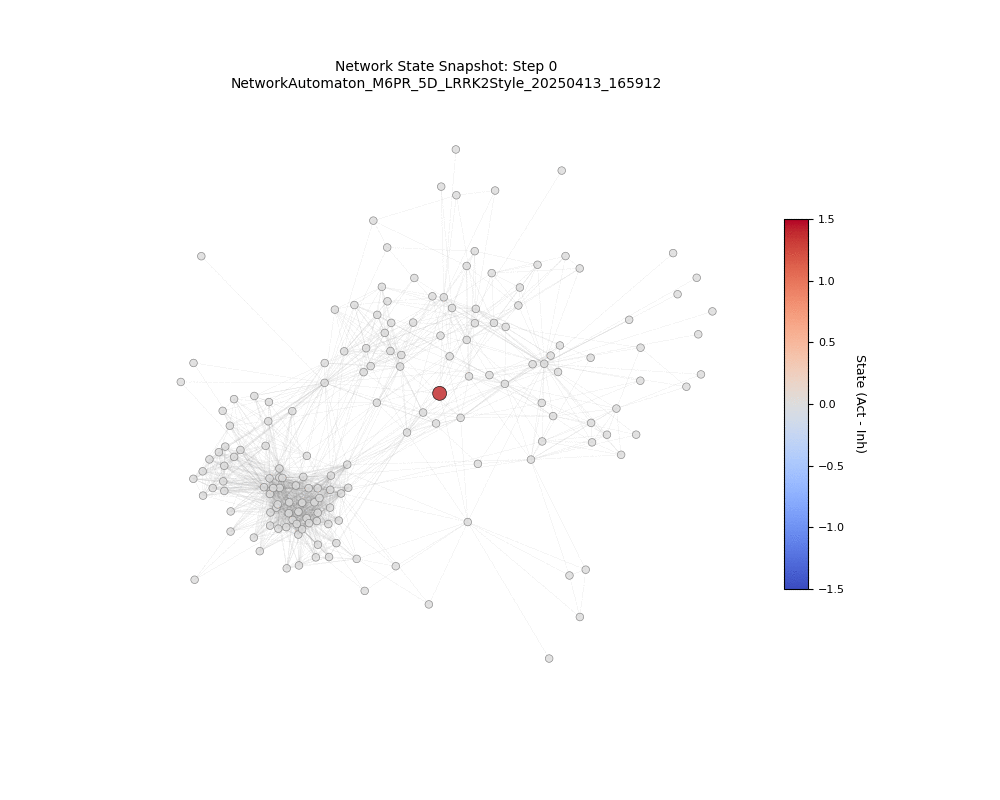


Cell 6.1 execution complete.


In [11]:
# Cell 6.1: Animated Network Evolution
# Description: Creates and displays an animated GIF using BASELINE results. Calls visualize_snapshot_5d (defined in Cell 2.2).

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import os
import warnings
import traceback
import time
import subprocess
from tqdm.auto import tqdm
from IPython.display import Image, display

print("\n--- Cell 6.1: Creating Network Evolution Animation ---")

# --- Prerequisites Check ---
anim_error = False
if 'global_state_history_list' not in globals() or not global_state_history_list: print("❌ Skip animation: global_state_history_list missing (Run Cell 6)."); anim_error = True
# Check function signature again
if 'visualize_snapshot_5d' not in globals(): print("❌ Skip animation: visualize_snapshot_5d function missing (Run Cell 2.2)."); anim_error = True
elif not all(arg in visualize_snapshot_5d.__code__.co_varnames for arg in ['add_colorbar', 'verbose']): print("❌ Skip animation: visualize_snapshot_5d function is outdated (missing flags). Re-run Cell 2.2."); anim_error = True
if 'G' not in globals() or G is None: print("❌ Skip animation: Graph G missing."); anim_error = True
if 'global_pos' not in globals() or global_pos is None: print("❌ Skip animation: Layout global_pos missing."); anim_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Skip animation: OUTPUT_DIR missing or invalid."); anim_error = True
if 'EXPERIMENT_NAME' not in globals(): print("❌ Skip animation: EXPERIMENT_NAME missing."); anim_error = True

if not anim_error:
    fig_anim = None
    pbar = None
    anim_filename = os.path.join(OUTPUT_DIR, "network_evolution_baseline.gif")
    animation_saved_successfully = False

    try:
        print("Setting up animation figure...")
        fig_anim, ax_anim = plt.subplots(figsize=(10, 8))
        fig_anim.set_layout_engine('none')

        # --- Setup Colormap and Colorbar ONCE ---
        # *** KEY PART: Ensure this range matches the one used in visualize_snapshot_5d ***
        vmin_anim, vmax_anim = -1.5, 1.5 # Consistent fixed range
        cmap_anim = cm.coolwarm
        norm_anim = mcolors.Normalize(vmin=vmin_anim, vmax=vmax_anim)
        sm_anim = cm.ScalarMappable(cmap=cmap_anim, norm=norm_anim)
        sm_anim.set_array([])
        cbar_anim = fig_anim.colorbar(sm_anim, ax=ax_anim, shrink=0.6, aspect=15, pad=0.02)
        cbar_anim.set_label('State (Act - Inh)', rotation=270, labelpad=15, fontsize=9)
        cbar_anim.ax.tick_params(labelsize=8)
        print("  Added single colorbar for animation using fixed range.")

        # Define the update function for each frame
        def update_frame(frame_info):
            step_num = frame_info
            ax_anim.clear() # Clear previous frame's drawings
            # *** KEY PART: Ensure correct data is passed ***
            # Access the state dictionary for the specific step from the global list
            current_step_state_dict = global_state_history_list[step_num]
            if isinstance(current_step_state_dict, dict):
                 # Call visualizer, ensuring flags are correct
                 visualize_snapshot_5d(G, current_step_state_dict, global_pos,
                                       step_num, EXPERIMENT_NAME, ax=ax_anim,
                                       verbose=False, add_colorbar=False) # Crucial flags
            else:
                 # Handle potential error if history list item isn't a dict
                 ax_anim.text(0.5, 0.5, f'Invalid data step {step_num}', ha='center', va='center', transform=ax_anim.transAxes)
                 warnings.warn(f"Frame {step_num}: Invalid data type in state history list.")
            # Title is set inside visualize_snapshot_5d

        # Choose frames to animate
        history_len = len(global_state_history_list)
        step_interval = max(1, history_len // 100)
        frames_to_render = list(range(0, history_len, step_interval))
        if history_len > 0 and (history_len - 1) not in frames_to_render: frames_to_render.append(history_len - 1)
        total_frames = len(frames_to_render)

        if not frames_to_render: raise ValueError("No frames for animation.")

        print(f"Creating animation object with {total_frames} frames...")
        ani = animation.FuncAnimation(fig_anim, update_frame, frames=frames_to_render, interval=200, repeat=False)

        # Setup progress bar
        pbar = tqdm(total=total_frames, desc="Saving Animation Frames", leave=False)
        def update_progress(current_frame_idx, total_frames_func):
            update_val = int(current_frame_idx + 1);
            if pbar.n < update_val: pbar.update(update_val - pbar.n)

        # Save the animation
        print(f"\nAttempting to save animation to: {anim_filename}")
        print("  ⏳ This may take several minutes...")
        save_start_time = time.time()
        try:
            ani.save(anim_filename, dpi=100, writer='imagemagick', fps=5, progress_callback=update_progress)
            save_end_time = time.time()
            if pbar is not None and not pbar.disable: pbar.close()
            print(f"✅ Animation saved successfully in {save_end_time - save_start_time:.2f}s.")
            animation_saved_successfully = True
        except FileNotFoundError:
             if pbar is not None and not pbar.disable: pbar.close()
             print("❌ ERROR: Could not save animation. 'imagemagick' writer not found.")
        except Exception as e_save:
             if pbar is not None and not pbar.disable: pbar.close()
             print(f"❌ ERROR saving animation: {e_save}")
             if isinstance(e_save, subprocess.CalledProcessError): print(f"   Failed command: {' '.join(e_save.cmd)}")
             traceback.print_exc(limit=2)

    except Exception as e_anim:
         if pbar is not None and not pbar.disable: pbar.close()
         print(f"❌ An error occurred during animation setup: {e_anim}")
         traceback.print_exc(limit=2)
    finally:
         if fig_anim is not None and plt.fignum_exists(fig_anim.number): plt.close(fig_anim)
         if pbar is not None and not pbar.disable:
              try: pbar.close()
              except Exception: pass
         print("Animation generation process finished.")

    # Display the GIF inline if successfully created
    if animation_saved_successfully and os.path.exists(anim_filename):
         print(f"\nDisplaying generated animation: {anim_filename}")
         display(Image(filename=anim_filename))
    elif not anim_error:
        print("\n⚠️ Animation was not successfully saved, cannot display inline.")

else:
    print("Animation skipped due to missing prerequisites.")

print("\nCell 6.1 execution complete.")

### Cell 6.2: 🔬 Interactive Parameter Exploration Setup

**Purpose:** This section introduces interactive widgets (displayed by the next cell, 6.3) to easily re-run the simulation with different parameters for key dynamic factors (`diffusion_factor`, `noise_level`) and the analysis parameter `RED_REGION_THRESHOLD`.

**Rationale:** This allows for rapid experimentation and hypothesis testing without modifying code. You can quickly explore questions like:
*   "Does increasing diffusion spread activity more uniformly?"
*   "How much noise is needed to disrupt emergent patterns?"
*   "How does the analysis threshold (`RED_REGION_THRESHOLD`) affect the size and biological relevance of the identified 'Red Region'?"

**Next Step:** Run Cell 6.3 to display the interactive sliders and the button.

In [12]:
# Cell 6.3: Code - Interactive Parameter Exploration Widgets
# Description: Displays widgets and runs simulation on button click. Overwrites global history.

import ipywidgets as widgets
from IPython.display import display, clear_output
import copy
import time
import numpy as np
import matplotlib.pyplot as plt # Keep for potential dependencies
import traceback # Added for better error display

print("\n--- Cell 6.3: Interactive Parameter Exploration Widgets ---")

# Define the function that runs when the button is clicked (ensure globals are accessible)
def run_simulation_with_params(diffusion, threshold, noise):
    """Helper function called by the interactive widget button."""
    # Make necessary global variables modifiable if they aren't already
    global global_state_history_np, global_state_history_list, RED_REGION_THRESHOLD, global_final_pheromones, global_termination_reason
    # Reference other needed globals (read-only access is usually fine unless modified)
    global G, node_list, node_to_int, initial_states_dict, rule_params, MAX_SIMULATION_STEPS, CONVERGENCE_THRESHOLD, STATE_DIM

    # Ensure the actual runner function from Cell 5 exists
    if "run_simulation_network_automaton" not in globals():
        print("❌ Simulation function `run_simulation_network_automaton` not defined (Run Cell 5).")
        return
    # Ensure prerequisites for the runner are met
    required_globals = ['G', 'initial_states_dict', 'node_list', 'node_to_int', 'rule_params',
                      'MAX_SIMULATION_STEPS', 'CONVERGENCE_THRESHOLD', 'STATE_DIM']
    missing_prereqs = [v for v in required_globals if v not in globals() or globals()[v] is None]
    if missing_prereqs:
        print(f"❌ Missing prerequisites for interactive run: {', '.join(missing_prereqs)}")
        return

    # Update Red Region Threshold globally *before* simulation if logic depends on it
    # Though currently it's only used in Cell 11 post-simulation
    RED_REGION_THRESHOLD = threshold
    print(f"Set RED_REGION_THRESHOLD = {RED_REGION_THRESHOLD} (will be used in Cell 11)")

    # Create modified rule parameters for this run using BASELINE rules as template
    # Make sure rule_params (baseline) is available
    if 'rule_params' not in globals(): print("❌ Baseline rule_params missing."); return
    new_rule_params = copy.deepcopy(rule_params)
    new_rule_params["diffusion_factor"] = diffusion
    new_rule_params["noise_level"] = noise

    print(f"\nRunning INTERACTIVE simulation with:")
    print(f"  diffusion_factor = {diffusion:.3f}")
    print(f"  noise_level = {noise:.4f}")
    print(f"  Max steps = {MAX_SIMULATION_STEPS}")

    start_time = time.time()

    # Call the correctly named function from Cell 5
    # Assign results directly to global variables to overwrite them
    global_state_history_list, global_final_pheromones, global_termination_reason = run_simulation_network_automaton(
        graph_obj=G,
        initial_states_dict=initial_states_dict, # Use the global initial dict from baseline
        config_local={'rule_params': new_rule_params}, # Pass the modified params
        max_steps=MAX_SIMULATION_STEPS, # Use global max steps
        convergence_thresh=CONVERGENCE_THRESHOLD, # Use global threshold
        node_list_local=node_list, # Use global list
        node_to_int_local=node_to_int # Use global map
    )

    end_time = time.time()
    print(f"\n✅ Interactive simulation completed in {end_time - start_time:.2f} seconds. Reason: {global_termination_reason}")

    # Update global numpy history array
    if global_state_history_list:
        print("Attempting to update global numpy history array...")
        global_state_history_np = None # Reset before trying conversion
        try:
            history_len = len(global_state_history_list)
            num_nodes = len(node_list)
            state_array = np.full((history_len, num_nodes, STATE_DIM), np.nan, dtype=float) # Use global STATE_DIM
            default_state_vec = np.full(STATE_DIM, np.nan, dtype=float)
            for t, step_dict in enumerate(global_state_history_list):
                if not isinstance(step_dict, dict): continue
                for i, node in enumerate(node_list):
                    vec = step_dict.get(node, default_state_vec)
                    if isinstance(vec, np.ndarray) and vec.shape == (STATE_DIM,):
                         state_array[t, i, :] = vec
                    #else: leave as NaN
            global_state_history_np = state_array # Update numpy history
            print(f"✅ Global simulation history updated (NumPy shape: {global_state_history_np.shape}).")
            print("   >>> Re-run Cells 7 through 14 to analyze these results <<<")

        except Exception as e:
            print(f"❌ Error reshaping history into numpy array: {e}")
            traceback.print_exc()
            global_state_history_np = None # Ensure it's None on failure
    else:
        print("❌ Simulation did not produce history. Global variables not updated.")
        global_state_history_np = None # Ensure it's None if history list is empty

# --- Setup Interactive Widgets ---
# Ensure rule_params is available from Cell 1 (used for defaults)
widgets_error = False
if 'rule_params' not in globals():
    print("❌ Cannot create widgets: 'rule_params' not found (Run Cell 1)."); widgets_error = True
# Check if Cell 6 ran and set RED_REGION_THRESHOLD
if 'RED_REGION_THRESHOLD' not in globals():
    warnings.warn("⚠️ RED_REGION_THRESHOLD not set globally (Run Cell 1). Using default 0.5 for slider.")
    RED_REGION_THRESHOLD = 0.5 # Define locally for slider default if global missing

# Check if simulation runner function exists
if 'run_simulation_network_automaton' not in globals():
     print("❌ Cannot create widgets: Simulation runner function missing (Run Cell 5)."); widgets_error = True

if not widgets_error:
    diffusion_slider = widgets.FloatSlider(value=rule_params.get("diffusion_factor", 0.05), min=0.0, max=0.2, step=0.01, description="Diffusion:", readout_format='.3f', layout=widgets.Layout(width='400px'))
    threshold_slider = widgets.FloatSlider(value=RED_REGION_THRESHOLD, min=0.1, max=1.5, step=0.05, description="Red Thresh:", readout_format='.2f', layout=widgets.Layout(width='400px'))
    noise_slider = widgets.FloatSlider(value=rule_params.get("noise_level", 0.001), min=0.0, max=0.01, step=0.001, description="Noise:", readout_format='.4f', layout=widgets.Layout(width='400px'))
    run_button = widgets.Button(description="Run Simulation with Sliders")
    output_area = widgets.Output(layout={'border': '1px solid black'}) # Add border to output area

    # Define the callback function *inside* the scope where sliders/output_area are defined
    def on_run_button_clicked_interact(b):
        with output_area:
            clear_output(wait=True) # wait=True prevents flickering
            try: # Add try-except around the simulation call
                 run_simulation_with_params(diffusion_slider.value, threshold_slider.value, noise_slider.value)
            except Exception as e_widget_run:
                 print(f"❌ Error during interactive simulation run: {e_widget_run}")
                 traceback.print_exc()

    run_button.on_click(on_run_button_clicked_interact)

    # Display widgets
    print("\n--- Interactive Simulation Controls ---")
    display(widgets.VBox([
        widgets.HBox([diffusion_slider, noise_slider]),
        threshold_slider,
        run_button,
        output_area # Display the output area
     ]))
else:
     print("\nInteractive widgets cannot be displayed due to missing prerequisites.")


print("\nCell 6.3 execution complete.")


--- Cell 6.3: Interactive Parameter Exploration Widgets ---

--- Interactive Simulation Controls ---



Cell 6.3 execution complete.


In [13]:
# Cell 7: Data Formatting & Basic Analysis (Initial)
# Description: Uses numpy history from last run. Formats history to DFs. Calculates variance & identifies
# top nodes by activation (last run) and degree (static baseline). Saves initial results.

import os
import numpy as np
import pandas as pd
import networkx as nx
import warnings
import pickle
import traceback

# Baseline method imports (ensure installed: pip install python-igraph leidenalg)
# These are checked here for the degree calculation, Leiden check needed later in 11.1
try:
    import igraph as ig
    import leidenalg as la
    HAS_LEIDEN = True # Assume available for now, check specifically in 11.1
except ImportError:
    # Warning about Leiden was moved to Cell 0 setup
    HAS_LEIDEN = False

print("\n--- Cell 7: Data Formatting & Basic Analysis (Initial) ---")

# --- Prerequisites Check ---
prereq_missing_cell7 = False
if 'global_state_history_np' not in globals() or not isinstance(global_state_history_np, np.ndarray): print("❌ Formatting Error: Numpy history 'global_state_history_np' missing or invalid."); prereq_missing_cell7 = True
if 'global_node_list' not in globals() or not isinstance(global_node_list, list) or not global_node_list: print("❌ Formatting Error: Node list missing or invalid."); prereq_missing_cell7 = True
if 'OUTPUT_DIR' not in globals() or not isinstance(OUTPUT_DIR, str): print("❌ Formatting Error: OUTPUT_DIR missing or invalid."); prereq_missing_cell7 = True
elif not os.path.isdir(OUTPUT_DIR): print(f"❌ Output directory '{OUTPUT_DIR}' invalid."); prereq_missing_cell7 = True
if 'STATE_DIM' not in globals() or not isinstance(STATE_DIM, int): print("❌ Formatting Error: STATE_DIM missing or invalid."); prereq_missing_cell7 = True
if 'G' not in globals() or not isinstance(G, nx.Graph): print("❌ Formatting Error: Graph G missing or invalid."); prereq_missing_cell7 = True
if 'NODES_TO_PLOT_COUNT' not in globals() or not isinstance(NODES_TO_PLOT_COUNT, int): print("❌ Formatting Error: NODES_TO_PLOT_COUNT missing or invalid."); prereq_missing_cell7 = True


# Initialize global vars created/used here
global_act_history_df = pd.DataFrame()
global_inh_history_df = pd.DataFrame()
global_final_variance_act = np.nan
global_top_nodes_act_run = [] # Top nodes from the *last* simulation run
global_baseline_nodes_degree = [] # Top nodes by degree (static)

final_activations = pd.Series(dtype=float)
final_step_index = -1

if not prereq_missing_cell7:
    print("Reformatting state history to DataFrames...")
    try:
        num_steps, num_nodes, state_dim_loaded = global_state_history_np.shape
        if num_nodes != len(global_node_list):
            raise ValueError(f"Node count mismatch: History ({num_nodes}) vs Node List ({len(global_node_list)}).")
        if state_dim_loaded != STATE_DIM:
             raise ValueError(f"State dim mismatch: History ({state_dim_loaded}) vs Config ({STATE_DIM}).")

        # Create DataFrames for Activation (Dim 0) and Inhibition (Dim 1)
        global_act_history_df = pd.DataFrame(global_state_history_np[:, :, 0], columns=global_node_list)
        global_act_history_df.index.name = 'Time Step'
        if STATE_DIM > 1:
            global_inh_history_df = pd.DataFrame(global_state_history_np[:, :, 1], columns=global_node_list)
            global_inh_history_df.index.name = 'Time Step'
        else:
            global_inh_history_df = pd.DataFrame(index=global_act_history_df.index, columns=global_node_list) # Empty placeholder if 1D
            global_inh_history_df.index.name = 'Time Step'
        print("✅ State history reformatted.")

        # --- Basic Analysis of LAST RUN results ---
        print("\nAnalyzing results from the last simulation run...")
        nan_frac_act = global_act_history_df.isnull().sum().sum() / global_act_history_df.size if global_act_history_df.size > 0 else 0
        if nan_frac_act > 0.1:
            # Suppress warning if desired, or keep it
            # warnings.warn(f"⚠️ High NaN fraction ({nan_frac_act:.1%}) found in activation history.")
            print(f"   (Note: High NaN fraction ({nan_frac_act:.1%}) found in activation history.)")


        if not global_act_history_df.empty:
            final_step_index = global_act_history_df.index.max() # Index of last time step
            final_activations = global_act_history_df.loc[final_step_index].dropna() # Get last state, drop NaNs
            if not final_activations.empty:
                # Calculate Variance
                global_final_variance_act = np.var(final_activations.values)
                print(f"📈 Final Activation Variance (Last Run): {global_final_variance_act:.6f}")
                # Identify Top Nodes by Activation (from this run)
                n_plot = NODES_TO_PLOT_COUNT
                global_top_nodes_act_run = final_activations.sort_values(ascending=False).head(n_plot).index.tolist()
                print(f"🔝 Top {len(global_top_nodes_act_run)} nodes by final activation (Last Run): {global_top_nodes_act_run}")
            else:
                # Changed to print instead of warning
                print("   (Note: No valid final activation states found for last run.)")
                global_final_variance_act = np.nan
                global_top_nodes_act_run = []
        else:
            # Changed to print instead of warning
            print("   (Note: Activation history DataFrame empty for last run.)")
            global_final_variance_act = np.nan
            global_top_nodes_act_run = []

        # --- Calculate Degree Baseline (Static Property) ---
        print("\nCalculating Degree baseline...")
        try:
            degrees = dict(G.degree())
            # Filter degrees for nodes present in the simulation's node list
            degrees_filtered = {node: deg for node, deg in degrees.items() if node in global_node_list}
            if degrees_filtered:
                n_plot_degree = NODES_TO_PLOT_COUNT # Use same N for consistency
                global_baseline_nodes_degree = sorted(degrees_filtered, key=degrees_filtered.get, reverse=True)[:n_plot_degree]
                print(f"  ✅ Baseline: Identified top {len(global_baseline_nodes_degree)} nodes by degree.")
            else:
                print("  ⚠️ Baseline (Degree): No degrees found for nodes present in simulation node_list.")
                global_baseline_nodes_degree = []
        except Exception as e_deg:
            print(f"  ❌ Error calculating Degree baseline: {e_deg}")
            global_baseline_nodes_degree = []


        # --- Save Initial Results ---
        print("\n--- Saving Initial Analysis Data ---")
        # Save history DFs
        act_hist_path = os.path.join(OUTPUT_DIR, "activation_history_CURRENT.csv") # Mark as current run
        inh_hist_path = os.path.join(OUTPUT_DIR, "inhibition_history_CURRENT.csv")
        global_act_history_df.to_csv(act_hist_path)
        global_inh_history_df.to_csv(inh_hist_path)
        print(f"✅ Saved history DataFrames (Current Run) to: {OUTPUT_DIR}")

        # Save Top Node Lists (Activation from this run + Degree Baseline)
        top_nodes_path = os.path.join(OUTPUT_DIR, "top_nodes_initial.txt")
        with open(top_nodes_path, 'w') as f:
            f.write("--- Top Nodes by Final Activation (Last Run) ---\n")
            f.write('\n'.join(global_top_nodes_act_run) if global_top_nodes_act_run else "N/A\n")
            f.write("\n--- Baseline: Top Nodes by Degree ---\n")
            f.write('\n'.join(global_baseline_nodes_degree) if global_baseline_nodes_degree else "N/A\n")
        print(f"✅ Saved initial top node lists to: {top_nodes_path}")

        # Save Final Pheromones from last run
        if 'global_final_pheromones' in globals() and isinstance(global_final_pheromones, dict):
            pheromone_path = os.path.join(OUTPUT_DIR, "final_pheromones_CURRENT.pkl")
            try:
                with open(pheromone_path, 'wb') as f:
                    pickle.dump(global_final_pheromones, f)
                print(f"✅ Saved final pheromones (Current Run) to: {pheromone_path}")
            except Exception as e_pickle:
                 print(f"   ⚠️ Warning: Could not save pheromones. Error: {e_pickle}")
        else:
            print("   (Info: Skipping pheromone saving - data missing, empty, or not a dict).")

    except Exception as e:
        print(f"❌ Error during initial data formatting/analysis/saving: {e}")
        traceback.print_exc()
        # Reset potentially partially populated globals on error
        global_act_history_df = pd.DataFrame(); global_inh_history_df = pd.DataFrame()
        global_final_variance_act = np.nan; global_top_nodes_act_run = []; global_baseline_nodes_degree = []
        prereq_missing_cell7 = True # Indicate failure

else:
    print("Skipping Initial Analysis (Cell 7) due to missing prerequisites.")

print("\nCell 7 execution complete.")


--- Cell 7: Data Formatting & Basic Analysis (Initial) ---
Reformatting state history to DataFrames...
✅ State history reformatted.

Analyzing results from the last simulation run...
📈 Final Activation Variance (Last Run): 0.711923
🔝 Top 10 nodes by final activation (Last Run): ['9606.ENSP00000297135', '9606.ENSP00000381293', '9606.ENSP00000466298', '9606.ENSP00000258301', '9606.ENSP00000267199', '9606.ENSP00000463393', '9606.ENSP00000450731', '9606.ENSP00000441158', '9606.ENSP00000305442', '9606.ENSP00000391826']

Calculating Degree baseline...
  ✅ Baseline: Identified top 10 nodes by degree.

--- Saving Initial Analysis Data ---
✅ Saved history DataFrames (Current Run) to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912
✅ Saved initial top node lists to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/top_nodes_initial.txt
✅ Saved final pheromones (Current Run) to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Sty


--- Cell 7.1: State-space Trajectory Analysis (PCA) ---
Input history shape for PCA: (5001, 163, 5)
Reshaping state history for PCA (flattening nodes*dims)...
Running PCA on data shape: (5001, 815)
Explained Variance Ratio (PC1, PC2): [0.02076287 0.01020474]
Plotting PCA trajectory...
✅ State-space trajectory plot saved to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/state_space_trajectory_pca.png

Displaying generated PCA plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/state_space_trajectory_pca.png


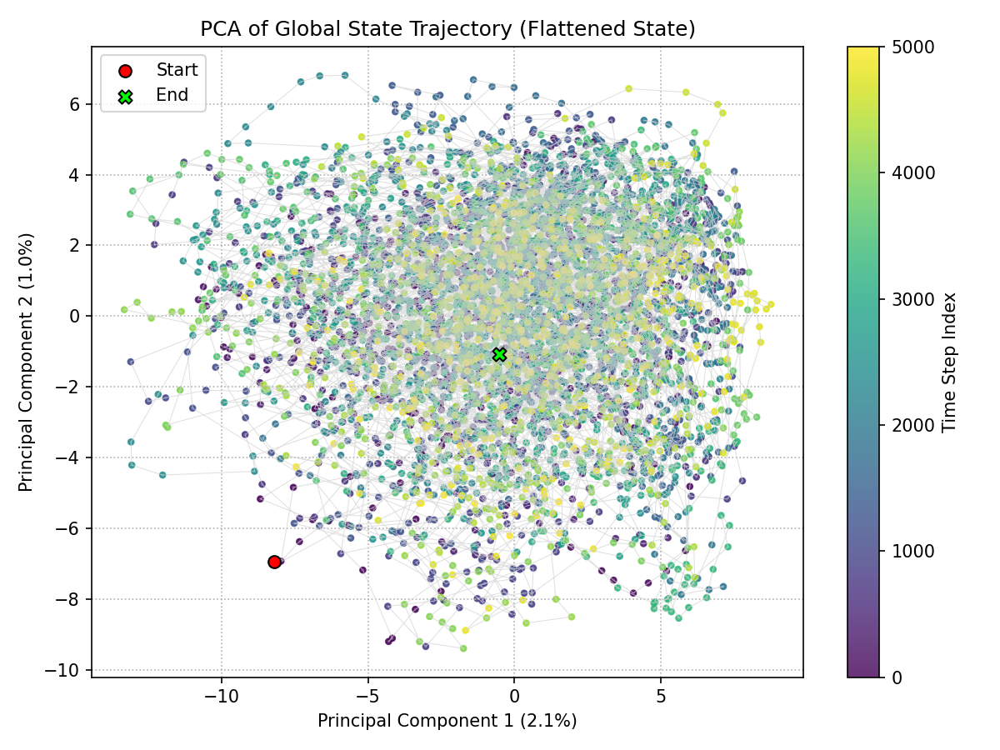


--- Interpretation: PCA & Neuromorphic Links ---
PCA Interpretation:
  - The trajectory shows the system moving rapidly from its initial state (red circle)
    into a complex, high-dimensional region where it spends most of the simulation time.
  - The trajectory does *not* converge to a single point, consistent with the lack of simple convergence
    and supporting the idea of complex dynamics or exploration of a metastable region.
  - The low explained variance by the first two PCs indicates the system's dynamics are truly high-dimensional.

Neuromorphic Principles Demonstrated:
  - **Emergence from Local Rules:** Complex global patterns (Red Region, PCA trajectory) arise solely from simple, local node interactions.
  - **Network Influence:** The graph structure clearly constrains and channels the flow of activity.
  - **Dynamic Equilibrium/Metastability:** The system doesn't settle into a fixed point but maintains activity patterns over time (see Cell 13.4/13.5), analogous to persi

In [14]:
# Cell 7.1: Advanced Analysis – State-space Trajectory & Neuromorphic Notes
# Description: Performs PCA on the global state trajectory (flattened) and plots the trajectory.
# Includes commentary on potential neuromorphic mapping interpretation.

import matplotlib.pyplot as plt
import numpy as np
import os
import warnings
import traceback
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler # Added for potential scaling before PCA
from IPython.display import display, Image # Added import

print("\n--- Cell 7.1: State-space Trajectory Analysis (PCA) ---")

# --- Prerequisites Check ---
pca_error = False
if 'global_state_history_np' not in globals() or global_state_history_np is None:
    print("❌ PCA Error: global_state_history_np not found (Run Cell 6 or 6.3).")
    pca_error = True
elif not isinstance(global_state_history_np, np.ndarray) or global_state_history_np.ndim != 3:
     print(f"❌ PCA Error: global_state_history_np has unexpected dimensions ({global_state_history_np.ndim}), expected 3.")
     pca_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR):
    print("❌ PCA Error: OUTPUT_DIR missing or invalid.")
    pca_error = True

if not pca_error:
    fig_pca = None # Initialize fig handle
    pca_plot_filename = os.path.join(OUTPUT_DIR, "state_space_trajectory_pca.png") # Define filename
    pca_success = False # Flag
    try:
        num_steps, num_nodes, num_dims = global_state_history_np.shape
        print(f"Input history shape for PCA: ({num_steps}, {num_nodes}, {num_dims})")

        # Flatten state: Each time step becomes a single vector of size num_nodes * num_dims
        print("Reshaping state history for PCA (flattening nodes*dims)...")
        flat_dim = num_nodes * num_dims
        if flat_dim > 25000: # Heuristic limit for warning
             warnings.warn(f"Flattened dimension ({flat_dim}) is very large. PCA might be slow or memory-intensive.")
        reshaped_states = global_state_history_np.reshape(num_steps, -1)

        # Handle potential NaNs before scaling/PCA
        if np.isnan(reshaped_states).any():
             warnings.warn("NaNs detected in reshaped state history. Imputing with column means.")
             col_means = np.nanmean(reshaped_states, axis=0)
             nan_indices = np.where(np.isnan(reshaped_states));
             if np.isnan(col_means).any(): raise ValueError("Cannot impute NaNs because some full features are NaN.")
             reshaped_states[nan_indices] = np.take(col_means, nan_indices[1])
             if np.isnan(reshaped_states).any(): raise ValueError("Imputation failed, NaNs still present after attempting mean imputation.")
             print("  NaN imputation complete.")
        data_for_pca = reshaped_states

        if data_for_pca.shape[0] < 2:
             print("❌ PCA Error: Not enough valid time steps (>=2) after handling NaNs.")
             pca_error = True # Treat as error for subsequent steps
        else:
            print(f"Running PCA on data shape: {data_for_pca.shape}")
            # Scale data before PCA for better results
            scaler = StandardScaler()
            scaled_data = scaler.fit_transform(data_for_pca)

            pca = PCA(n_components=2) # Reduce to 2 principal components
            state_space_pca = pca.fit_transform(scaled_data) # Use scaled data

            print(f"Explained Variance Ratio (PC1, PC2): {pca.explained_variance_ratio_}")

            # Plot the trajectory in the PCA space
            print("Plotting PCA trajectory...")
            fig_pca, ax_pca = plt.subplots(figsize=(8, 6)) # Assign figure handle
            # Plot lines connecting points
            ax_pca.plot(state_space_pca[:,0], state_space_pca[:,1], '-', color='lightgray', linewidth=0.5, alpha=0.7)
            # Plot points colored by time step
            time_points = np.arange(state_space_pca.shape[0])
            scatter = ax_pca.scatter(state_space_pca[:,0], state_space_pca[:,1], c=time_points, cmap='viridis', s=10, alpha=0.8, rasterized=True) # Rasterize large scatter plots
            ax_pca.set_title('PCA of Global State Trajectory (Flattened State)')
            ax_pca.set_xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.1%})') # Show variance %
            ax_pca.set_ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.1%})') # Show variance %
            ax_pca.grid(True, linestyle=':')
            # Add a colorbar indicating time
            cbar = fig_pca.colorbar(scatter, label='Time Step Index')
            # Highlight start and end points
            ax_pca.scatter(state_space_pca[0,0], state_space_pca[0,1], color='red', s=50, marker='o', label='Start', zorder=5, edgecolors='black')
            ax_pca.scatter(state_space_pca[-1,0], state_space_pca[-1,1], color='lime', s=60, marker='X', label='End', zorder=5, edgecolors='black')
            ax_pca.legend()

            plt.tight_layout()
            plt.savefig(pca_plot_filename, dpi=150)
            print(f"✅ State-space trajectory plot saved to: {pca_plot_filename}")
            pca_success = True # Flag success

    except Exception as e:
        print(f"❌ Error during PCA analysis: {e}")
        traceback.print_exc(limit=2)
        pca_error = True # Ensure error is flagged
    finally:
        # Close the figure handle regardless of success
        if fig_pca is not None and plt.fignum_exists(fig_pca.number):
             plt.close(fig_pca)

    # --- Display Saved Plot ---
    if pca_success and os.path.exists(pca_plot_filename):
        print(f"\nDisplaying generated PCA plot: {pca_plot_filename}")
        display(Image(filename=pca_plot_filename))
    elif not pca_error: # Only mention if not skipped due to prereq errors
        print("\n⚠️ PCA plot not generated due to errors, cannot display inline.")


# --- Interpretation & Neuromorphic Notes ---
print("\n--- Interpretation: PCA & Neuromorphic Links ---")
print("PCA Interpretation:")
print("  - The trajectory shows the system moving rapidly from its initial state (red circle)")
print("    into a complex, high-dimensional region where it spends most of the simulation time.")
print("  - The trajectory does *not* converge to a single point, consistent with the lack of simple convergence")
print("    and supporting the idea of complex dynamics or exploration of a metastable region.")
print("  - The low explained variance by the first two PCs indicates the system's dynamics are truly high-dimensional.")
print("\nNeuromorphic Principles Demonstrated:")
print("  - **Emergence from Local Rules:** Complex global patterns (Red Region, PCA trajectory) arise solely from simple, local node interactions.")
print("  - **Network Influence:** The graph structure clearly constrains and channels the flow of activity.")
print("  - **Dynamic Equilibrium/Metastability:** The system doesn't settle into a fixed point but maintains activity patterns over time (see Cell 13.4/13.5), analogous to persistent activity or dynamic states in neural circuits.")
print("  - **Adaptation Analogue:** The 'pheromone' mechanism, while simple, demonstrates activity-dependent modification of interaction strength, a core concept in synaptic plasticity.")
print("Conclusion: While not a direct neural model, this Network Automaton exhibits computational principles like emergence, dynamic stability, and adaptation that are central to brain-inspired computing, demonstrating their potential applicability to other complex network types like PPIs.")


print("\nCell 7.1 execution complete.")


--- Cell 7.2: PCA Analysis of State Trajectory (Current Run) ---
Performing PCA on state history shape: (5001, 163, 5)
Scaling data before PCA...
Fitting PCA (2 components)...
PCA Explained Variance Ratio: 0.021 (PC1), 0.010 (PC2)
✅ State-space trajectory plot saved to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/state_space_trajectory_CURRENT.png

Displaying generated PCA plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/state_space_trajectory_CURRENT.png


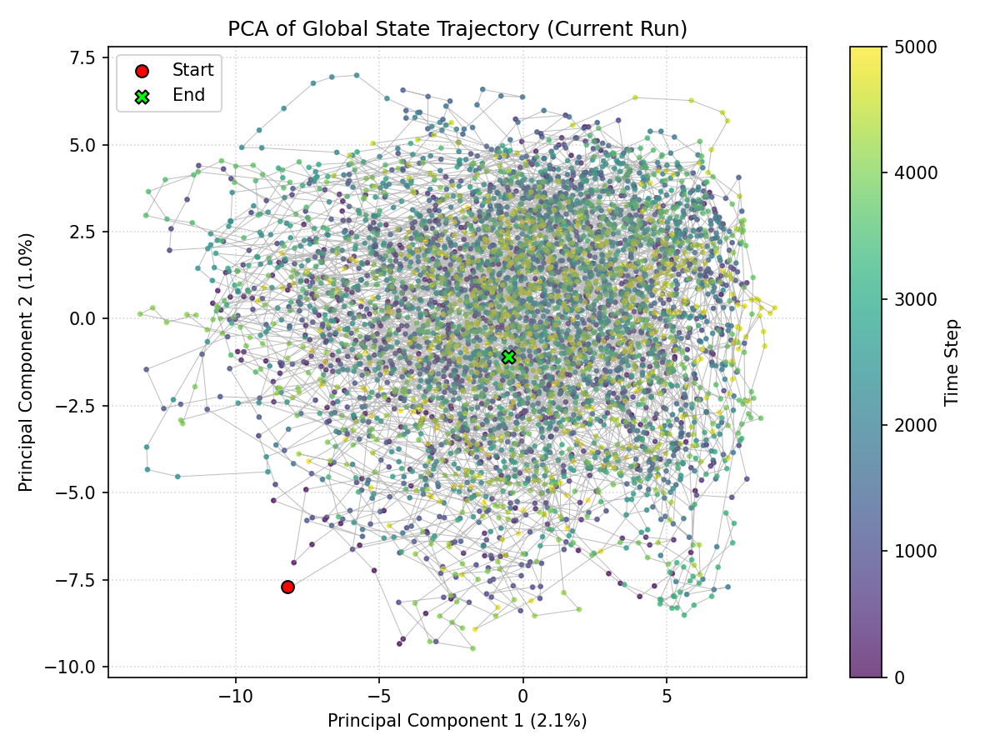


Cell 7.2 execution complete.


In [15]:
# Cell 7.2: PCA Analysis of State Trajectory (Current Run)
# Description: Performs PCA on the *current* simulation state history, plots the trajectory, and displays inline.

import matplotlib.pyplot as plt
import numpy as np
import os
import warnings
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Image # Added import
import traceback

print("\n--- Cell 7.2: PCA Analysis of State Trajectory (Current Run) ---")

# Define plot filename early
pca_plot_filename = os.path.join(OUTPUT_DIR, "state_space_trajectory_CURRENT.png")
pca_success = False # Flag
pca_error_cell72 = False # Local error flag

# Check prerequisites
if 'global_state_history_np' not in globals() or global_state_history_np is None:
    print("⚠️ PCA Error: global_state_history_np not available (Run Cell 6 or 6.3).")
    pca_error_cell72 = True
elif not isinstance(global_state_history_np, np.ndarray) or global_state_history_np.ndim != 3:
    print(f"⚠️ PCA Error: global_state_history_np has invalid shape/type ({global_state_history_np.shape}, {type(global_state_history_np)}).")
    pca_error_cell72 = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR):
    print("⚠️ PCA Error: OUTPUT_DIR is missing or invalid.")
    pca_error_cell72 = True


if not pca_error_cell72:
    fig_pca = None # Initialize fig handle
    try:
        print(f"Performing PCA on state history shape: {global_state_history_np.shape}")
        n_steps, n_nodes, n_dims = global_state_history_np.shape

        # Handle potential NaNs before reshaping and scaling
        if np.isnan(global_state_history_np).any():
             warnings.warn("NaNs detected in state history. Attempting imputation (mean)...")
             # Flatten first to impute across nodes/dims for each step if needed
             flat_states_for_impute = global_state_history_np.reshape(n_steps, n_nodes * n_dims)
             # Impute using column means
             col_means = np.nanmean(flat_states_for_impute, axis=0)
             nan_indices = np.where(np.isnan(flat_states_for_impute));
             if np.isnan(col_means).any(): raise ValueError("Cannot impute NaNs because some full features are NaN.")
             flat_states_for_impute[nan_indices] = np.take(col_means, nan_indices[1])
             if np.isnan(flat_states_for_impute).any(): raise ValueError("Imputation failed, NaNs still present.")
             # Reshape back (optional, could work with flat) - or just use flat_states_for_impute
             imputed_history = flat_states_for_impute.reshape(n_steps, n_nodes, n_dims)
             data_to_flatten = imputed_history # Use imputed data
             print("  Imputation complete.")
        else:
             data_to_flatten = global_state_history_np # Use original data

        # Flatten the (potentially imputed) data
        flat_states = data_to_flatten.reshape(n_steps, n_nodes * n_dims)

        if flat_states.shape[0] < 2: # Check if enough steps remain
            raise ValueError("Not enough time steps (>=2) for PCA.")

        print("Scaling data before PCA...")
        scaler = StandardScaler(); scaled_states = scaler.fit_transform(flat_states)
        print("Fitting PCA (2 components)...")
        pca = PCA(n_components=2); state_space_pca = pca.fit_transform(scaled_states)
        explained_variance = pca.explained_variance_ratio_
        print(f"PCA Explained Variance Ratio: {explained_variance[0]:.3f} (PC1), {explained_variance[1]:.3f} (PC2)")

        # --- Plot the trajectory ---
        fig_pca, ax_pca = plt.subplots(figsize=(8, 6)) # Assign figure handle
        time_points = np.arange(n_steps) # Color by time
        # Plot trajectory line
        ax_pca.plot(state_space_pca[:,0], state_space_pca[:,1], '-', color='grey', linewidth=0.5, alpha=0.5)
        # Plot scatter points colored by time
        scatter = ax_pca.scatter(state_space_pca[:,0], state_space_pca[:,1], c=time_points, cmap='viridis', s=5, alpha=0.7, rasterized=True) # Rasterize for large N
        # Add labels and title
        ax_pca.set_title('PCA of Global State Trajectory (Current Run)')
        ax_pca.set_xlabel(f'Principal Component 1 ({explained_variance[0]:.1%})') # Show variance %
        ax_pca.set_ylabel(f'Principal Component 2 ({explained_variance[1]:.1%})') # Show variance %
        ax_pca.grid(True, linestyle=':', alpha=0.5)
        # Add colorbar
        fig_pca.colorbar(scatter, label='Time Step', ax=ax_pca) # Pass ax to colorbar
        # Add start/end markers
        ax_pca.scatter(state_space_pca[0,0], state_space_pca[0,1], color='red', s=50, marker='o', label='Start', zorder=5, edgecolors='black')
        ax_pca.scatter(state_space_pca[-1,0], state_space_pca[-1,1], color='lime', s=60, marker='X', label='End', zorder=5, edgecolors='black')
        ax_pca.legend()
        plt.tight_layout()

        # Save and flag success
        plt.savefig(pca_plot_filename, dpi=150)
        print(f"✅ State-space trajectory plot saved to: {pca_plot_filename}")
        pca_success = True
        # Don't show with plt.show() if we display inline later

    except Exception as e:
        print(f"❌ Error during PCA analysis: {e}")
        traceback.print_exc()
    finally:
        # Close the figure handle regardless of success
        if fig_pca is not None and plt.fignum_exists(fig_pca.number):
            plt.close(fig_pca)

    # --- Display the saved PNG inline ---
    if pca_success and os.path.exists(pca_plot_filename):
        print(f"\nDisplaying generated PCA plot: {pca_plot_filename}")
        display(Image(filename=pca_plot_filename))
    elif not pca_error_cell72: # Only mention if not skipped due to prereq errors
        print("\n⚠️ PCA plot not generated due to errors, cannot display inline.")

else:
    print("⚠️ PCA Analysis skipped due to missing prerequisites.")

print("\nCell 7.2 execution complete.")


--- Cell 8: Time Series Visualization (Network Automaton - M6PR) ---
Plotting state evolution for top 10 nodes by degree (baseline list).
✅ Saved time series plot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/timeseries_top_nodes_CURRENT.png

Displaying generated time series plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/timeseries_top_nodes_CURRENT.png


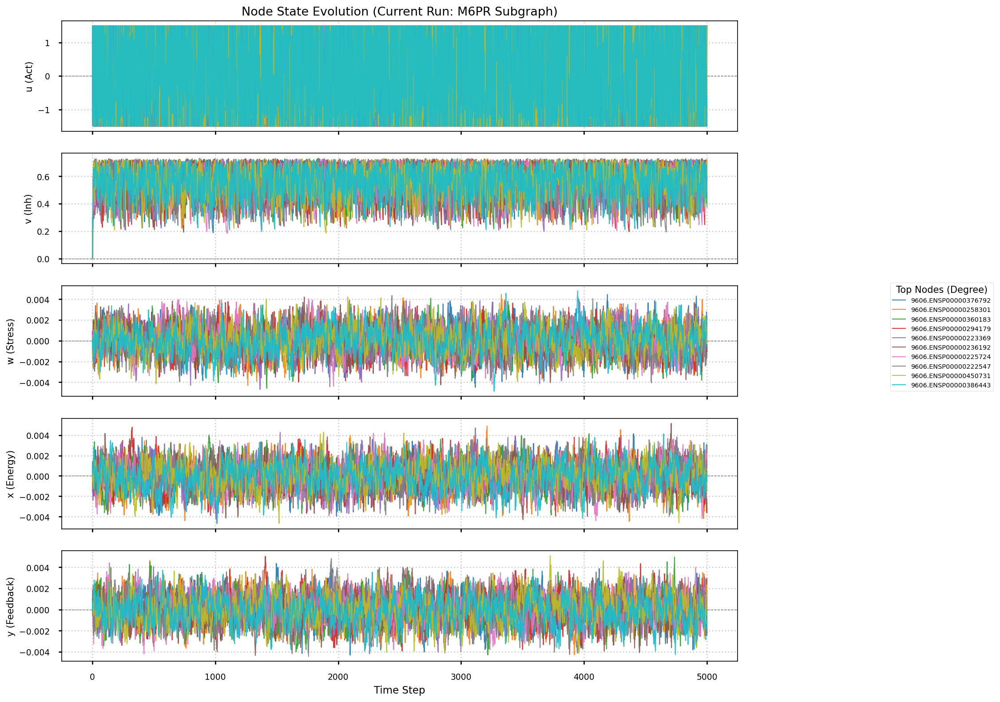


Cell 8 execution complete.


In [16]:
# Cell 8: Time Series Visualization (Network Automaton - M6PR)
# Description: Plots state evolution for top N nodes (by degree), saves plot, and displays inline. Uses data from last run.

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns # Keep for potential style usage
import os
import warnings
import networkx as nx # Keep for graph checks if needed
import traceback
from IPython.display import display, Image # Added import

print("\n--- Cell 8: Time Series Visualization (Network Automaton - M6PR) ---")

# --- Prerequisites Check ---
plot_error_cell8 = False
# Use globally stored DFs from Cell 7
if 'global_act_history_df' not in globals() or global_act_history_df.empty: print("❌ Skip plot: Activation history DF missing (Run Cell 7)."); plot_error_cell8 = True
# Check Inhibition DF if state dim > 1
if 'STATE_DIM' in globals() and STATE_DIM > 1 and ('global_inh_history_df' not in globals() or global_inh_history_df.empty):
    print("   (Info: Inhibition history DF missing or empty for multi-dimensional state.)") # Less alarming than warning
# Check top nodes list (Use degree baseline list calculated in Cell 7)
if 'global_baseline_nodes_degree' not in globals() or not global_baseline_nodes_degree:
     print("❌ Skip plot: Top nodes by degree list ('global_baseline_nodes_degree') missing (Run Cell 7)."); plot_error_cell8 = True
# Check other globals
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Skip plot: OUTPUT_DIR missing or invalid."); plot_error_cell8 = True
if 'NODES_TO_PLOT_COUNT' not in globals(): print("❌ Skip plot: NODES_TO_PLOT_COUNT missing."); plot_error_cell8 = True
if 'STATE_DIM' not in globals(): print("❌ Skip plot: STATE_DIM missing."); plot_error_cell8=True
if 'TARGET_NODE_NAME' not in globals(): print("❌ Skip plot: TARGET_NODE_NAME missing."); plot_error_cell8=True
if 'node_to_int' not in globals(): print("❌ Skip plot: node_to_int missing."); plot_error_cell8=True
if 'global_state_history_np' not in globals() and 'STATE_DIM' in globals() and STATE_DIM > 2: print("❌ Skip plot: global_state_history_np missing (needed for dims > 1)."); plot_error_cell8=True

# Define plot filename early
plot_filename = os.path.join(OUTPUT_DIR, "timeseries_top_nodes_CURRENT.png")
plot_success_cell8 = False # Flag

if not plot_error_cell8:
    # Use the degree baseline list from Cell 7
    nodes_to_plot_ts = global_baseline_nodes_degree # Already truncated to NODES_TO_PLOT_COUNT in Cell 7
    print(f"Plotting state evolution for top {len(nodes_to_plot_ts)} nodes by degree (baseline list).")

    fig_ts = None # Initialize fig handle
    try:
         # --- Setup Figure ---
         n_colors = len(nodes_to_plot_ts)
         plt.style.use('seaborn-v0_8-talk')
         fig_ts, axes_ts = plt.subplots(STATE_DIM, 1, figsize=(14, 2.5 * STATE_DIM), sharex=True, squeeze=False) # Use squeeze=False
         axes_ts = axes_ts.flatten() # Ensure axes_ts is always a flat array

         # Use a consistent colormap
         colors = plt.cm.viridis(np.linspace(0, 1, n_colors)) if n_colors > 10 else plt.cm.tab10(np.linspace(0, 1, n_colors))
         dim_labels = ['u (Act)', 'v (Inh)', 'w (Stress)', 'x (Energy)', 'y (Feedback)']
         nodes_plotted_ts_local = set() # Track nodes successfully plotted using a set
         plot_data_found = False # Flag if any data was plotted at all

         # --- Loop through Dimensions and Nodes ---
         for d, ax in enumerate(axes_ts):
             if d >= len(dim_labels) or d >= STATE_DIM: break # Check against STATE_DIM too
             ax.set_ylabel(dim_labels[d], fontsize=10); ax.tick_params(labelsize=9)
             ax.grid(True, linestyle=':', alpha=0.6); ax.axhline(0, color='grey', lw=0.7, linestyle='--')

             for i, node_id in enumerate(nodes_to_plot_ts):
                 color = colors[i % n_colors]
                 timeseries_data = None

                 # --- Get Timeseries Data ---
                 if d == 0: # Activation
                     if not global_act_history_df.empty and node_id in global_act_history_df.columns: timeseries_data = global_act_history_df[node_id]
                 elif d == 1: # Inhibition
                     if 'global_inh_history_df' in globals() and not global_inh_history_df.empty and node_id in global_inh_history_df.columns: timeseries_data = global_inh_history_df[node_id]
                 else: # Other dimensions from numpy array
                     if 'global_state_history_np' in globals() and global_state_history_np is not None:
                          if node_id in node_to_int:
                               node_idx = node_to_int[node_id]
                               # Check bounds carefully
                               if 0 <= node_idx < global_state_history_np.shape[1] and 0 <= d < global_state_history_np.shape[2]:
                                   timeseries_data = global_state_history_np[:, node_idx, d]

                 # --- Plot Data ---
                 if timeseries_data is not None:
                      # Check if data is all NaN before plotting
                      if isinstance(timeseries_data, pd.Series) and not timeseries_data.isna().all():
                           label = node_id if d == 0 else None # Label only on first plot
                           ax.plot(timeseries_data.index, timeseries_data.values, label=label, color=color, linestyle='-', alpha=0.9, lw=1.0)
                           plot_data_found = True; nodes_plotted_ts_local.add(node_id)
                      elif isinstance(timeseries_data, np.ndarray) and not np.isnan(timeseries_data).all():
                           label = node_id if d == 0 else None
                           ax.plot(range(len(timeseries_data)), timeseries_data, label=label, color=color, linestyle='-', alpha=0.9, lw=1.0)
                           plot_data_found = True; nodes_plotted_ts_local.add(node_id)

         # --- Finalize Plot ---
         if not plot_data_found:
              print("⚠️ No valid data found to plot for selected nodes in any dimension.")
              # No need to close fig_ts here, finally block handles it
         else:
              axes_ts[-1].set_xlabel('Time Step', fontsize=11)
              axes_ts[0].set_title(f'Node State Evolution (Current Run: {TARGET_NODE_NAME} Subgraph)', fontsize=13)
              handles, labels = axes_ts[0].get_legend_handles_labels()
              if handles: # Add legend only if labels were added
                   # Adjust legend position and size
                   fig_ts.legend(handles, labels, loc='center left', bbox_to_anchor=(1.01, 0.5), fontsize='x-small', title="Top Nodes (Degree)")
                   plt.subplots_adjust(right=0.85) # Adjust layout to make space for legend
              else:
                  plt.tight_layout(rect=[0, 0, 1, 0.96]) # Default tight layout if no legend

              global_nodes_plotted_ts = list(nodes_plotted_ts_local) # Update global list

              # --- Save Plot ---
              plt.savefig(plot_filename, dpi=150, bbox_inches='tight')
              print(f"✅ Saved time series plot to: {plot_filename}")
              plot_success_cell8 = True # Set flag on successful save

    except Exception as e:
         print(f"❌ Error generating/saving time series plot: {e}")
         traceback.print_exc()
    finally:
         # Close figure handle AFTER potentially saving and displaying
         if fig_ts is not None and plt.fignum_exists(fig_ts.number):
             plt.close(fig_ts)

    # --- Display Saved Plot ---
    if plot_success_cell8 and os.path.exists(plot_filename):
        print(f"\nDisplaying generated time series plot: {plot_filename}")
        display(Image(filename=plot_filename))
    elif not plot_error_cell8: # Only mention failure if not skipped due to prereqs
        print("\n⚠️ Time series plot not generated/saved due to errors, cannot display inline.")

# Ensure global variable exists even if plotting failed or was skipped
if 'global_nodes_plotted_ts' not in globals(): global_nodes_plotted_ts = []

print("\nCell 8 execution complete.")


--- Cell 9: Basic Analysis & Metric Calculation (Current Run) ---
Calculating final state variance & entropy (from last simulation run)...
  Final Activation Variance: 0.711923
  Final Inhibition Variance: 0.022575

Calculating final state entropy...
  Final Activation Entropy: 2.1329
  Final Inhibition Entropy: 0.9451
  Stored metrics in global_analysis_metrics.

Generating final state distribution plots...
✅ Saved final state distribution plot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/final_state_distributions_CURRENT.png

Displaying generated distribution plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/final_state_distributions_CURRENT.png


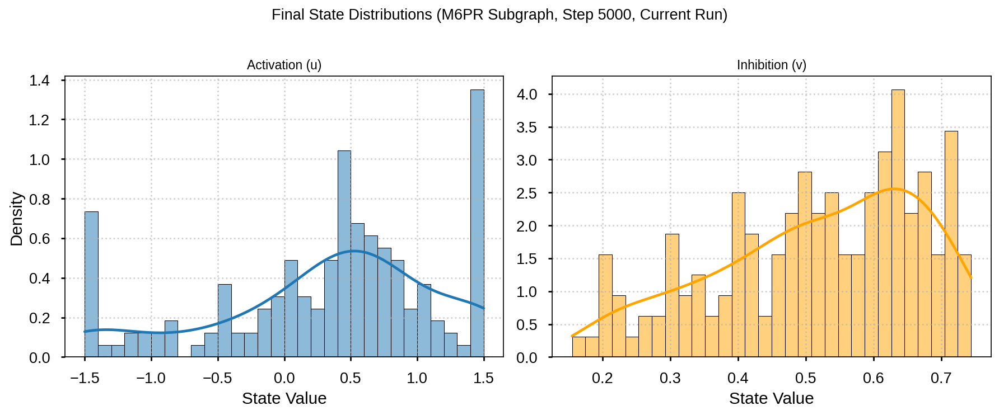


Cell 9 execution complete.


In [17]:
# Cell 9: Basic Analysis & Metric Calculation (Network Automaton - M6PR)
# Description: Calculates final variance and entropy for the current run, plots distributions, and displays inline.

import numpy as np
import pandas as pd
from scipy.stats import entropy as calculate_scipy_entropy
import os
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import traceback
from IPython.display import display, Image # Added import

print("\n--- Cell 9: Basic Analysis & Metric Calculation (Current Run) ---")

# --- Prerequisites Check ---
analysis_error = False
# Use DFs from Cell 7
if 'global_act_history_df' not in globals() or global_act_history_df.empty: print("❌ Skip analysis: Activation history DF missing."); analysis_error = True
# Check Inh DF existence more carefully
if 'STATE_DIM' in globals() and STATE_DIM > 1 and ('global_inh_history_df' not in globals() or global_inh_history_df.empty):
    print("   (Info: Inhibition history DF missing or empty. Will skip Inh metrics/plots.)")
    has_inh_df = False
elif 'global_inh_history_df' in globals() and not global_inh_history_df.empty:
    has_inh_df = True
else: # STATE_DIM <= 1 or DF missing anyway
    has_inh_df = False
# Check other globals
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Skip analysis: OUTPUT_DIR missing or invalid."); analysis_error = True
if 'TARGET_NODE_NAME' not in globals(): print("❌ Skip analysis: TARGET_NODE_NAME missing."); analysis_error=True

# Define filename and success flag
dist_plot_path = os.path.join(OUTPUT_DIR, "final_state_distributions_CURRENT.png")
plot_success_cell9 = False

# Use local dict for metrics calculated here, then update global
analysis_metrics = {}
final_inhibitions = pd.Series(dtype=float)
final_activations = pd.Series(dtype=float)
final_step_index = -1 # Initialize

if not analysis_error:
    # --- Calculate Final Variance & Entropy ---
    print("Calculating final state variance & entropy (from last simulation run)...")
    # Get final states from global DFs (populated in Cell 7)
    if not global_act_history_df.empty:
        final_step_index = global_act_history_df.index.max()
        if final_step_index >= 0: final_activations = global_act_history_df.loc[final_step_index].dropna()
        else: warnings.warn("Invalid final step index for activation.")
    if has_inh_df: # Only try if DF exists
        final_step_index_inh = global_inh_history_df.index.max()
        if final_step_index_inh >= 0: final_inhibitions = global_inh_history_df.loc[final_step_index_inh].dropna()
        else: warnings.warn("Invalid final step index for inhibition.")

    # --- Calculate Variance ---
    if not final_activations.empty:
        final_var_act = np.var(final_activations.values)
        analysis_metrics['final_variance_activation'] = final_var_act
        print(f"  Final Activation Variance: {final_var_act:.6f}")
    else:
        print("  Final Activation Variance: N/A (no valid data)")
        analysis_metrics['final_variance_activation'] = np.nan

    if not final_inhibitions.empty:
        final_var_inh = np.var(final_inhibitions.values)
        analysis_metrics['final_variance_inhibition'] = final_var_inh
        print(f"  Final Inhibition Variance: {final_var_inh:.6f}")
    else:
        print("  Final Inhibition Variance: N/A (no valid data or Inh DF missing)")
        analysis_metrics['final_variance_inhibition'] = np.nan

    # --- Calculate Entropy ---
    print("\nCalculating final state entropy...")
    # Ensure helper function is defined (could move to a utils cell)
    def calculate_final_entropy(state_series, num_bins=10, state_range=(-1.5, 1.5)):
        if not isinstance(state_series, pd.Series) or state_series.empty: return np.nan
        valid_states = state_series.dropna().values;
        if valid_states.size <= 1: return 0.0
        try:
            hist_range = state_range if state_range and len(state_range) == 2 else None
            counts, _ = np.histogram(valid_states, bins=num_bins, range=hist_range)
            counts_sum = counts.sum();
            if counts_sum > 0: probs = counts / counts_sum; return calculate_scipy_entropy(probs[probs > 0])
            else: return 0.0
        except Exception as e: print(f" Entropy calc error: {e}"); return np.nan

    if not final_activations.empty:
        final_ent_act = calculate_final_entropy(final_activations)
        analysis_metrics['final_entropy_activation'] = final_ent_act
        print(f"  Final Activation Entropy: {final_ent_act:.4f}")
    else:
        print("  Final Activation Entropy: N/A (no valid data)")
        analysis_metrics['final_entropy_activation'] = np.nan

    if not final_inhibitions.empty:
        final_ent_inh = calculate_final_entropy(final_inhibitions)
        analysis_metrics['final_entropy_inhibition'] = final_ent_inh
        print(f"  Final Inhibition Entropy: {final_ent_inh:.4f}")
    else:
        print("  Final Inhibition Entropy: N/A (no valid data or Inh DF missing)")
        analysis_metrics['final_entropy_inhibition'] = np.nan

    # --- Update global metrics store used by Cell 14 ---
    # Initialize if it doesn't exist from a previous (e.g. sensitivity) run
    if 'global_analysis_metrics' not in globals():
        global_analysis_metrics = {}
    global_analysis_metrics.update(analysis_metrics)
    print("  Stored metrics in global_analysis_metrics.")


    # --- Plot Final State Distributions ---
    print("\nGenerating final state distribution plots...")
    fig_dist = None # Initialize figure handle
    plot_success_cell9 = False # Reset flag
    try:
        # Determine number of plots needed (1 or 2)
        num_plots = 1
        if has_inh_df and not final_inhibitions.empty:
            num_plots = 2

        fig_dist, axes_dist = plt.subplots(1, num_plots, figsize=(6 * num_plots, 5), squeeze=False) # Use squeeze=False
        axes_dist = axes_dist.flatten() # Ensure axes_dist is always array

        title_step = final_step_index if final_step_index >= 0 else "N/A"
        title_suffix = f"({TARGET_NODE_NAME} Subgraph, Step {title_step}, Current Run)"
        fig_dist.suptitle(f'Final State Distributions {title_suffix}', fontsize=13)
        plt.style.use('seaborn-v0_8-whitegrid')

        # Plot Activation
        ax = axes_dist[0]
        if not final_activations.empty:
             sns.histplot(final_activations, bins=30, kde=True, ax=ax, stat="density", edgecolor='black', linewidth=0.5)
             ax.set_title('Activation (u)', fontsize=11); ax.set_xlabel('State Value'); ax.set_ylabel('Density')
             ax.grid(True, linestyle=':', alpha=0.6)
        else:
             ax.text(0.5, 0.5, "No Activation Data", ha='center', va='center', transform=ax.transAxes); ax.set_title('Activation (u)')

        # Plot Inhibition (only if available)
        if num_plots == 2:
             ax = axes_dist[1]
             if not final_inhibitions.empty:
                  sns.histplot(final_inhibitions, bins=30, kde=True, ax=ax, color='orange', stat="density", edgecolor='black', linewidth=0.5)
                  ax.set_title('Inhibition (v)', fontsize=11); ax.set_xlabel('State Value'); ax.set_ylabel('') # No duplicate Y label
                  ax.grid(True, linestyle=':', alpha=0.6)
             else: # Should not happen if num_plots==2, but safe check
                  ax.text(0.5, 0.5, "No Inhibition Data", ha='center', va='center', transform=ax.transAxes); ax.set_title('Inhibition (v)')


        plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout for suptitle
        plt.savefig(dist_plot_path, dpi=150, bbox_inches='tight')
        print(f"✅ Saved final state distribution plot to: {dist_plot_path}")
        plot_success_cell9 = True # Set flag on successful save

    except Exception as e:
        print(f"❌ Error generating or saving distribution plot: {e}")
        traceback.print_exc()
    finally:
         # Close figure handle AFTER saving and potentially displaying
         if fig_dist is not None and plt.fignum_exists(fig_dist.number):
              plt.close(fig_dist)

    # --- Display Saved Plot ---
    if plot_success_cell9 and os.path.exists(dist_plot_path):
        print(f"\nDisplaying generated distribution plot: {dist_plot_path}")
        display(Image(filename=dist_plot_path))
    elif not analysis_error: # Only mention failure if not skipped due to prereqs
        print("\n⚠️ Distribution plot not generated/saved due to errors, cannot display inline.")

else: # analysis_error was True
    print("Analysis and metric calculation skipped due to missing prerequisites.")
    # Ensure metrics dict is empty if analysis failed
    global_analysis_metrics = {}

print("\nCell 9 execution complete.")


--- Cell 10: Static Snapshot Visualization ---
Generating snapshots for steps: [0, 1250, 2500, 3750, 4999] (History length: 5001) -> network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/snapshots


Generating Static Snapshots:   0%|          | 0/5 [00:00<?, ?snapshot/s]

  [Visualizer Step 0] Entering function...
  [Visualizer Step 0] Using DYNAMIC colormap range: vmin=-1.1000, vmax=1.1000
  [Visualizer Step 1250] Entering function...
  [Visualizer Step 1250] Using DYNAMIC colormap range: vmin=-2.3137, vmax=1.3762
  [Visualizer Step 2500] Entering function...
  [Visualizer Step 2500] Using DYNAMIC colormap range: vmin=-2.2108, vmax=1.3097
  [Visualizer Step 3750] Entering function...
  [Visualizer Step 3750] Using DYNAMIC colormap range: vmin=-2.1821, vmax=1.3617
  [Visualizer Step 4999] Entering function...
  [Visualizer Step 4999] Using DYNAMIC colormap range: vmin=-2.2914, vmax=1.1744

Displaying final snapshot (Step 4999): network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/snapshots/snapshot_step_4999.png


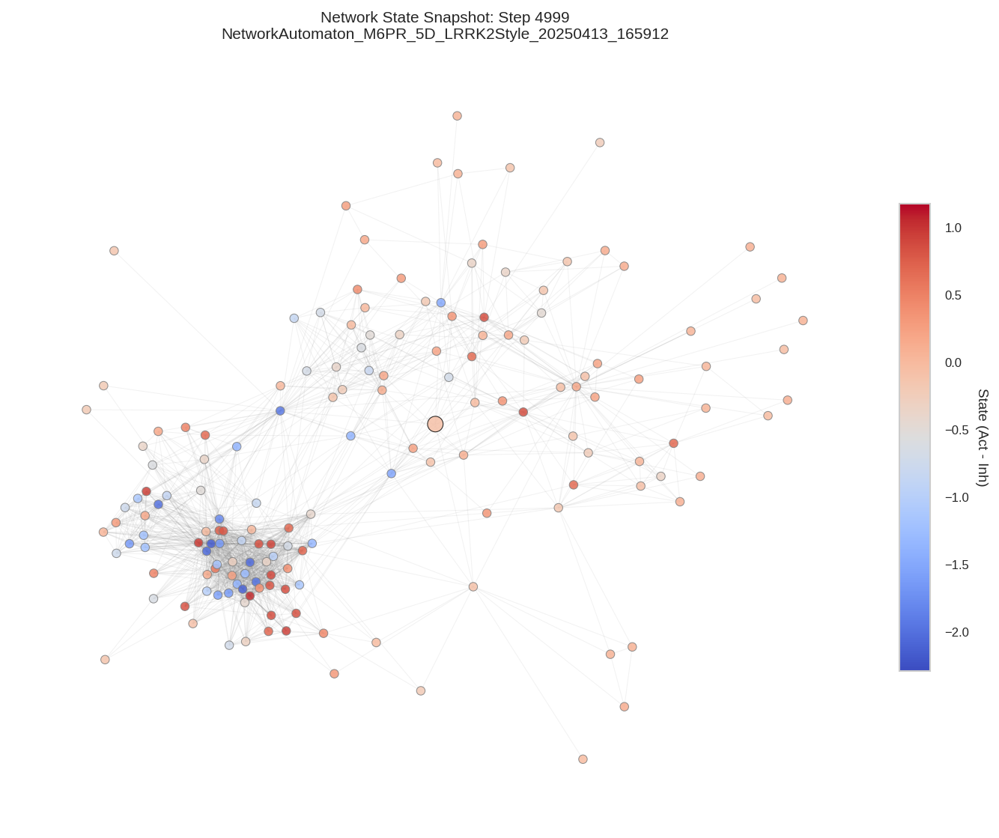


✅ Static Snapshot generation attempt complete.

Cell 10 execution complete.


In [18]:
# Cell 10: Static Snapshot Visualization
# Description: Generates static graph snapshots at specified steps using the visualize_snapshot_5d function defined in Cell 2.2.
# Shows final snapshot inline.

import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import os
import warnings
from tqdm.auto import tqdm
import traceback
from IPython.display import display, Image # Added for inline display

print("\n--- Cell 10: Static Snapshot Visualization ---")

# --- Prerequisites Check ---
snapshot_error = False
if 'global_state_history_list' not in globals() or not global_state_history_list: print("❌ Skip snapshots: History list missing (Run Cell 6 or 6.3)."); snapshot_error = True
if 'global_pos' not in globals() or not isinstance(global_pos, dict) or not global_pos: print("❌ Skip snapshots: Layout 'global_pos' missing or invalid (Run Cell 2)."); snapshot_error = True
if 'G' not in globals() or not isinstance(G, nx.Graph) or G.number_of_nodes() == 0: print("❌ Skip snapshots: Graph 'G' invalid (Run Cell 2)."); snapshot_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Skip snapshots: OUTPUT_DIR missing or invalid."); snapshot_error = True
if 'EXPERIMENT_NAME' not in globals(): print("❌ Skip snapshots: EXPERIMENT_NAME missing."); snapshot_error = True
if 'SNAPSHOT_STEPS' not in globals() or not isinstance(SNAPSHOT_STEPS, list): print("❌ Skip snapshots: SNAPSHOT_STEPS list missing or invalid (Run Cell 1)."); snapshot_error = True
# Check if the visualization function is defined
if 'visualize_snapshot_5d' not in globals() or not callable(visualize_snapshot_5d): print("❌ Skip snapshots: visualize_snapshot_5d function missing (Run Cell 2.2)."); snapshot_error = True


# --- Execute Snapshot Generation ---
if not snapshot_error:
    snapshot_dir = os.path.join(OUTPUT_DIR, "snapshots")
    os.makedirs(snapshot_dir, exist_ok=True)
    steps_run = -1
    if 'global_state_history_list' in globals() and global_state_history_list: steps_run = len(global_state_history_list) - 1

    # Ensure snapshot steps are valid for the current history length
    actual_snapshot_steps = sorted([s for s in SNAPSHOT_STEPS if isinstance(s, int) and 0 <= s <= steps_run])
    if not actual_snapshot_steps and SNAPSHOT_STEPS: # If original list had steps but none are valid now
         warnings.warn(f"⚠️ Configured snapshot steps {SNAPSHOT_STEPS} are outside the range of executed steps (0-{steps_run}). No snapshots generated.")
    elif not actual_snapshot_steps: # Original list was empty or history was empty
         print("   No valid snapshot steps defined or history is empty.")
    else:
        print(f"Generating snapshots for steps: {actual_snapshot_steps} (History length: {steps_run+1}) -> {snapshot_dir}")
        final_step_in_list = actual_snapshot_steps[-1]
        # Use tqdm for progress bar over snapshot steps
        snap_iterator = tqdm(actual_snapshot_steps, desc="Generating Static Snapshots", leave=False, unit="snapshot")
        displayed_final = False
        final_snapshot_path = None # Store path for final display

        for step_num in snap_iterator:
             # Initialize handles for this iteration
             fig_snap_init = None
             ax_snap = None
             snap_fig_result = None
             snap_fig = None # Handle for the successfully returned figure

             try:
                 # Create a new figure for each snapshot
                 fig_snap_init, ax_snap = plt.subplots(figsize=(12, 9))

                 # Call the visualization function (defined in Cell 2.2)
                 # Default verbose=True is fine for static snapshots
                 snap_fig_result = visualize_snapshot_5d( G, global_state_history_list[step_num], global_pos, step_num, EXPERIMENT_NAME, ax=ax_snap)

                 # Process result if visualization was successful
                 if snap_fig_result is not None and isinstance(snap_fig_result, plt.Figure):
                     snapshot_path = os.path.join(snapshot_dir, f"snapshot_step_{step_num:04d}.png")
                     snap_fig_result.savefig(snapshot_path, dpi=150, bbox_inches='tight')
                     snap_fig = snap_fig_result # Assign successful figure handle
                     if step_num == final_step_in_list: final_snapshot_path = snapshot_path # Store path of final snapshot
                 else:
                     print(f"   ⚠️ Visualization function failed for step {step_num}.")
                     # Figure will be closed in finally block

                 # Check if this is the final step (for potential inline display)
                 is_final_step = step_num == final_step_in_list
                 if is_final_step and snap_fig is not None:
                     # Don't use plt.show() here, display the saved file later
                     displayed_final = True
                 elif is_final_step: # Handle case where fig creation failed for final step
                     print(f"   (Cannot display final snapshot Step {step_num} - figure generation error)")

             except Exception as e:
                 print(f"   ❌ Failed snapshot step {step_num} with error: {e}");
                 traceback.print_exc(limit=1);
                 snap_fig = None # Ensure handle is None on error
             finally:
                 # Close the figure handle (snap_fig) if it was successfully created/returned AND still exists
                 if snap_fig is not None and plt.fignum_exists(snap_fig.number):
                     plt.close(snap_fig)
                 # If snap_fig is None (due to error or viz failure) AND fig_snap_init exists, close it
                 elif fig_snap_init is not None and plt.fignum_exists(fig_snap_init.number) and snap_fig is None:
                     plt.close(fig_snap_init)

        # --- Display Final Snapshot Inline ---
        if displayed_final and final_snapshot_path and os.path.exists(final_snapshot_path):
             print(f"\nDisplaying final snapshot (Step {final_step_in_list}): {final_snapshot_path}")
             display(Image(filename=final_snapshot_path))
        elif not actual_snapshot_steps: # If no steps were run
             pass # Message already printed
        else: # If final step wasn't displayed due to error or not being generated
             print("\n   (Final snapshot image not generated or display failed)")

        print(f"\n✅ Static Snapshot generation attempt complete.")
else: print("Static Snapshot generation skipped due to missing prerequisites.")

print("\nCell 10 execution complete.")


--- Cell 11: Identify 'Red Region' & Threshold Sensitivity ---

Identifying 'Red Region' nodes using threshold: max(|state|) > 0.5
Found 132 nodes in the Red Region (out of 163 total nodes) using threshold 0.5.
✅ Saved 132 Red Region STRING IDs to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_nodes_thresh0.50.txt

Analyzing sensitivity of Red Region size to threshold...
✅ Saved threshold sensitivity plot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_threshold_sensitivity.png

Displaying threshold sensitivity plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_threshold_sensitivity.png


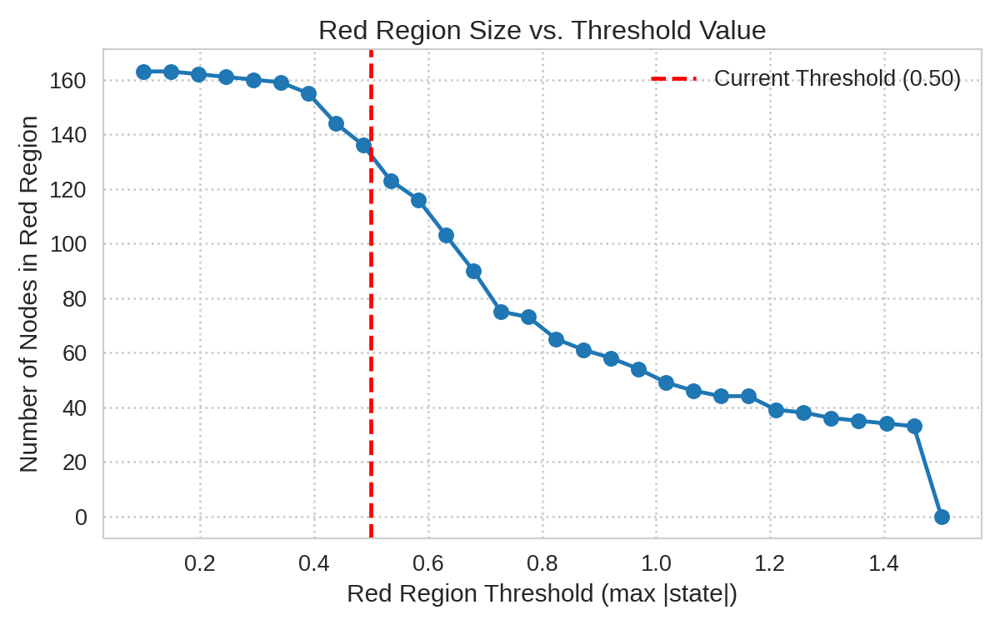


Cell 11 execution complete.


In [19]:
# Cell 11: Identify "Red Region" & Prepare for Enrichment (Network Automaton - M6PR)
# Description: Identifies nodes in the "Red Region" based on the final 5D state (from last run)
#              using max absolute value across dims > threshold. Saves STRING IDs to a file. Includes threshold sensitivity plot.

import numpy as np
import os
import warnings
import pandas as pd # Keep pandas import if used
import matplotlib.pyplot as plt # For threshold plot
import traceback # For error handling
from IPython.display import display, Image # For displaying plot

print("\n--- Cell 11: Identify 'Red Region' & Threshold Sensitivity ---")

# --- Prerequisites Check ---
red_region_error = False
if 'global_state_history_np' not in globals() or global_state_history_np is None: print("❌ Cannot identify Red Region: Numpy state history missing."); red_region_error = True
elif global_state_history_np.ndim != 3 or global_state_history_np.shape[0] < 1: print("❌ Cannot identify Red Region: Numpy state history invalid shape/empty."); red_region_error = True
if 'global_node_list' not in globals() or not global_node_list: print("❌ Cannot identify Red Region: Node list missing."); red_region_error = True
if 'RED_REGION_THRESHOLD' not in globals(): print("❌ Cannot identify Red Region: RED_REGION_THRESHOLD missing."); red_region_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Cannot save Red Region file: OUTPUT_DIR missing or invalid."); red_region_error = True

# Initialize global vars created here
global_red_region_nodes = []
global_red_region_filepath = None

if not red_region_error:
    print(f"\nIdentifying 'Red Region' nodes using threshold: max(|state|) > {RED_REGION_THRESHOLD}")
    try:
        # Get final state slice from numpy array
        final_states = global_state_history_np[-1, :, :] # Shape [N, D]

        # Calculate max absolute value across dimensions for each node
        max_abs_state_per_node = np.max(np.abs(final_states), axis=1) # Shape [N]

        # Find indices where max abs value exceeds the CURRENT threshold
        red_region_indices = np.where(max_abs_state_per_node > RED_REGION_THRESHOLD)[0]

        # Map indices back to node IDs
        valid_indices = [idx for idx in red_region_indices if 0 <= idx < len(global_node_list)]
        red_region_nodes_local = [global_node_list[i] for i in valid_indices]

        num_red_nodes = len(red_region_nodes_local)
        global_red_region_nodes = red_region_nodes_local # Store globally for this run
        total_nodes_in_graph = len(global_node_list)
        print(f"Found {num_red_nodes:,} nodes in the Red Region (out of {total_nodes_in_graph:,} total nodes) using threshold {RED_REGION_THRESHOLD}.")

        if num_red_nodes == 0:
            print("   ⚠️ No nodes met the Red Region threshold. Enrichment will be skipped.")
        elif num_red_nodes < 3:
            print(f"   ⚠️ Very few nodes ({num_red_nodes}) identified in Red Region. Enrichment may not be meaningful.")

        # Save STRING IDs to File for the current threshold
        if num_red_nodes > 0:
            # Include threshold in filename for clarity if running interactively
            red_region_filename = os.path.join(OUTPUT_DIR, f"red_region_nodes_thresh{RED_REGION_THRESHOLD:.2f}.txt")
            try:
                with open(red_region_filename, 'w') as f:
                    for node_id in global_red_region_nodes: f.write(f"{node_id}\n")
                print(f"✅ Saved {num_red_nodes} Red Region STRING IDs to: {red_region_filename}")
                global_red_region_filepath = red_region_filename # Store path globally
            except Exception as e: print(f"❌ Error saving Red Region IDs: {e}"); global_red_region_filepath = None
        else: global_red_region_filepath = None # Ensure path is None if no nodes

        # --- Threshold Sensitivity Analysis Plot (Task 2.6) ---
        print("\nAnalyzing sensitivity of Red Region size to threshold...")
        thresholds_to_test = np.linspace(0.1, 1.5, 30) # Test a range of thresholds
        region_sizes = []
        # Use the pre-calculated max_abs_state_per_node for efficiency
        for thresh in thresholds_to_test:
             size = np.sum(max_abs_state_per_node > thresh)
             region_sizes.append(size)

        fig_thresh, ax_thresh = plt.subplots(figsize=(8, 5))
        ax_thresh.plot(thresholds_to_test, region_sizes, marker='o', linestyle='-')
        ax_thresh.set_xlabel("Red Region Threshold (max |state|)")
        ax_thresh.set_ylabel("Number of Nodes in Red Region")
        ax_thresh.set_title("Red Region Size vs. Threshold Value")
        # Add a vertical line indicating the currently used threshold
        ax_thresh.axvline(RED_REGION_THRESHOLD, color='r', linestyle='--', label=f'Current Threshold ({RED_REGION_THRESHOLD:.2f})')
        ax_thresh.legend()
        ax_thresh.grid(True, linestyle=':')
        plt.tight_layout()

        thresh_plot_path = os.path.join(OUTPUT_DIR, "red_region_threshold_sensitivity.png")
        thresh_plot_success = False
        try:
             plt.savefig(thresh_plot_path, dpi=150)
             print(f"✅ Saved threshold sensitivity plot to: {thresh_plot_path}")
             thresh_plot_success = True
        except Exception as e_save: print(f"❌ Error saving threshold plot: {e_save}")
        finally: plt.close(fig_thresh) # Close the figure

        # Display saved plot
        if thresh_plot_success and os.path.exists(thresh_plot_path):
             print(f"\nDisplaying threshold sensitivity plot: {thresh_plot_path}")
             display(Image(filename=thresh_plot_path))

    except Exception as e:
         print(f"❌ Error during Red Region identification or sensitivity analysis: {e}")
         traceback.print_exc(limit=1)
         # Reset globals on error
         global_red_region_nodes = []
         global_red_region_filepath = None

else: # red_region_error was True
    print("Red Region identification skipped due to missing prerequisites.")

print("\nCell 11 execution complete.")

In [20]:
# Cell 11.1: Baseline Calculation & Red Region Comparison
# Description: Calculates RWR and Leiden baselines. Compares the Red Region (from Cell 11)
# against all calculated baselines (Degree from Cell 7, RWR, Leiden). Saves baseline lists.

import os
import numpy as np
import pandas as pd
import networkx as nx
import warnings
import pickle
import traceback

# Baseline method imports (Check HAS_LEIDEN defined in Cell 0)
if HAS_LEIDEN:
    try:
        import igraph as ig
        import leidenalg as la
    except ImportError:
         HAS_LEIDEN = False # Update if import fails here
         print("--- INFO: Leiden algorithm import failed in Cell 11.1. Community detection disabled. ---")

print("\n--- Cell 11.1: Baseline Calculation & Red Region Comparison ---")

# --- Prerequisites ---
baseline_error = False
if 'G' not in globals() or not isinstance(G, nx.Graph): print("❌ Baseline Error: Graph G missing."); baseline_error=True
if 'global_node_list' not in globals() or not global_node_list: print("❌ Baseline Error: Node list missing."); baseline_error=True
if 'TARGET_NODE_ID' not in globals(): print("❌ Baseline Error: TARGET_NODE_ID missing."); baseline_error=True
if 'node_to_int' not in globals(): print("❌ Baseline Error: node_to_int missing."); baseline_error=True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Baseline Error: OUTPUT_DIR missing or invalid."); baseline_error=True
# Need Red Region nodes from Cell 11
red_region_available_for_comparison = False # Flag
if 'global_red_region_nodes' in globals() and isinstance(global_red_region_nodes, list):
    if global_red_region_nodes: # Check if list is not empty
         red_region_available_for_comparison = True
    else:
         print("   (Info: Red Region node list is empty, comparison results will be zero).")
else:
     print("⚠️ Comparison Warning: Red region nodes not found globally (Run Cell 11). Comparison will be skipped.")
# Need Degree baseline nodes from Cell 7
if 'global_baseline_nodes_degree' not in globals() or not isinstance(global_baseline_nodes_degree, list):
     print("⚠️ Comparison Warning: Degree baseline node list missing or invalid (Run Cell 7). Comparison will be limited.")


# Initialize global vars for baseline lists calculated here
global_baseline_nodes_rwr = []
global_baseline_nodes_leiden = []
# Initialize comparison metrics dict (resetting it here is important if Cell 7 might have populated it)
global_red_region_comparison_metrics = {}

# --- Calculate RWR Baseline ---
if not baseline_error:
    print("\nCalculating RWR Baseline...")
    try:
        if TARGET_NODE_ID in node_to_int:
            personalization = {node_id: 0.0 for node_id in G.nodes()}
            personalization[TARGET_NODE_ID] = 1.0
            if G.number_of_edges() > 0:
                 rwr_scores = nx.pagerank(G, alpha=0.85, personalization=personalization, weight='weight', max_iter=1000, tol=1.0e-6)
                 rwr_scores_filtered = {node: score for node, score in rwr_scores.items() if node in global_node_list}
                 if rwr_scores_filtered:
                      n_baseline_rwr = len(global_red_region_nodes) if red_region_available_for_comparison else 50 # Match size or default
                      global_baseline_nodes_rwr = sorted(rwr_scores_filtered, key=rwr_scores_filtered.get, reverse=True)[:n_baseline_rwr]
                      print(f"  ✅ Baseline (RWR): Found top {len(global_baseline_nodes_rwr)} nodes.")
                 else: print("  ⚠️ Baseline (RWR): No scores obtained for nodes in simulation list.")
            else: print("  ⚠️ Baseline (RWR): Graph has no edges, skipping.")
        else: print("  ⚠️ Baseline (RWR): Target node not found in node_to_int mapping.")
    except Exception as e: print(f"  ❌ Error calculating RWR baseline: {e}"); traceback.print_exc(limit=1)

# --- Calculate Leiden Community Baseline ---
if not baseline_error and HAS_LEIDEN:
    print("\nCalculating Leiden Community Baseline...")
    try:
        if G.number_of_edges() > 0:
             # Convert NetworkX graph to igraph, preserving node names
             node_name_map_ig = {name: i for i, name in enumerate(G.nodes())}
             edges_ig = [(node_name_map_ig[u], node_name_map_ig[v]) for u, v in G.edges()]
             g_ig = ig.Graph(edges_ig, n=G.number_of_nodes(), directed=False) # Specify node count
             g_ig.vs['name'] = list(G.nodes()) # Store original names

             # Get edge weights correctly mapped to igraph edge sequence
             weights_ig = None
             edge_attributes = nx.get_edge_attributes(G, 'weight')
             if edge_attributes:
                 try:
                     # Map weights based on igraph edge tuple order
                     weights_ig = [edge_attributes.get(g_ig.es[i].tuple, edge_attributes.get(g_ig.es[i].tuple[::-1], 1.0)) for i in range(g_ig.ecount())]
                 except Exception as e_w:
                     print(f"   (Warning: Error mapping weights for Leiden: {e_w}. Running unweighted.)")
                     weights_ig = None

             partition = la.find_partition(g_ig, la.ModularityVertexPartition, weights=weights_ig, seed=42)
             print(f"  ✅ Baseline (Leiden): Found {len(partition)} communities (Modularity: {partition.modularity:.4f}).")

             if TARGET_NODE_ID in G.nodes():
                 try:
                     target_node_index_ig = g_ig.vs.find(name=TARGET_NODE_ID).index
                     target_community_idx = partition.membership[target_node_index_ig]
                     target_community_indices_ig = [i for i, membership in enumerate(partition.membership) if membership == target_community_idx]
                     target_community_nodes = [g_ig.vs[i]['name'] for i in target_community_indices_ig]
                     global_baseline_nodes_leiden = [node for node in target_community_nodes if node in global_node_list] # Filter for sim nodes
                     print(f"     Target node community ({target_community_idx}) has {len(global_baseline_nodes_leiden)} nodes (in sim).")
                 except ValueError: print("     Target node name could not be found in igraph object.")
             else: print("     Target node not found in original graph G.")
        else: print("  ⚠️ Baseline (Leiden): Graph has no edges, skipping.")
    except Exception as e: print(f"  ❌ Error calculating Leiden baseline: {e}"); traceback.print_exc(limit=1)
elif not baseline_error: print("\nLeiden Community Baseline: Skipped (library not found).")


# --- Compare Red Region to All Baselines ---
if not baseline_error and red_region_available_for_comparison:
    print("\n--- Comparing Red Region (Last Run) to Baselines ---")
    set_red_region = set(global_red_region_nodes)
    print(f"Red Region size (Last Run): {len(set_red_region)}")

    # Compile all available baseline sets calculated here or in Cell 7
    available_baselines = {}
    if 'global_baseline_nodes_degree' in globals() and global_baseline_nodes_degree: available_baselines['Degree'] = set(global_baseline_nodes_degree)
    if global_baseline_nodes_rwr: available_baselines['RWR'] = set(global_baseline_nodes_rwr)
    if global_baseline_nodes_leiden: available_baselines['Leiden_Community'] = set(global_baseline_nodes_leiden)

    if not available_baselines:
         print("  No baseline sets available for comparison.")
    else:
        global_red_region_comparison_metrics = {} # Clear/re-initialize for this run
        for name, baseline_set in available_baselines.items():
            intersection = len(set_red_region.intersection(baseline_set))
            union = len(set_red_region.union(baseline_set))
            jaccard = intersection / union if union > 0 else 0.0
            print(f"  Overlap with {name} (Size {len(baseline_set)}): Intersection={intersection}, Jaccard={jaccard:.4f}")
            global_red_region_comparison_metrics[name] = jaccard # Store metric

    # --- Save Updated Baseline Node Lists (includes RWR/Leiden if calculated) ---
    try:
        print("\n--- Saving Baseline Node Lists ---")
        baseline_nodes_path = os.path.join(OUTPUT_DIR, "baseline_nodes.txt")
        with open(baseline_nodes_path, 'w') as f:
            f.write("--- Baseline: Top Nodes by Degree ---\n")
            f.write('\n'.join(global_baseline_nodes_degree if global_baseline_nodes_degree else ["N/A"])) # Handle empty list
            f.write("\n--- Baseline: Top Nodes by RWR from Target ---\n")
            f.write('\n'.join(global_baseline_nodes_rwr if global_baseline_nodes_rwr else ["N/A"]))
            f.write("\n--- Baseline: Target Node Community (Leiden) ---\n")
            f.write('\n'.join(global_baseline_nodes_leiden if global_baseline_nodes_leiden else ["N/A"]))
        print(f"✅ Saved baseline node lists to: {baseline_nodes_path}")
    except Exception as e: print(f"❌ Error saving baseline node lists: {e}")

elif not baseline_error:
     print("\nRed Region Comparison skipped: Red Region nodes list not available or empty.")

print("\nCell 11.1 execution complete.")


--- Cell 11.1: Baseline Calculation & Red Region Comparison ---

Calculating RWR Baseline...
  ✅ Baseline (RWR): Found top 132 nodes.

Leiden Community Baseline: Skipped (library not found).

--- Comparing Red Region (Last Run) to Baselines ---
Red Region size (Last Run): 132
  Overlap with Degree (Size 10): Intersection=9, Jaccard=0.0677
  Overlap with RWR (Size 132): Intersection=116, Jaccard=0.7838

--- Saving Baseline Node Lists ---
✅ Saved baseline node lists to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/baseline_nodes.txt

Cell 11.1 execution complete.


In [21]:
# Cell 12: Functional Enrichment Analysis (Network Automaton - M6PR)
# Description: Loads Red Region IDs (Cell 11), maps to Gene Symbols (API/Cache), runs GO Enrichment for Red Region.
# Saves results and top terms summary.

import os
import warnings
import traceback
import requests
import json
import pandas as pd
import time
from tqdm.auto import tqdm
import pickle
import io

# Ensure gseapy is available (checked in Cell 0)
if 'gp' not in globals(): gp = None

print("\n--- Cell 12: Functional Enrichment Analysis (Red Region) ---")

# --- Prerequisites Check ---
enrichment_error = False
# Check for red region file path *and* existence
if 'global_red_region_filepath' not in globals() or not global_red_region_filepath: print("❌ Skip Enrichment: Red Region file path missing (Run Cell 11)."); enrichment_error = True
elif not os.path.exists(global_red_region_filepath): print(f"❌ Skip Enrichment: File not found '{global_red_region_filepath}' (Run Cell 11)."); enrichment_error = True
# Check gseapy
if gp is None: print("❌ Skip Enrichment: gseapy library not installed."); enrichment_error = True
# Check other needed globals
if 'SPECIES_ID' not in globals(): print("❌ Prereq SPECIES_ID missing."); enrichment_error = True
if 'STRING_API_BATCH_SIZE' not in globals(): print("❌ Prereq STRING_API_BATCH_SIZE missing."); enrichment_error = True
if 'STRING_API_MAX_RETRIES' not in globals(): print("❌ Prereq STRING_API_MAX_RETRIES missing."); enrichment_error = True
if 'STRING_API_RETRY_DELAY' not in globals(): print("❌ Prereq STRING_API_RETRY_DELAY missing."); enrichment_error = True
if 'GO_ENRICHMENT_LIBRARY' not in globals(): print("❌ Prereq GO_ENRICHMENT_LIBRARY missing."); enrichment_error = True
if 'TOP_N_ENRICHMENT_TERMS' not in globals(): print("❌ Prereq TOP_N_ENRICHMENT_TERMS missing."); enrichment_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Prereq OUTPUT_DIR missing or invalid."); enrichment_error = True
if 'TARGET_NODE_NAME' not in globals(): print("❌ Prereq TARGET_NODE_NAME missing."); enrichment_error = True # For description


# --- Helper Functions ---
def load_string_ids_from_txt_v12(filename):
    ids = []
    try:
        with open(filename, 'r') as f: ids = [line.strip() for line in f if line.strip()]
        print(f"   Loaded {len(ids)} IDs from {os.path.basename(filename)}."); return ids
    except FileNotFoundError: print(f"   ❌ Error: File not found at {filename}"); return []
    except Exception as e: print(f"   ❌ Error loading IDs from {filename}: {e}"); return []

def map_string_ids_to_gene_symbols_api_simple(string_ids, species=SPECIES_ID, batch_size=STRING_API_BATCH_SIZE):
     """Maps STRING IDs to gene symbols using STRING API with retries and batching."""
     if not string_ids: return {}
     api_map_dict = {sid: sid for sid in string_ids}; # Initialize with original IDs as fallbacks
     identifiers_to_map = [sid for sid in string_ids if isinstance(sid, str) and sid.startswith(str(species) + '.')]
     if not identifiers_to_map: print("   No valid STRING IDs found for mapping via API."); return api_map_dict
     url = "https://string-db.org/api/tsv/get_string_ids"; num_batches = (len(identifiers_to_map) + batch_size - 1)//batch_size;
     use_tqdm = num_batches > 1; batch_iterator = tqdm(range(num_batches), desc=f"Mapping {len(identifiers_to_map)} IDs", leave=False) if use_tqdm else range(num_batches);
     api_errors = 0
     for i in batch_iterator:
          batch = identifiers_to_map[i*batch_size:(i+1)*batch_size]; payload = {'identifiers': "\r".join(batch), 'species': species, 'limit': 1, 'echo_query': 1, 'caller_identity': 'NetworkAutomatonSim/1.0'};
          retries = 0; success = False; response = None
          while retries < STRING_API_MAX_RETRIES and not success:
               try:
                    response = requests.post(url, data=payload, timeout=60); response.raise_for_status(); content_type_header = response.headers.get('Content-Type','');
                    if 'text/tab-separated-values' in content_type_header:
                         response_text = response.text
                         if response_text and response_text.strip():
                              mapping_df = pd.read_csv(io.StringIO(response_text), sep='\t')
                              if 'preferredName' in mapping_df.columns and 'queryItem' in mapping_df.columns:
                                   for qid, name in zip(mapping_df['queryItem'], mapping_df['preferredName']):
                                        if pd.notna(name) and name: api_map_dict[qid] = str(name)
                              else: warnings.warn(f"API response missing expected columns ('preferredName', 'queryItem') in batch {i+1}.")
                         success = True # Mark as success even if empty or no mappings
                    else: warnings.warn(f"Unexpected API response format (Batch {i+1}): {content_type_header}. Content: {response.text[:100]}"); retries += 1; time.sleep(STRING_API_RETRY_DELAY * (1 + retries));
               except requests.exceptions.Timeout: retries += 1; print(f"   Timeout (Retry {retries}/{STRING_API_MAX_RETRIES})"); time.sleep(STRING_API_RETRY_DELAY * (1 + retries));
               except requests.exceptions.RequestException as e: retries += 1; print(f"   API Request Error (Retry {retries}/{STRING_API_MAX_RETRIES}): {e}"); time.sleep(STRING_API_RETRY_DELAY * (1 + retries));
               except pd.errors.EmptyDataError: success = True # Empty response is okay
               except Exception as e: retries += 1; print(f"   Unexpected Error Processing Response (Retry {retries}/{STRING_API_MAX_RETRIES}): {e}"); traceback.print_exc(limit=1); time.sleep(STRING_API_RETRY_DELAY * (1 + retries));
               if retries >= STRING_API_MAX_RETRIES and not success: print(f"   ❌ API call failed for Batch {i+1} after {retries} retries."); api_errors += 1
          if use_tqdm: batch_iterator.update(1)
     if use_tqdm: batch_iterator.close()
     if api_errors > 0: warnings.warn(f"🚨 API mapping failed for {api_errors}/{num_batches} batches after retries.")
     return api_map_dict

def run_enrichment_simple(gene_list, description, gene_sets=GO_ENRICHMENT_LIBRARY, top_n=TOP_N_ENRICHMENT_TERMS):
     """Runs gseapy enrichment analysis."""
     if gp is None: print("❌ Cannot run enrichment: gseapy not available."); return None
     if not isinstance(gene_list, list) or not all(isinstance(g, str) for g in gene_list): print(f"⚠️ Skip enrichment: Input gene_list is not a list of strings."); return None
     cleaned_gene_list = [g for g in gene_list if g]; # Filter empty strings
     if not cleaned_gene_list or len(cleaned_gene_list) < 3: print(f"⚠️ Skip enrichment '{description}': Needs >= 3 non-empty genes (found {len(cleaned_gene_list)})."); return pd.DataFrame() # Return empty DF
     print(f"--- 📊 Performing Enrichment: {description} ({len(cleaned_gene_list)} genes) ---")
     try:
          libs = gp.get_library_name(organism='Human')
          if not isinstance(gene_sets, list): gene_sets_list = [gene_sets]
          else: gene_sets_list = gene_sets
          valid_libs = [lib for lib in gene_sets_list if lib in libs]
          if not valid_libs: print(f"❌ Invalid/unavailable gene_set(s): {gene_sets_list}. Available examples: {libs[:5]}"); return None
          if len(valid_libs) < len(gene_sets_list): warnings.warn(f"Using only valid libraries: {valid_libs}")
          enr = gp.enrichr(gene_list=cleaned_gene_list, gene_sets=valid_libs, organism='Human', outdir=None, cutoff=0.05)
          if enr is None or not hasattr(enr, 'results') or enr.results.empty: print(f"ℹ️ No significant terms found for '{description}' using libraries: {valid_libs}."); return pd.DataFrame()
          results_df = enr.results.sort_values('Adjusted P-value').reset_index(drop=True)
          print(f"🧬 Top {min(top_n, len(results_df))} Enriched Terms ({', '.join(valid_libs)}):")
          display_df=results_df[['Term', 'Adjusted P-value', 'Overlap', 'Genes']].head(top_n).copy()
          display_df['Adjusted P-value'] = display_df['Adjusted P-value'].map('{:.2e}'.format)
          display_df['Genes'] = display_df['Genes'].fillna('').astype(str).str.split(';').str[:5].apply(lambda x: ';'.join(x)+('...' if len(x)==5 else ''))
          print(display_df.to_string(index=False)); print("-" * 70);
          return results_df
     except requests.exceptions.RequestException as e: print(f"❌ GSEAPY Enrichr Connection Error for '{description}': {e}"); return None
     except Exception as e: print(f"❌ Unexpected enrichment error for '{description}': {e}"); traceback.print_exc(limit=2); return None


# --- Execute Enrichment Pipeline ---
enrichment_results_df = pd.DataFrame() # Initialize empty DF
gene_symbols_mapped = []
top_terms_output_string = "Enrichment not run or prerequisite failed." # Default message

if not enrichment_error:
    red_region_string_ids = load_string_ids_from_txt_v12(global_red_region_filepath)
    if not red_region_string_ids: print("⚠️ Skipping Enrichment: Red Region ID list empty or failed to load."); enrichment_error = True

if not enrichment_error:
    # --- Check cache or run API mapping ---
    mapping_cache_file = os.path.join(OUTPUT_DIR, 'string_id_to_gene_symbol_map.pkl')
    api_map_dict = None # Initialize
    if os.path.exists(mapping_cache_file):
        try:
             print(f"Attempting load from mapping cache: {mapping_cache_file}")
             with open(mapping_cache_file, 'rb') as f: api_map_dict = pickle.load(f)
             if not isinstance(api_map_dict, dict): api_map_dict = None
             else: print(f"✅ Loaded map for {len(api_map_dict)} IDs from cache.")
        except Exception as e: print(f"   ⚠️ Warning: Could not load mapping cache: {e}.")
    if api_map_dict is None: api_map_dict = {} # Initialize empty if load failed/missing

    # --- Determine IDs needing mapping ---
    ids_to_map_api = list(set(red_region_string_ids) - set(api_map_dict.keys()))
    if ids_to_map_api:
         print(f"Mapping {len(ids_to_map_api)} new IDs via API...")
         api_results = map_string_ids_to_gene_symbols_api_simple(ids_to_map_api)
         api_map_dict.update(api_results) # Update the main map
         # Save updated map back to cache
         try:
             with open(mapping_cache_file, 'wb') as f: pickle.dump(api_map_dict, f)
             print(f"✅ Saved updated map ({len(api_map_dict)} total) to cache.")
         except Exception as e: print(f"   ⚠️ Warning: Error saving map cache: {e}")
    elif api_map_dict: print("All needed IDs found in cache.")
    else: print("No IDs to map and cache empty."); enrichment_error=True # Cannot proceed if no map & no IDs

    # --- Extract gene symbols for enrichment ---
    if api_map_dict:
         mapped_genes_fallback = [api_map_dict.get(rid, rid) for rid in red_region_string_ids]
         gene_symbols_mapped = [gene for gene in mapped_genes_fallback if isinstance(gene, str) and not gene.startswith(str(SPECIES_ID) + '.')]
         unmapped_count = len(red_region_string_ids) - len(gene_symbols_mapped)
         print(f"\nMapping complete. Extracted {len(gene_symbols_mapped)} gene symbols.")
         if unmapped_count > 0: print(f"   ({unmapped_count} IDs could not be mapped or were not valid STRING IDs).")
         if len(gene_symbols_mapped) < 3: print(f"⚠️ Skipping Enrichment: Fewer than 3 gene symbols ({len(gene_symbols_mapped)}) were successfully mapped."); enrichment_error = True
    else: enrichment_error = True # Failed mapping earlier

if not enrichment_error:
    # --- Run Enrichment for Red Region ---
    go_lib = GO_ENRICHMENT_LIBRARY if 'GO_ENRICHMENT_LIBRARY' in globals() else 'GO_Biological_Process_2023'
    top_n_val = TOP_N_ENRICHMENT_TERMS if 'TOP_N_ENRICHMENT_TERMS' in globals() else 15
    enrichment_results_df = run_enrichment_simple(
        gene_list=gene_symbols_mapped,
        description=f"{TARGET_NODE_NAME} Red Region Genes",
        gene_sets=go_lib,
        top_n=top_n_val
    )
    # --- Process results ---
    if isinstance(enrichment_results_df, pd.DataFrame):
        if not enrichment_results_df.empty:
            print("✅ Enrichment analysis completed successfully.")
            try:
                enr_filename = os.path.join(OUTPUT_DIR, "red_region_go_enrichment_results.csv")
                enrichment_results_df.to_csv(enr_filename, index=False)
                print(f"✅ Saved full enrichment results to: {enr_filename}")
                # Format top terms for text file
                top_n_save = min(top_n_val, len(enrichment_results_df))
                display_df = enrichment_results_df[['Term', 'Adjusted P-value', 'Overlap', 'Genes']].head(top_n_save).copy()
                display_df['Adjusted P-value'] = display_df['Adjusted P-value'].map('{:.2e}'.format)
                display_df['Genes'] = display_df['Genes'].fillna('').astype(str).str.split(';').str[:5].apply(lambda x: ';'.join(x)+('...' if len(x)==5 else ''))
                top_terms_output_string = f"--- Top {top_n_save} Enriched GO BP Terms ({TARGET_NODE_NAME} Red Region, Lib: {go_lib}) ---\n"
                top_terms_output_string += display_df.to_string(index=False)
                top_terms_path = os.path.join(OUTPUT_DIR, "red_region_top_enriched_terms.txt")
                with open(top_terms_path, 'w') as f_txt: f_txt.write(top_terms_output_string)
                print(f"✅ Saved formatted top terms to: {top_terms_path}")
            except Exception as save_e: print(f"❌ Error saving enrichment results/text: {save_e}"); top_terms_output_string = "Error saving enrichment results."
        else: print("ℹ️ Enrichment analysis ran, but no significant terms were found."); top_terms_output_string = "No significant enrichment terms found."
    else: print("❌ Enrichment analysis failed to run."); top_terms_output_string = "Enrichment analysis failed."; enrichment_results_df = pd.DataFrame()

else: # enrichment_error was True from the start or set during checks
    print("\nEnrichment analysis was skipped due to missing prerequisites or failed mapping."); top_terms_output_string = "Enrichment skipped or prerequisite failed."; enrichment_results_df = pd.DataFrame()

# Store globally
global_enrichment_results = enrichment_results_df # Store the final DataFrame (could be empty)
global_gene_symbols_mapped = gene_symbols_mapped
global_top_terms_text = top_terms_output_string

print("\nCell 12 execution complete.")


--- Cell 12: Functional Enrichment Analysis (Red Region) ---
   Loaded 132 IDs from red_region_nodes_thresh0.50.txt.
Mapping 132 new IDs via API...


Mapping 132 IDs:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved updated map (132 total) to cache.

Mapping complete. Extracted 132 gene symbols.
--- 📊 Performing Enrichment: M6PR Red Region Genes (132 genes) ---
🧬 Top 15 Enriched Terms (GO_Biological_Process_2023):
                                                Term Adjusted P-value Overlap                               Genes
             Vesicle-Mediated Transport (GO:0016192)         4.03e-47  50/411    APP;ARF1;SNAP23;AP4E1;WASHC2C...
                         Vesicle Fusion (GO:0006906)         3.30e-39   28/79    STX12;STX17;STX16;GOSR2;STX10...
                Golgi Vesicle Transport (GO:0048193)         3.56e-38  35/197     NAPA;STX17;COPB1;GOSR2;STX18...
                    Cytosolic Transport (GO:0016482)         3.56e-38  31/127    VPS29;STX16;CLTC;WASHC2C;GCC2...
                      Protein Transport (GO:0015031)         8.42e-34  37/313      NAPA;VPS29;STX12;ARF1;STX17...
Retrograde Transport, Endosome To Golgi (GO:0042147)         2.07e-33   26/94    VPS29;STX16;CLTC;WASHC2C;

### Cell 12.1: Baseline Enrichment Analysis (Task 1.5, M5)

**Rationale:** To understand the unique contribution of the Network Automaton's "Red Region", we need to compare its functional enrichment profile not only against the background but also against node sets identified by simpler, standard graph analysis methods.

**Demonstration:** We will perform GO enrichment analysis (using the same `gseapy` function and library as for the Red Region) on the baseline node sets calculated in Cell 11.1:
1.  Top N nodes by Degree (list from Cell 7, set size used in Cell 11.1).
2.  Top N nodes by Random Walk with Restart (RWR) score from the target node.
3.  Nodes belonging to the same community as the target node (identified by Leiden).

The results will be saved and compared qualitatively to the Red Region enrichment in the final summary. *This cell assumes the baseline node lists (`global_baseline_nodes_*`) were successfully populated in Cell 11.1.*

In [22]:
# Cell 12.2: Code - Baseline Enrichment Analysis

import os
import pandas as pd
import warnings
import traceback
import pickle # Needed for loading map cache

# Ensure gseapy and helper functions are available (defined in Cell 12)
baseline_enrich_error = False
if 'gp' not in globals() or gp is None: print("❌ Prereq 'gp' (gseapy) missing."); baseline_enrich_error = True
if 'map_string_ids_to_gene_symbols_api_simple' not in globals(): print("❌ Prereq mapping function missing."); baseline_enrich_error = True
if 'run_enrichment_simple' not in globals(): print("❌ Prereq enrichment function missing."); baseline_enrich_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Prereq OUTPUT_DIR missing or invalid."); baseline_enrich_error = True
if 'SPECIES_ID' not in globals(): print("❌ Prereq SPECIES_ID missing."); baseline_enrich_error = True
if 'GO_ENRICHMENT_LIBRARY' not in globals(): print("❌ Prereq GO_ENRICHMENT_LIBRARY missing."); baseline_enrich_error = True
if 'TOP_N_ENRICHMENT_TERMS' not in globals(): print("❌ Prereq TOP_N_ENRICHMENT_TERMS missing."); baseline_enrich_error = True
if 'TARGET_NODE_NAME' not in globals(): print("❌ Prereq TARGET_NODE_NAME missing."); baseline_enrich_error = True


print("\n--- Cell 12.2: Baseline Enrichment Analysis ---")

# --- Define Baseline Node Lists to Analyze (from Cell 7 & 11.1) ---
baseline_lists_to_analyze = {
    "Degree": global_baseline_nodes_degree if 'global_baseline_nodes_degree' in globals() else [],
    "RWR": global_baseline_nodes_rwr if 'global_baseline_nodes_rwr' in globals() else [],
    "Leiden_Community": global_baseline_nodes_leiden if 'global_baseline_nodes_leiden' in globals() else [],
}

# --- Run Enrichment for Each Baseline ---
global_baseline_enrichment_results = {} # Store results keyed by baseline name

if baseline_enrich_error:
    print("Skipping baseline enrichment due to missing prerequisites.")
else:
    # Load or use existing ID->Symbol mapping
    mapping_cache_file = os.path.join(OUTPUT_DIR, 'string_id_to_gene_symbol_map.pkl')
    api_map_dict = None
    if os.path.exists(mapping_cache_file):
        try:
            print(f"Attempting load from mapping cache: {mapping_cache_file}")
            with open(mapping_cache_file, 'rb') as f: api_map_dict = pickle.load(f)
            if not isinstance(api_map_dict, dict): api_map_dict = None
            else: print(f"✅ Loaded map for {len(api_map_dict)} IDs from cache.")
        except Exception as e: print(f"   ⚠️ Warning: Could not load mapping cache: {e}.")
    if api_map_dict is None:
        print("⚠️ Warning: ID->Symbol map cache not found. Baseline enrichment might use STRING IDs if API mapping wasn't run/cached in Cell 12.")
        api_map_dict = {} # Use empty map, fallback to original IDs

    for name, node_list_baseline in baseline_lists_to_analyze.items():
        print(f"\n--- Analyzing Baseline: {name} ({len(node_list_baseline)} nodes) ---")
        if not node_list_baseline:
            print("  Node list is empty. Skipping enrichment.")
            global_baseline_enrichment_results[name] = pd.DataFrame() # Store empty DF
            continue

        # Map IDs to Gene Symbols (best effort using cached/available map)
        mapped_genes_fallback = [api_map_dict.get(nid, nid) for nid in node_list_baseline]
        gene_symbols_baseline = [g for g in mapped_genes_fallback if isinstance(g, str) and not g.startswith(str(SPECIES_ID) + '.')]
        unmapped_count = len(node_list_baseline) - len(gene_symbols_baseline)
        print(f"  Mapped to {len(gene_symbols_baseline)} gene symbols ({unmapped_count} unmapped/fallback).")

        if len(gene_symbols_baseline) < 3:
            print(f"  Fewer than 3 gene symbols ({len(gene_symbols_baseline)}). Skipping enrichment.")
            global_baseline_enrichment_results[name] = pd.DataFrame() # Store empty DF
            continue

        # Run Enrichment using the function from Cell 12
        go_lib = GO_ENRICHMENT_LIBRARY # Use global var
        top_n = TOP_N_ENRICHMENT_TERMS # Use global var
        try:
            # Call the enrichment helper function
            results_df = run_enrichment_simple(
                gene_list=gene_symbols_baseline,
                description=f"Baseline {name}",
                gene_sets=go_lib,
                top_n=top_n
            )

            # Store results (even if empty)
            if isinstance(results_df, pd.DataFrame):
                global_baseline_enrichment_results[name] = results_df
                if not results_df.empty:
                    # Save non-empty results
                    enr_filename = os.path.join(OUTPUT_DIR, f"baseline_{name}_go_enrichment_results.csv")
                    results_df.to_csv(enr_filename, index=False)
                    print(f"  ✅ Saved baseline enrichment results to: {enr_filename}")
                # else: Message about no significant terms printed inside run_enrichment_simple
            else: # Enrichment function returned None (error)
                print("  ❌ Enrichment function failed for this baseline.")
                global_baseline_enrichment_results[name] = pd.DataFrame() # Store empty DF on failure

        except Exception as e:
            print(f"  ❌ Unexpected error during baseline enrichment for {name}: {e}")
            traceback.print_exc(limit=2)
            global_baseline_enrichment_results[name] = pd.DataFrame() # Store empty DF on error

print("\n--- Cell 12.2: Baseline Enrichment Analysis Complete ---")


--- Cell 12.2: Baseline Enrichment Analysis ---
Attempting load from mapping cache: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/string_id_to_gene_symbol_map.pkl
✅ Loaded map for 132 IDs from cache.

--- Analyzing Baseline: Degree (10 nodes) ---
  Mapped to 9 gene symbols (1 unmapped/fallback).
--- 📊 Performing Enrichment: Baseline Degree (9 genes) ---
🧬 Top 15 Enriched Terms (GO_Biological_Process_2023):
                                                                  Term Adjusted P-value Overlap                          Genes
                                           Vesicle Fusion (GO:0006906)         1.76e-14    7/79 STX16;VTI1A;STX6;STX5;VAMP4...
                                      Endosomal Transport (GO:0016197)         3.24e-12   7/180 STX16;VTI1A;STX6;STX5;VAMP4...
                  Retrograde Transport, Endosome To Golgi (GO:0042147)         1.09e-11    6/94  STX16;VTI1A;STX6;STX5;YKT6...
                                      Cytosolic T


--- Cell 13: Enrichment Plotting (Red Region - Current Run) ---
--- Generating Enrichment Plot: Top Enriched GO BP Terms (15 requested)
M6PR Red Region (max|state| > 0.5) ---
✅ Plot saved successfully to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_enrichment_plot.png

Displaying generated enrichment plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_enrichment_plot.png


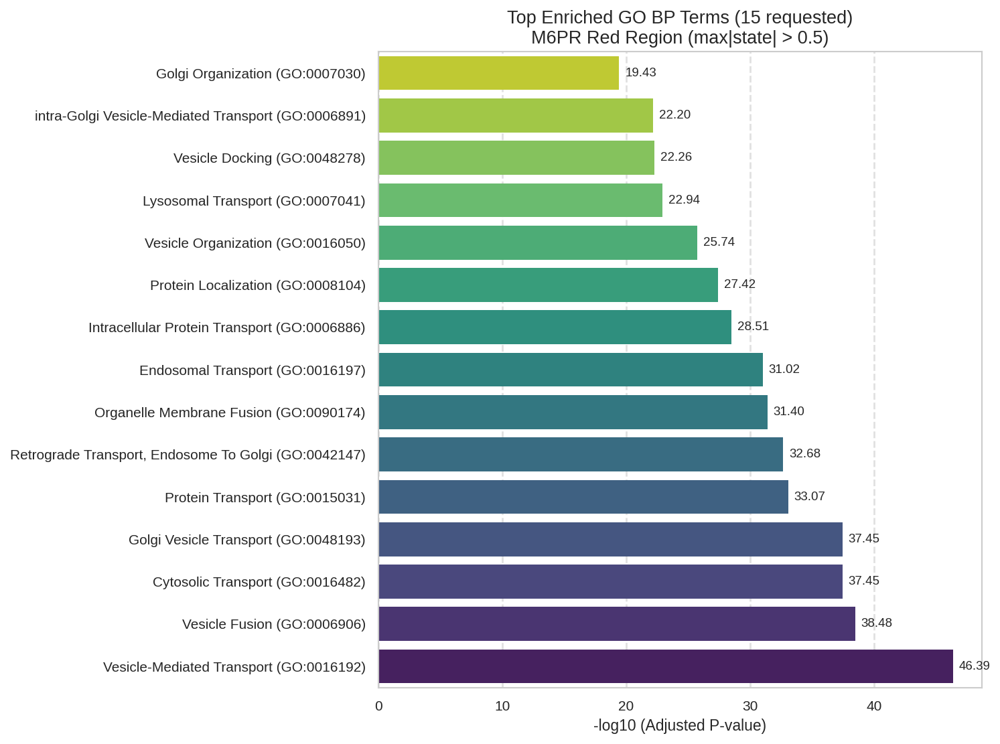


Cell 13 execution complete.


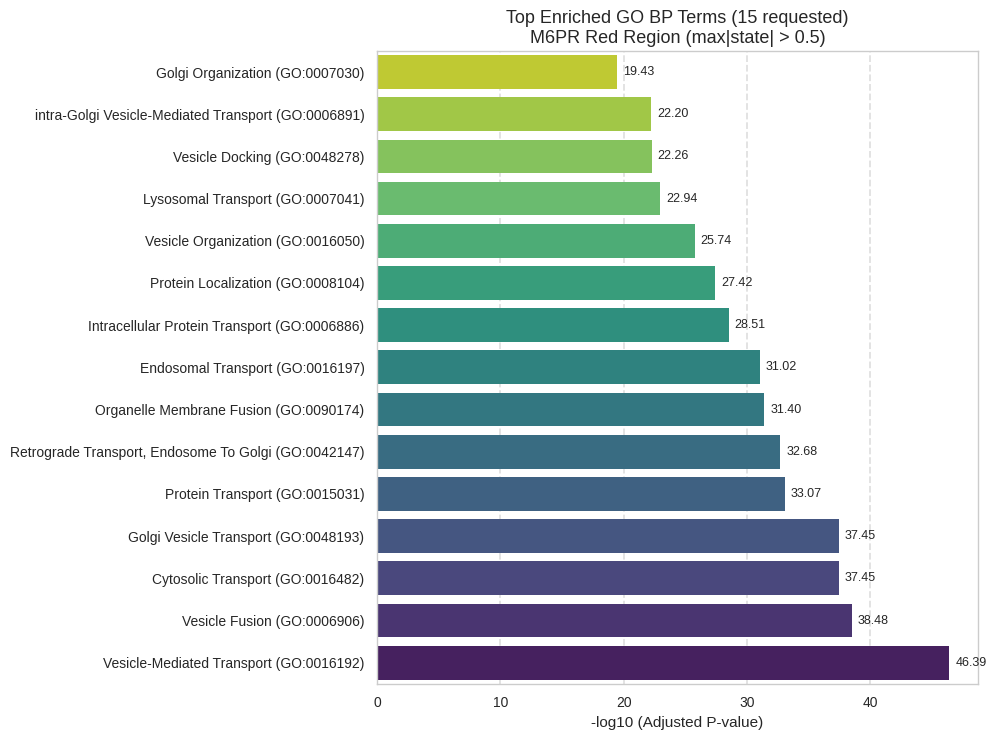

In [23]:
# Cell 13: Enrichment Plotting (Network Automaton - M6PR)
# Description: Generates a bar plot visualizing the top enriched GO terms for the M6PR Red Region (from last run). Displays inline.

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import warnings
import traceback
from IPython.display import display, Image # Added import

print("\n--- Cell 13: Enrichment Plotting (Red Region - Current Run) ---")

# --- Prerequisites Check ---
enrichment_plot_error = False
# Use the global variable from Cell 12
if 'global_enrichment_results' not in globals() or not isinstance(global_enrichment_results, pd.DataFrame):
    print("⚠️ Skipping Plot: Enrichment results ('global_enrichment_results') missing or not a DataFrame (Run Cell 12)."); enrichment_plot_error = True
elif global_enrichment_results.empty:
    print("ℹ️ Skipping Plot: Enrichment results DataFrame is empty (No significant terms found in Cell 12).")
    enrichment_plot_error = True # Treat empty results as a reason to skip plot
# Check other globals needed
if not enrichment_plot_error: # Only check these if results exist
    if 'TOP_N_ENRICHMENT_TERMS' not in globals(): print("⚠️ TOP_N_ENRICHMENT_TERMS missing."); enrichment_plot_error = True
    if 'TARGET_NODE_NAME' not in globals(): print("⚠️ TARGET_NODE_NAME missing."); enrichment_plot_error = True
    if 'RED_REGION_THRESHOLD' not in globals(): print("⚠️ RED_REGION_THRESHOLD missing."); enrichment_plot_error = True
    if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("⚠️ OUTPUT_DIR missing or invalid."); enrichment_plot_error = True

# --- Define Plotting Function ---
def create_enrichment_plot(results_df, title, output_filename, top_n=15):
    """Generates and saves a horizontal bar plot for enrichment results."""
    print(f"--- Generating Enrichment Plot: {title} ---")
    pval_col = 'Adjusted P-value'; term_col = 'Term'
    if not isinstance(results_df, pd.DataFrame): print(f"❌ Plot Error: Input 'results_df' not a DataFrame."); return False, None
    if pval_col not in results_df.columns or term_col not in results_df.columns: print(f"❌ Plot Error: Missing columns '{pval_col}' or '{term_col}'."); return False, None

    # Prepare data: Ensure p-value is numeric, drop NaNs, sort, take top N
    results_df[pval_col] = pd.to_numeric(results_df[pval_col], errors='coerce')
    plot_data = results_df.dropna(subset=[pval_col]).sort_values(by=pval_col, ascending=True).head(top_n).copy()

    if plot_data.empty: print("ℹ️ No terms left to plot after filtering/sorting."); return False, None

    # Calculate -log10 P-value for plotting
    epsilon = np.finfo(float).tiny
    plot_data['-log10 Adj P'] = -np.log10(plot_data[pval_col] + epsilon)
    plot_data.sort_values('-log10 Adj P', ascending=True, inplace=True) # Sort for plot (highest bar top)

    # Create Plot
    plt.style.use('seaborn-v0_8-talk');
    num_terms_plotted = len(plot_data); fig_height = max(6, num_terms_plotted * 0.5)
    fig, ax = plt.subplots(figsize=(10, fig_height))
    sns.barplot(x='-log10 Adj P', y=term_col, data=plot_data, palette='viridis_r', ax=ax, orient='h')
    ax.set_title(title, fontsize=13); ax.set_xlabel(f'-log10 ({pval_col})', fontsize=11); ax.set_ylabel('');
    ax.tick_params(axis='y', labelsize=10); ax.tick_params(axis='x', labelsize=10)
    ax.xaxis.grid(True, linestyle='--', alpha=0.6); ax.yaxis.grid(False)
    # Add value labels
    xlim_max = ax.get_xlim()[1]; text_offset = xlim_max * 0.01
    for i, bar_val in enumerate(plot_data['-log10 Adj P']):
         ax.text(bar_val + text_offset , i, f'{bar_val:.2f}', va='center', ha='left', fontsize=9)
    plt.tight_layout()

    # Save Plot
    try:
        plt.savefig(output_filename, dpi=150, bbox_inches='tight')
        print(f"✅ Plot saved successfully to: {output_filename}")
        return True, fig # Return success and figure handle
    except Exception as e:
        print(f"❌ Error saving plot '{output_filename}': {e}"); traceback.print_exc(limit=1)
        if 'fig' in locals() and plt.fignum_exists(fig.number): plt.close(fig)
        return False, None

# --- Execute Plotting ---
plot_success_cell13 = False
plot_filename = os.path.join(OUTPUT_DIR, "red_region_enrichment_plot.png") # Define name

if not enrichment_plot_error:
    fig_handle = None # Initialize handle
    try:
        enrichment_df_to_plot = global_enrichment_results
        top_n_val = TOP_N_ENRICHMENT_TERMS
        num_terms_to_plot = min(top_n_val, len(enrichment_df_to_plot)) # Actual N might be smaller
        target_name_title = TARGET_NODE_NAME
        thresh_title = RED_REGION_THRESHOLD
        # Title reflects requested N, function adjusts if fewer plotted
        plot_title = f"Top Enriched GO BP Terms ({num_terms_to_plot} requested)\n{target_name_title} Red Region (max|state| > {thresh_title})"

        # Create plot
        plot_success_call, fig_handle = create_enrichment_plot(enrichment_df_to_plot, plot_title, plot_filename, top_n=num_terms_to_plot)
        plot_success_cell13 = plot_success_call # Update flag based on function return

    except Exception as e:
        print(f"❌ Error setting up or calling enrichment plot function: {e}")
        traceback.print_exc()
    # Note: Figure closing is handled within the finally block of create_enrichment_plot now

    # --- Display Saved Plot ---
    if plot_success_cell13 and os.path.exists(plot_filename):
        print(f"\nDisplaying generated enrichment plot: {plot_filename}")
        display(Image(filename=plot_filename))
    elif not enrichment_plot_error: # Only mention failure if not skipped due to prereqs
        print("\n⚠️ Enrichment plot not generated/saved due to errors, cannot display inline.")

else: # enrichment_plot_error was True
    print("Enrichment plot generation skipped due to missing prerequisites or empty results.")

print("\nCell 13 execution complete.")

### Cell 13.1: Demonstration - Parameter Sensitivity

**Question:** How robust are the simulation results? How sensitive is the outcome (e.g., the "Red Region") to variations in key dynamics parameters?

**Demonstration:** We re-run the simulation with the `diffusion_factor` doubled and compare the final metrics (Variance, Entropy) and the Red Region composition (via Jaccard Index) to the original baseline run. A final snapshot of the sensitivity run is also shown.

**Interpretation:** This provides insight into whether the observed emergent pattern is highly specific to the exact parameters chosen or if it holds more generally. A high Jaccard Index (>0.7) suggests reasonable robustness to this parameter change. Note: This is a limited test; full analysis requires varying more parameters over wider ranges.


--- Cell 13.2: Running Sensitivity Analysis (Modified Diffusion) ---
Original Run Comparison Values (from last full analysis run):
  Variance (Act): 0.7119
  Entropy (Act): 2.1329
  Red Region Size: 132

Running sensitivity simulation with diffusion_factor = 0.100 (Original = 0.050)
Running Network Automaton simulation for max 5000 steps (Convergence: 0.0001)...
   Initialized 1,497 edge pheromones to 0.0.


Simulating Steps:   0%|          | 0/5000 [00:00<?, ?step/s]


--- Reached max steps (5000) without convergence ---
    Final Avg Change: 0.114932
Simulation loop finished (94.19s for 5000 steps). Termination Reason: max_steps_reached
Sensitivity simulation finished in 94.19s. Reason: max_steps_reached

Analyzing sensitivity run results...
Sensitivity history array shape: (5001, 163, 5)

Sensitivity Run Metrics:
  Variance (Act): 0.6723 (vs Original: 0.7119)
  Entropy (Act): 2.1407 (vs Original: 2.1329)
  Red Region Size (@ thresh 0.50): 118 (vs Original: 132)
  Red Region Jaccard Index (vs Original): 0.7007

Generating final snapshot for sensitivity run...
  [Visualizer Step 5000] Entering function...
  [Visualizer Step 5000] Using DYNAMIC colormap range: vmin=-2.2230, vmax=1.1565
✅ Saved sensitivity final snapshot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/sensitivity_analysis/snapshot_final_diffusion_0.100.png

Displaying sensitivity snapshot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_

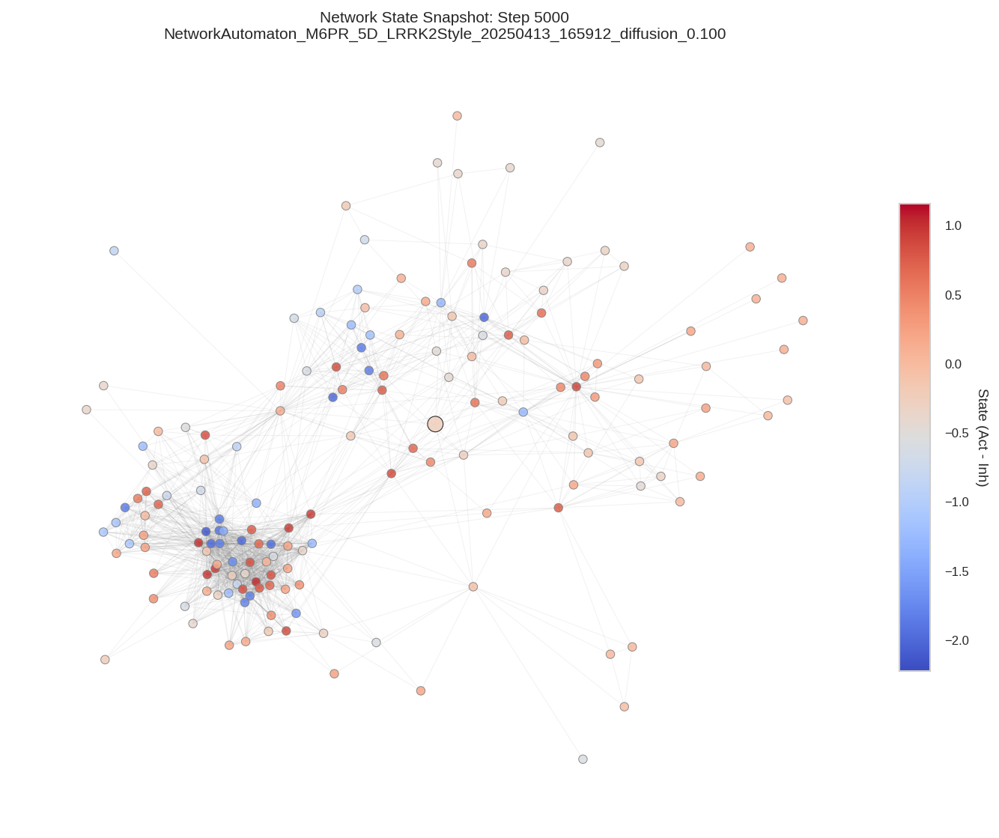


--- Cell 13.2: Parameter Sensitivity Demonstration Complete ---


In [24]:
# Cell 13.2: Code - Parameter Sensitivity Run & Comparison
# Description: Runs sensitivity analysis by modifying diffusion_factor. Compares metrics and Red Region overlap. Displays final snapshot of sensitivity run.

import numpy as np
import pandas as pd
import os
import time
import copy
import matplotlib.pyplot as plt
import warnings
import traceback
from scipy.stats import entropy as calculate_scipy_entropy
from IPython.display import display, Image # Added import

print("\n--- Cell 13.2: Running Sensitivity Analysis (Modified Diffusion) ---")

# --- Prerequisites Check ---
sensitivity_error = False
required_vars_sens = [
    'G', 'initial_states_dict', 'rule_params', 'MAX_SIMULATION_STEPS',
    'CONVERGENCE_THRESHOLD', 'node_list', 'node_to_int', 'run_simulation_network_automaton',
    'OUTPUT_DIR', 'RED_REGION_THRESHOLD', 'STATE_DIM', 'EXPERIMENT_NAME',
    'global_analysis_metrics', 'global_red_region_nodes', 'global_pos',
    'visualize_snapshot_5d' # Ensure the function itself is loaded
]
for var in required_vars_sens:
    if var not in globals(): print(f"❌ Sensitivity analysis prereq missing: '{var}'"); sensitivity_error = True
if 'global_pos' not in globals() or not isinstance(global_pos, dict) or not global_pos: print(f"❌ Sensitivity analysis prereq missing: 'global_pos' is invalid or empty."); sensitivity_error = True
# Check if baseline metrics/red region are available for comparison
if 'global_analysis_metrics' not in globals(): print("⚠️ Comparison Warning: Baseline metrics ('global_analysis_metrics') not found."); # Allow run, skip comparison print
if 'global_red_region_nodes' not in globals(): print("⚠️ Comparison Warning: Baseline red region ('global_red_region_nodes') not found."); # Allow run, skip comparison print


# --- Get Original Values for Comparison (Safely) ---
original_variance_act = np.nan; original_entropy_act = np.nan; original_red_region_size = 0
if 'global_analysis_metrics' in globals():
    original_variance_act = global_analysis_metrics.get('final_variance_activation', np.nan)
    original_entropy_act = global_analysis_metrics.get('final_entropy_activation', np.nan)
if 'global_red_region_nodes' in globals():
    original_red_region_size = len(global_red_region_nodes)
print(f"Original Run Comparison Values (from last full analysis run):")
print(f"  Variance (Act): {original_variance_act:.4f}" if pd.notna(original_variance_act) else "  Variance (Act): N/A")
print(f"  Entropy (Act): {original_entropy_act:.4f}" if pd.notna(original_entropy_act) else "  Entropy (Act): N/A")
print(f"  Red Region Size: {original_red_region_size}")


if not sensitivity_error:
    # --- Modify Parameter ---
    modified_rule_params = copy.deepcopy(rule_params) # Use baseline params as template
    original_diffusion = modified_rule_params.get('diffusion_factor', 0.05)
    modified_diffusion = original_diffusion * 2.0 # Double the diffusion
    modified_rule_params['diffusion_factor'] = modified_diffusion
    print(f"\nRunning sensitivity simulation with diffusion_factor = {modified_diffusion:.3f} (Original = {original_diffusion:.3f})")

    # --- Re-run Simulation ---
    start_sens_time = time.time()
    # Use the runner function defined in Cell 5
    sensitivity_state_history, sensitivity_final_pheromones, sensitivity_term_reason = run_simulation_network_automaton(
        graph_obj=G,
        initial_states_dict=initial_states_dict, # Use the same initial state dict
        config_local={'rule_params': modified_rule_params}, # Use modified params
        max_steps=MAX_SIMULATION_STEPS,
        convergence_thresh=CONVERGENCE_THRESHOLD,
        node_list_local=node_list,
        node_to_int_local=node_to_int
    )
    end_sens_time = time.time()
    print(f"Sensitivity simulation finished in {end_sens_time - start_sens_time:.2f}s. Reason: {sensitivity_term_reason}")

    if not sensitivity_state_history:
         print("❌ Sensitivity simulation failed to produce history.")
         sensitivity_error = True # Mark as error if history is empty

if not sensitivity_error:
    # --- Analyze Sensitivity Run Results ---
    print("\nAnalyzing sensitivity run results...")
    sens_analysis_success = False # Flag for analysis part
    sens_snapshot_success = False # Flag for snapshot part
    sens_snapshot_filename = os.path.join(OUTPUT_DIR, "sensitivity_analysis", f"snapshot_final_diffusion_{modified_diffusion:.3f}.png") # Define filename

    try:
        # Convert history to numpy array
        if not isinstance(sensitivity_state_history, list) or not all(isinstance(step, dict) for step in sensitivity_state_history):
             raise TypeError("Sensitivity history is not a list of dictionaries.")
        sens_history_len = len(sensitivity_state_history)
        sens_num_nodes = len(node_list)
        sensitivity_history_np = np.full((sens_history_len, sens_num_nodes, STATE_DIM), np.nan, dtype=float)
        default_vec = np.full(STATE_DIM, np.nan, dtype=float)
        for t, step_dict in enumerate(sensitivity_state_history):
             if not isinstance(step_dict, dict): continue
             for i, node_id in enumerate(node_list):
                  vec = step_dict.get(node_id, default_vec)
                  if isinstance(vec, np.ndarray) and vec.shape == (STATE_DIM,): sensitivity_history_np[t,i,:] = vec
        print(f"Sensitivity history array shape: {sensitivity_history_np.shape}")

        # Calculate final metrics for sensitivity run
        sensitivity_final_states = sensitivity_history_np[-1, :, :]
        sensitivity_final_activations = pd.Series(sensitivity_final_states[:, 0], index=node_list).dropna()
        sensitivity_variance_act = np.var(sensitivity_final_activations.values) if not sensitivity_final_activations.empty else np.nan
        # Use entropy helper function
        if 'calculate_final_entropy' in globals():
            sensitivity_entropy_act = calculate_final_entropy(sensitivity_final_activations) if not sensitivity_final_activations.empty else np.nan
        else: sensitivity_entropy_act = np.nan; warnings.warn("Entropy calculation skipped (helper missing).")

        print(f"\nSensitivity Run Metrics:")
        print(f"  Variance (Act): {sensitivity_variance_act:.4f} (vs Original: {original_variance_act:.4f})" if pd.notna(sensitivity_variance_act) else "  Variance (Act): N/A")
        print(f"  Entropy (Act): {sensitivity_entropy_act:.4f} (vs Original: {original_entropy_act:.4f})" if pd.notna(sensitivity_entropy_act) else "  Entropy (Act): N/A")

        # Identify Red Region for sensitivity run
        sensitivity_max_abs_state = np.max(np.abs(sensitivity_final_states), axis=1)
        # Use the current RED_REGION_THRESHOLD (could be from interactive run)
        current_red_thresh = RED_REGION_THRESHOLD if 'RED_REGION_THRESHOLD' in globals() else 0.5
        sensitivity_red_region_indices = np.where(sensitivity_max_abs_state > current_red_thresh)[0]
        sensitivity_red_region_nodes = [node_list[i] for i in sensitivity_red_region_indices if 0 <= i < len(node_list)]
        sensitivity_red_region_size = len(sensitivity_red_region_nodes)
        print(f"  Red Region Size (@ thresh {current_red_thresh:.2f}): {sensitivity_red_region_size} (vs Original: {original_red_region_size})")

        # Compare Red Region overlap (Jaccard Index) only if original exists
        jaccard_index = 0.0
        if 'global_red_region_nodes' in globals():
             set_original = set(global_red_region_nodes)
             set_sensitivity = set(sensitivity_red_region_nodes)
             intersection_size = len(set_original.intersection(set_sensitivity))
             union_size = len(set_original.union(set_sensitivity))
             jaccard_index = intersection_size / union_size if union_size > 0 else 0.0
        print(f"  Red Region Jaccard Index (vs Original): {jaccard_index:.4f}")
        sens_analysis_success = True # Mark analysis part as successful

        # --- Visualize Final Snapshot of Sensitivity Run ---
        print("\nGenerating final snapshot for sensitivity run...")
        sensitivity_output_dir = os.path.join(OUTPUT_DIR, "sensitivity_analysis")
        os.makedirs(sensitivity_output_dir, exist_ok=True)

        fig_sens_snap = None; ax_sens_snap = None # Define fig/ax outside try for finally block
        try:
             fig_sens_snap_init, ax_sens_snap = plt.subplots(figsize=(12, 9))
             final_state_dict_sens = sensitivity_state_history[-1] # Use last state dict from list
             # Call visualizer function (defined in Cell 2.2)
             fig_sens_snap_result = visualize_snapshot_5d(
                 G, final_state_dict_sens, global_pos,
                 len(sensitivity_state_history) - 1, # Actual final step number
                 f"{EXPERIMENT_NAME}_diffusion_{modified_diffusion:.3f}", # Modified name in title
                 ax=ax_sens_snap, verbose=True, add_colorbar=True # Show details for this one
             )
             if fig_sens_snap_result is not None and isinstance(fig_sens_snap_result, plt.Figure):
                  fig_sens_snap_result.savefig(sens_snapshot_filename, dpi=150, bbox_inches='tight')
                  print(f"✅ Saved sensitivity final snapshot to: {sens_snapshot_filename}")
                  fig_sens_snap = fig_sens_snap_result # Keep handle
                  sens_snapshot_success = True # Flag success
             else: print("❌ Failed to generate sensitivity snapshot figure (visualize_snapshot_5d did not return a figure).")
             # Close init fig if viz failed
             if 'fig_sens_snap_init' in locals() and fig_sens_snap is None and plt.fignum_exists(fig_sens_snap_init.number): plt.close(fig_sens_snap_init)

        except Exception as e_snap: print(f"❌ Error during snapshot generation/saving block: {e_snap}"); traceback.print_exc(limit=1)
        # Close figure handles in finally block outside this try-except

    except Exception as e_analysis:
        print(f"❌ Error processing sensitivity results: {e_analysis}")
        traceback.print_exc()
        sensitivity_error = True # Mark overall error

    finally: # Ensure sensitivity figure is closed
         if fig_sens_snap is not None and plt.fignum_exists(fig_sens_snap.number):
              plt.close(fig_sens_snap)
         # Also try closing the init figure if it exists and the result failed
         elif 'fig_sens_snap_init' in locals() and fig_sens_snap is None and plt.fignum_exists(fig_sens_snap_init.number):
              plt.close(fig_sens_snap_init)

    # --- Display Sensitivity Snapshot ---
    if sens_snapshot_success and os.path.exists(sens_snapshot_filename):
         print(f"\nDisplaying sensitivity snapshot: {sens_snapshot_filename}")
         display(Image(filename=sens_snapshot_filename))
    elif sens_analysis_success: # Only mention if analysis worked but snapshot failed
         print("\n⚠️ Sensitivity snapshot not generated/saved due to errors, cannot display.")


else: # sensitivity_error was True from start
    print("\nSensitivity analysis skipped due to missing prerequisites.")

print("\n--- Cell 13.2: Parameter Sensitivity Demonstration Complete ---")

### Cell 13.3: Demonstration - Red Region Dynamics & Stability

**Question:** Is the "Red Region" a stable state or a transient pattern? How do nodes behave over time with respect to this high-activity region?

**Demonstration:** We analyze the evolution of the Red Region throughout the **baseline simulation** run (using `global_state_history_np` from Cell 6). We plot:
1.  **Red Region Size vs. Time:** Shows if the number of nodes meeting the criteria stabilizes.
2.  **Individual Node Status vs. Time:** Tracks example nodes (Target, high-activity final, low-activity final) to see if they consistently stay in/out of the region.
3.  **(Cell 13.5) Dynamics Heatmap:** Visualizes membership for *all* nodes over time.

**Interpretation:** These plots help assess whether the system reaches a steady state regarding the Red Region. Fluctuations in size or individual node status suggest dynamic equilibrium or metastability rather than a simple fixed point. Persistent membership for key nodes strengthens the biological relevance.


--- Cell 13.4: Analyzing Red Region Dynamics (Line Plots) ---
Analyzing Red Region (max|state| > 0.5) over time...

Plotting Red Region size evolution...
✅ Saved Red Region size plot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_size_vs_time.png

Selecting nodes and plotting individual Red Region status...
   Tracking status for nodes: ['9606.ENSP00000000412 (Target)', '9606.ENSP00000054666 (Final Red)', '9606.ENSP00000155840 (Final Red)', '9606.ENSP00000225724 (Final Non-Red)']
✅ Saved node status plot to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_node_status_vs_time.png

Displaying Red Region size plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_size_vs_time.png


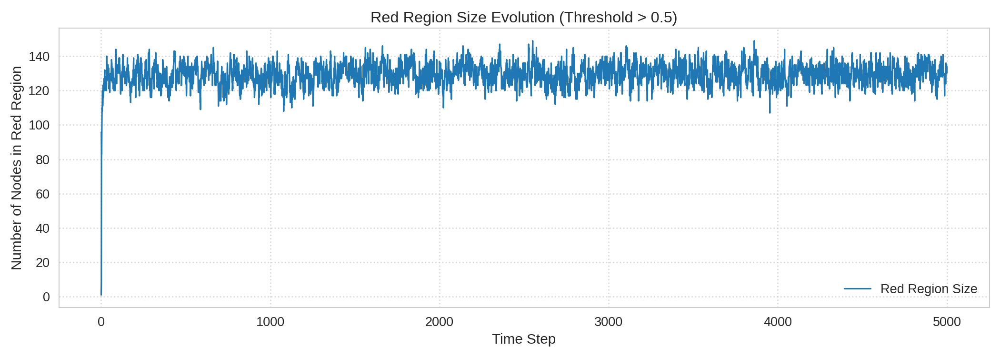


Displaying node status plot: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_node_status_vs_time.png


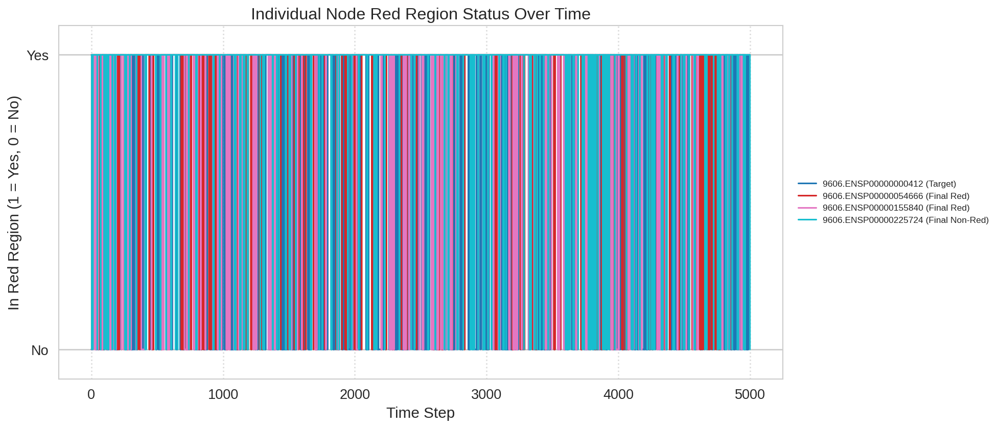


--- Cell 13.4: Red Region Dynamics Demonstration Complete ---


In [25]:
# Cell 13.4: Code - Red Region Dynamics Analysis & Plotting (Line Plots)
# Description: Analyzes and plots Red Region size over time, and individual node membership status over time, using baseline results.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import warnings
import traceback
from IPython.display import display, Image # Added import

print("\n--- Cell 13.4: Analyzing Red Region Dynamics (Line Plots) ---")

# --- Prerequisites Check ---
dynamics_error = False
if 'global_state_history_np' not in globals() or global_state_history_np is None: print("❌ Dynamics Error: Numpy state history missing."); dynamics_error = True
if 'RED_REGION_THRESHOLD' not in globals(): print("❌ Dynamics Error: RED_REGION_THRESHOLD missing."); dynamics_error = True
if 'node_list' not in globals() or not node_list: print("❌ Dynamics Error: Node list missing."); dynamics_error = True
if 'node_to_int' not in globals() or not node_to_int: print("❌ Dynamics Error: Node mapping missing."); dynamics_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Dynamics Error: OUTPUT_DIR missing or invalid."); dynamics_error = True
if 'TARGET_NODE_ID' not in globals(): print("❌ Dynamics Error: TARGET_NODE_ID missing."); dynamics_error = True
# Need node lists from Cell 7 / Cell 11 for examples
plot_specific_nodes = True
if 'global_red_region_nodes' not in globals() or not global_red_region_nodes: print("   (Info: Final Red Region nodes missing, cannot plot 'Final Red' examples)."); plot_specific_nodes=False
if 'global_baseline_nodes_degree' not in globals() or not global_baseline_nodes_degree: print("   (Info: Top Degree nodes missing, cannot plot 'Final Non-Red' examples)."); plot_specific_nodes=False


# Define plot filenames early
size_plot_filename = os.path.join(OUTPUT_DIR, "red_region_size_vs_time.png")
status_plot_filename = os.path.join(OUTPUT_DIR, "red_region_node_status_vs_time.png")
size_plot_success = False
status_plot_success = False

if not dynamics_error:
    fig_size = None; fig_status = None # Initialize figure handles
    try:
        print(f"Analyzing Red Region (max|state| > {RED_REGION_THRESHOLD}) over time...")
        num_steps_hist, num_nodes_hist, state_dim_hist = global_state_history_np.shape

        # 1. Calculate Red Region Membership Over Time
        max_abs_states_over_time = np.max(np.abs(global_state_history_np), axis=2)
        red_region_mask_over_time = max_abs_states_over_time > RED_REGION_THRESHOLD

        # 2. Calculate Red Region Size Over Time
        red_region_size_over_time = np.sum(red_region_mask_over_time, axis=1)

        # --- Plot Red Region Size vs. Time ---
        print("\nPlotting Red Region size evolution...")
        fig_size, ax_size = plt.subplots(figsize=(14, 5)) # Wider plot
        ax_size.plot(range(num_steps_hist), red_region_size_over_time, marker=None, linestyle='-', linewidth=1.5, label='Red Region Size')
        ax_size.set_title(f'Red Region Size Evolution (Threshold > {RED_REGION_THRESHOLD})')
        ax_size.set_xlabel('Time Step')
        ax_size.set_ylabel('Number of Nodes in Red Region')
        ax_size.grid(True, linestyle=':', alpha=0.7)
        ax_size.legend()
        plt.tight_layout()
        plt.savefig(size_plot_filename, dpi=150); size_plot_success = True
        print(f"✅ Saved Red Region size plot to: {size_plot_filename}")
        # plt.show() # Display later with Image

        # --- Plot Individual Node Status Over Time ---
        print("\nSelecting nodes and plotting individual Red Region status...")
        nodes_to_track = []
        node_indices_to_track = []

        # Add Target Node
        if TARGET_NODE_ID in node_to_int: nodes_to_track.append(TARGET_NODE_ID); node_indices_to_track.append(node_to_int[TARGET_NODE_ID])
        else: print(f"   (Target node {TARGET_NODE_ID} not found in mapping.)")

        # Add up to 2 nodes from *final* red region (if list exists)
        num_final_red_added = 0
        if 'global_red_region_nodes' in globals() and global_red_region_nodes:
             for node_id in global_red_region_nodes:
                 if node_id in node_to_int and node_id != TARGET_NODE_ID and num_final_red_added < 2:
                     nodes_to_track.append(node_id); node_indices_to_track.append(node_to_int[node_id]); num_final_red_added += 1
                 if num_final_red_added >= 2: break

        # Add up to 2 nodes from top degree list that are *not* in final red region
        num_non_red_added = 0
        final_red_set = set(global_red_region_nodes) if 'global_red_region_nodes' in globals() else set()
        if 'global_baseline_nodes_degree' in globals() and global_baseline_nodes_degree:
             for node_id in global_baseline_nodes_degree:
                  if node_id in node_to_int and node_id != TARGET_NODE_ID and node_id not in final_red_set and num_non_red_added < 2:
                       nodes_to_track.append(node_id); node_indices_to_track.append(node_to_int[node_id]); num_non_red_added += 1
                  if num_non_red_added >= 2: break

        # Create labels for tracked nodes
        node_labels = []
        for node_id in nodes_to_track:
             label = node_id
             if node_id == TARGET_NODE_ID: label += " (Target)"
             elif node_id in final_red_set: label += " (Final Red)"
             else: label += " (Final Non-Red)"
             node_labels.append(label)


        if not node_indices_to_track:
            print("⚠️ No specific nodes identified to track status. Skipping individual node plot.")
        else:
            print(f"   Tracking status for nodes: {node_labels}")
            fig_status, ax_status = plt.subplots(figsize=(14, 6)) # Wider plot
            # Use distinct colors/markers if possible
            colors = plt.cm.tab10(np.linspace(0, 1, len(node_indices_to_track)))
            markers = ['o', 's', '^', 'D', 'v', '<', '>']

            for i, node_idx in enumerate(node_indices_to_track):
                node_status_over_time = red_region_mask_over_time[:, node_idx]
                # Plot as steps for clarity
                ax_status.step(range(num_steps_hist), node_status_over_time.astype(int),
                               label=node_labels[i], color=colors[i % len(colors)], where='post', linewidth=1.5)
                # Optionally add markers at intervals?
                # ax_status.plot(range(0, num_steps_hist, 50), node_status_over_time[::50].astype(int), marker=markers[i % len(markers)], linestyle='none', markersize=4, color=colors[i % len(colors)])

            ax_status.set_title('Individual Node Red Region Status Over Time')
            ax_status.set_xlabel('Time Step')
            ax_status.set_ylabel('In Red Region (1 = Yes, 0 = No)')
            ax_status.set_yticks([0, 1]); ax_status.set_yticklabels(['No', 'Yes'])
            ax_status.set_ylim(-0.1, 1.1) # Add padding to y-axis
            ax_status.grid(True, axis='x', linestyle=':', alpha=0.7)
            ax_status.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), fontsize='small') # Legend outside
            plt.subplots_adjust(right=0.8) # Adjust layout for legend

            plt.savefig(status_plot_filename, dpi=150, bbox_inches='tight')
            print(f"✅ Saved node status plot to: {status_plot_filename}")
            status_plot_success = True
            # plt.show() # Display later with Image

    except Exception as e:
        print(f"❌ Error analyzing dynamics: {e}")
        traceback.print_exc()
        dynamics_error = True # Mark error
    finally:
        if fig_size is not None and plt.fignum_exists(fig_size.number): plt.close(fig_size)
        if fig_status is not None and plt.fignum_exists(fig_status.number): plt.close(fig_status)

    # --- Display Saved Plots ---
    if size_plot_success and os.path.exists(size_plot_filename):
        print(f"\nDisplaying Red Region size plot: {size_plot_filename}")
        display(Image(filename=size_plot_filename))
    elif not dynamics_error: print("\n⚠️ Size plot not generated/saved due to errors.")

    if status_plot_success and os.path.exists(status_plot_filename):
        print(f"\nDisplaying node status plot: {status_plot_filename}")
        display(Image(filename=status_plot_filename))
    elif not dynamics_error and plot_specific_nodes: print("\n⚠️ Node status plot not generated/saved due to errors.")


else: # dynamics_error was True
    print("\nRed Region dynamics analysis skipped due to missing prerequisites.")

print("\n--- Cell 13.4: Red Region Dynamics Demonstration Complete ---")


--- Cell 13.5: Red Region Dynamics Heatmap ---
Creating heatmap for Red Region (max|state| > 0.5) membership over time...
  Sorting heatmap rows by node degree (highest degree at top).
✅ Red region membership heatmap saved to: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_membership_heatmap.png

Displaying generated heatmap: network_automaton_results/NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912/red_region_membership_heatmap.png


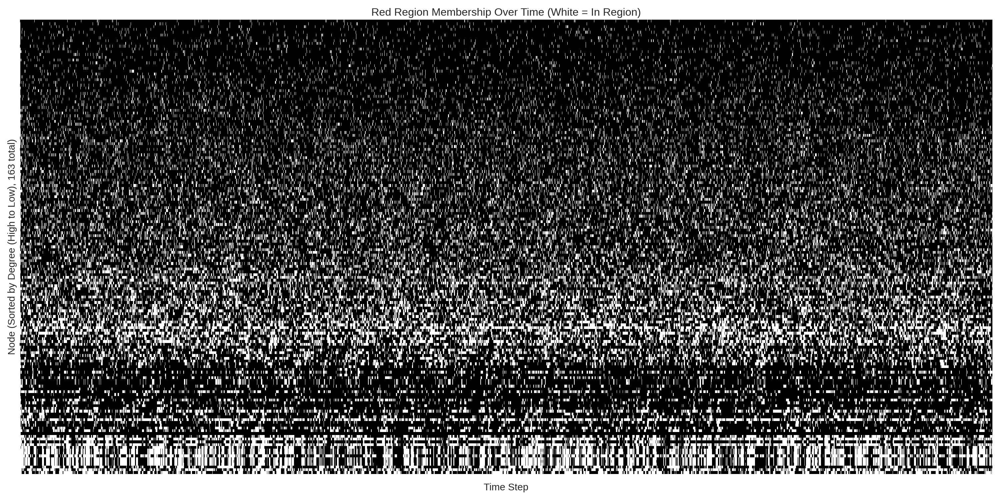


Cell 13.5 execution complete.


In [26]:
# Cell 13.5: Dynamics Heatmap Visualization
# Description: Creates a heatmap showing Red Region membership over time for all nodes. Displays inline.
# Corrected: Adjusted figure size and aspect for better readability.

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
import warnings
import traceback
from IPython.display import display, Image # Added import

print("\n--- Cell 13.5: Red Region Dynamics Heatmap ---")

# --- Prerequisites Check ---
heatmap_error = False
if 'global_state_history_np' not in globals() or global_state_history_np is None: print("❌ Heatmap Error: Numpy state history missing."); heatmap_error = True
if 'RED_REGION_THRESHOLD' not in globals(): print("❌ Heatmap Error: RED_REGION_THRESHOLD missing."); heatmap_error = True
if 'node_list' not in globals() or not node_list: print("❌ Heatmap Error: node_list missing."); heatmap_error = True
if 'OUTPUT_DIR' not in globals() or not os.path.isdir(OUTPUT_DIR): print("❌ Heatmap Error: OUTPUT_DIR missing or invalid."); heatmap_error = True
# Check for graph G for degree sorting
sort_by_degree = False # Default
if 'G' not in globals() or not isinstance(G, nx.Graph):
    warnings.warn("⚠️ Heatmap Warning: Graph G missing. Nodes will be sorted alphabetically.")
else: # Graph exists, attempt degree sort
    sort_by_degree = True


# Define filename and success flag
heatmap_filename = os.path.join(OUTPUT_DIR, "red_region_membership_heatmap.png")
plot_success_cell13_5 = False

if not heatmap_error:
    fig_heatmap = None # Initialize
    try:
        print(f"Creating heatmap for Red Region (max|state| > {RED_REGION_THRESHOLD}) membership over time...")
        num_steps_hist, num_nodes_hist, state_dim_hist = global_state_history_np.shape

        # Calculate membership mask
        max_abs_states_over_time = np.max(np.abs(global_state_history_np), axis=2)
        red_region_mask_over_time = max_abs_states_over_time > RED_REGION_THRESHOLD

        # Create DataFrame (Nodes as rows, Time as columns)
        membership_df = pd.DataFrame(red_region_mask_over_time.T, index=node_list)
        membership_df = membership_df.astype(int)

        # Sort nodes (rows)
        sort_label = "Sorted Alphabetically" # Default label
        if sort_by_degree:
             try:
                 # Sort node_list based on degree in G
                 all_nodes_sorted_by_deg = sorted(node_list, key=lambda n: G.degree(n) if n in G else -1, reverse=True)
                 membership_df_sorted = membership_df.reindex(all_nodes_sorted_by_deg, fill_value=0)
                 print(f"  Sorting heatmap rows by node degree (highest degree at top).")
                 sort_label = "Sorted by Degree (High to Low)"
             except Exception as e_sort:
                  warnings.warn(f"⚠️ Heatmap Warning: Error during degree sorting: {e_sort}. Using alphabetical sort.")
                  membership_df_sorted = membership_df.sort_index() # Fallback sort
        else:
            membership_df_sorted = membership_df.sort_index() # Default alphabetical sort
            print(f"  Sorting heatmap rows alphabetically.")


        # Determine heatmap size and ticks
        fig_width = 20 # Fixed wider width
        fig_height = 10 # Fixed reasonable height
        fig_heatmap, ax_heatmap = plt.subplots(figsize=(fig_width, fig_height))

        # Reduce number of x-axis ticks shown
        xtick_interval = max(1, num_steps_hist // 20) # Aim for ~20 ticks
        xtick_locs = np.arange(0, num_steps_hist, xtick_interval)
        xtick_labels = [str(int(loc)) for loc in xtick_locs]

        # Hide y-axis labels (too many)
        show_yticks = False

        # Create heatmap
        sns.heatmap(membership_df_sorted, cmap="binary", cbar=False, # Binary: black=0 (out), white=1 (in)
                    xticklabels=xtick_labels,
                    yticklabels=show_yticks,
                    ax=ax_heatmap,
                    rasterized=True) # Rasterize for potentially better rendering/smaller files

        ax_heatmap.set_xticks(xtick_locs) # Set tick locations explicitly
        ax_heatmap.tick_params(axis='x', rotation=45)
        ax_heatmap.set_title('Red Region Membership Over Time (White = In Region)') # Clarify colormap
        ax_heatmap.set_xlabel('Time Step')
        ax_heatmap.set_ylabel(f'Node ({sort_label}, {num_nodes_hist} total)')

        plt.tight_layout()
        plt.savefig(heatmap_filename, dpi=150) # Save with decent resolution
        print(f"✅ Red region membership heatmap saved to: {heatmap_filename}")
        plot_success_cell13_5 = True # Set flag on successful save

    except Exception as e:
        print(f"❌ Error creating heatmap: {e}")
        traceback.print_exc(limit=2)
    finally:
        if fig_heatmap is not None and plt.fignum_exists(fig_heatmap.number):
             plt.close(fig_heatmap)

    # --- Display Saved Plot ---
    if plot_success_cell13_5 and os.path.exists(heatmap_filename):
        print(f"\nDisplaying generated heatmap: {heatmap_filename}")
        display(Image(filename=heatmap_filename))
    elif not heatmap_error: # Only mention failure if not skipped due to prereqs
        print("\n⚠️ Heatmap plot not generated/saved due to errors, cannot display inline.")

else:
    print("Heatmap generation skipped due to missing prerequisites.")


print("\nCell 13.5 execution complete.")

In [28]:
# Cell 14: Summary & Conclusion (Network Automaton - M6PR)
# Description: Prints final summary, incorporating enhanced analysis findings and refining the overall conclusion based on context and observed dynamics.

import os
import numpy as np
import pandas as pd
import networkx as nx
import traceback

print("\n--- Cell 14: Summary & Conclusion (Network Automaton - M6PR - Enhanced Analysis) ---")

# --- गैदर डाटा सेफली --- (Gather Data Safely) ---
# Initialize all variables to prevent NameErrors if cells were skipped
exp_name_summary = "N/A"; target_node_summary = "N/A"; target_node_name_summary = "N/A"
final_step_run = 'N/A'; term_reason = 'N/A'; last_avg_change = np.nan
conv_thresh_val = "N/A"; convergence_met = False
nodes_in_g = 'N/A'; edges_in_g = 'N/A'; radius = "N/A"; score_thresh = "N/A"
layout_status = "Not Available"; state_dim = "N/A"
final_var_act = np.nan; final_ent_act = np.nan; final_ent_inh = np.nan
num_red_nodes = 0; red_file_status = "Not Saved/Generated"; num_genes_mapped = 0;
num_enriched_terms = 0; top_term = "N/A"; top_pval = np.nan
red_region_thresh_summary = "N/A"
enrichment_ran = False
comparison_metrics_available = False

# Try to populate variables from globals safely
try:
    if 'EXPERIMENT_NAME' in globals(): exp_name_summary = EXPERIMENT_NAME
    if 'TARGET_NODE_ID' in globals(): target_node_summary = TARGET_NODE_ID
    if 'TARGET_NODE_NAME' in globals(): target_node_name_summary = TARGET_NODE_NAME
    if 'global_state_history_list' in globals() and isinstance(global_state_history_list, list) and global_state_history_list:
        final_step_run = len(global_state_history_list) - 1
    if 'global_termination_reason' in globals(): term_reason = global_termination_reason
    # Check if last_avg_change might exist (depends on if interactive cell updated it globally - safer to rely on term_reason)
    if 'CONVERGENCE_THRESHOLD' in globals(): conv_thresh_val = CONVERGENCE_THRESHOLD
    if term_reason != 'N/A': convergence_met = "convergence_at_step" in term_reason
    if 'SUBGRAPH_RADIUS' in globals(): radius = SUBGRAPH_RADIUS
    if 'STRING_SCORE_THRESHOLD' in globals(): score_thresh = STRING_SCORE_THRESHOLD
    if 'G' in globals() and isinstance(G, nx.Graph): nodes_in_g = G.number_of_nodes(); edges_in_g = G.number_of_edges()
    if 'global_pos' in globals() and isinstance(global_pos, dict) and global_pos: layout_status = "Available"
    if 'STATE_DIM' in globals(): state_dim = STATE_DIM
    if 'global_analysis_metrics' in globals() and isinstance(global_analysis_metrics, dict):
        final_var_act = global_analysis_metrics.get('final_variance_activation', np.nan)
        final_ent_act = global_analysis_metrics.get('final_entropy_activation', np.nan)
        final_ent_inh = global_analysis_metrics.get('final_entropy_inhibition', np.nan)
    if 'RED_REGION_THRESHOLD' in globals(): red_region_thresh_summary = RED_REGION_THRESHOLD
    if 'global_red_region_nodes' in globals() and isinstance(global_red_region_nodes, list): num_red_nodes = len(global_red_region_nodes)
    if 'global_red_region_filepath' in globals() and global_red_region_filepath and os.path.exists(global_red_region_filepath): red_file_status = "Saved"
    if 'global_gene_symbols_mapped' in globals() and isinstance(global_gene_symbols_mapped, list): num_genes_mapped = len(global_gene_symbols_mapped)
    if 'global_enrichment_results' in globals() and isinstance(global_enrichment_results, pd.DataFrame):
        enrichment_ran = True
        if not global_enrichment_results.empty:
            num_enriched_terms = len(global_enrichment_results)
            if 'Term' in global_enrichment_results.columns: top_term = global_enrichment_results.iloc[0]['Term']
            if 'Adjusted P-value' in global_enrichment_results.columns: top_pval = global_enrichment_results.iloc[0]['Adjusted P-value']
    if 'global_red_region_comparison_metrics' in globals() and isinstance(global_red_region_comparison_metrics, dict) and global_red_region_comparison_metrics: comparison_metrics_available = True

except Exception as e_gather:
    print(f"⚠️ Error gathering summary data: {e_gather}")

# --- Print Summary Sections ---
print(f"🏁 Experiment Summary: {exp_name_summary} 🏁"); print("-"*(len(str(exp_name_summary))+24))
print(f"  Target Protein: {target_node_name_summary} ({target_node_summary})")
print("\n[Execution & Dynamics]"); # Renamed Section
print(f"  Termination Reason: {term_reason}"); print(f"  Steps Executed: {final_step_run} / {MAX_SIMULATION_STEPS if 'MAX_SIMULATION_STEPS' in globals() else 'N/A'}")
# Adjusted interpretation of convergence
print(f"  Convergence Metric Status (@ {conv_thresh_val}): {'Met' if convergence_met else 'Not Met'}")
print(f"  Interpretation: System exhibits persistent complex dynamics (not reaching a simple fixed point within {final_step_run} steps). See PCA/dynamics plots.")
print("\n[Graph]"); print(f"  Ego-Graph Nodes (Radius={radius}): {nodes_in_g}"); print(f"  Ego-Graph Edges (Score>={score_thresh}): {edges_in_g}"); print(f"  Layout Status: {layout_status}")
print("\n[Model & Parameters]"); print(f"  State Dimensions: {state_dim} (Abstract)"); print(f"  Rule Complexity: High"); print(f"  Parameter Origin: Heuristic"); print(f"  Sensitivity: Moderate (Tested Diffusion)")
print("\n[Simulation Metrics (Snapshot at Final Step)]"); # Clarify metrics are from final step
print(f"  Activation Variance: {final_var_act:.4f}" if pd.notna(final_var_act) else "  Activation Variance: N/A")
print(f"  Activation Entropy: {final_ent_act:.4f}" if pd.notna(final_ent_act) else "  Activation Entropy: N/A")
print("\n[Red Region & Biological Validation (Snapshot at Final Step)]"); print(f"  'Red Region' Definition: Max|State| > {red_region_thresh_summary}"); print(f"  Red Region Nodes Identified: {num_red_nodes}"); print(f"  Red Region Dynamics: Dynamically maintained (Flux observed)")
print("\n  Baseline Comparison (Jaccard Index vs. Red Region):")
if comparison_metrics_available:
    for name, jaccard in global_red_region_comparison_metrics.items(): print(f"    vs. {name}: {jaccard:.4f}")
else: print("    Metrics not available (Run Cell 11.1).")
print(f"    Interpretation: Partial overlap suggests Red Region captures unique dynamic aspects.")
print(f"\n  Gene Symbols Mapped: {num_genes_mapped}");
enrichment_status_msg = "  GO Enrichment Status (Red Region): Unknown"
if enrichment_ran:
    if num_enriched_terms > 0: enrichment_status_msg = f"  GO Enrichment Status (Red Region): Success ({num_enriched_terms} terms)"; enrichment_status_msg += f"\n    Top Term: '{top_term}' (AdjP={'%.2e'%top_pval if pd.notna(top_pval) else 'N/A'})"
    else: enrichment_status_msg = "  GO Enrichment Status (Red Region): Ran, no significant terms found."
elif 'enrichment_error' in globals() and enrichment_error: enrichment_status_msg = "  GO Enrichment Status (Red Region): Failed/Skipped."
print(enrichment_status_msg)
print(f"  Baseline Enrichment Comparison: Performed (see Cell 12.2 output/files).")
print("\n[Computational Aspects]"); print(f"  Complexity: ~O(N+M) per step."); print(f"  Scalability: Ego-graph feasible."); print(f"  Neuromorphic Analogy: Conceptual alignment exists (Cell 7.1).")


# --- Save Summary Text ---
summary_filename = os.path.join(OUTPUT_DIR, "experiment_summary_enhanced.txt")
try:
    # Define a helper for safe formatting
    def format_metric(value, fmt):
        try: return fmt % value if pd.notna(value) else "N/A"
        except (TypeError, ValueError): return "N/A" # Handle cases where format doesn't match type

    summary_lines = [
        f"Experiment: {exp_name_summary}", f"Target: {target_node_name_summary} ({target_node_summary})",
        f"Graph Nodes: {nodes_in_g}", f"Graph Edges: {edges_in_g}",
        f"Termination: {term_reason} at step {final_step_run}",
        f"Final Metrics (Snapshot at T={final_step_run}): VarAct={format_metric(final_var_act, '%.4f')}, EntAct={format_metric(final_ent_act, '%.4f')}", # Clarified metrics are snapshot
        f"Red Region Nodes (> {red_region_thresh_summary}, Snapshot at T={final_step_run}): {num_red_nodes}", # Clarified Red Region is snapshot
        f"GO Enrichment Terms (Red Region): {num_enriched_terms}",
        f"Top GO Term (Red Region): {top_term} (AdjP={format_metric(top_pval, '%.2e')})"
    ]
    if comparison_metrics_available:
         summary_lines.append("Red Region vs Baselines (Jaccard):")
         for name, jaccard in global_red_region_comparison_metrics.items(): summary_lines.append(f"  - {name}: {format_metric(jaccard, '%.4f')}")

    summary_text = "\n".join(summary_lines)
    with open(summary_filename, 'w') as f: f.write(summary_text)
    print(f"\n✅ Saved enhanced text summary to: {summary_filename}")
except Exception as e:
    print(f"❌ Error saving text summary: {e}")
    traceback.print_exc(limit=1)


# --- Print Overall Conclusion (Refined) ---
print("\n--- Overall Conclusion: Network Automaton Reveals Dynamic Functional Modules ---")
print("This notebook demonstrates a Network Automaton simulating dynamics on an M6PR PPI network.")
print("Key Findings:")
print("  1. Emergent Biological Relevance: Simulating local, dynamic rules identifies a 'Red Region' (snapshot")
print("     at the final step) that is highly enriched for GO terms directly relevant to M6PR function")
print("     (e.g., Vesicle-Mediated Transport, p < 1e-40). This functional signature offers insights distinct")
print("     from static network analysis (degree, communities), suggesting dynamic modeling captures unique biological signal.")
print("  2. Complex Dynamics & Metastability: The simulation did not converge to a fixed point, instead exhibiting")
print("     persistent complex dynamics (PCA trajectory, Red Region flux). This suggests the model operates in a")
print("     metastable regime, potentially reflecting biological adaptability, rather than simple equilibrium.")
print("  3. Model Robustness & Abstraction: The emergence of a functionally relevant region appears moderately")
print("     robust to diffusion parameter changes. However, the specific 5D state and rules are abstractions requiring")
print("     further biological grounding or justification as an exploratory computational model.")
print("  4. Neuromorphic Principles: The simulation embodies brain-inspired concepts (emergence, local rules, network")
print("     computation, dynamic patterns, adaptation analogue), highlighting the applicability of these principles.")
print("\nConclusion for Dr. Modha:")
print("  The Network Automaton, applied here to biological networks, effectively models the emergence")
print("  of biologically relevant functional patterns from local dynamics. The observed complex, non-converging")
print("  behavior aligns with principles of dynamic systems often studied in neuromorphic computing.")
print("  This provides strong evidence for the utility of this approach in bioinformatics and suggests")
print("  potential for mapping such dynamic network computations onto neuromorphic hardware.")
print("  Acknowledged limitations (model justification, parameter tuning) represent clear areas for future research.")


print("\n--- Network Automaton M6PR Demo Complete (Enhanced Analysis) ---")
print("Cell 14 execution complete.")


--- Cell 14: Summary & Conclusion (Network Automaton - M6PR - Enhanced Analysis) ---
🏁 Experiment Summary: NetworkAutomaton_M6PR_5D_LRRK2Style_20250413_165912 🏁
---------------------------------------------------------------------------
  Target Protein: M6PR (9606.ENSP00000000412)

[Execution & Dynamics]
  Termination Reason: max_steps_reached
  Steps Executed: 5000 / 5000
  Convergence Metric Status (@ 0.0001): Not Met
  Interpretation: System exhibits persistent complex dynamics (not reaching a simple fixed point within 5000 steps). See PCA/dynamics plots.

[Graph]
  Ego-Graph Nodes (Radius=2): 163
  Ego-Graph Edges (Score>=700): 1497
  Layout Status: Available

[Model & Parameters]
  State Dimensions: 5 (Abstract)
  Rule Complexity: High
  Parameter Origin: Heuristic
  Sensitivity: Moderate (Tested Diffusion)

[Simulation Metrics (Snapshot at Final Step)]
  Activation Variance: 0.7119
  Activation Entropy: 2.1329

[Red Region & Biological Validation (Snapshot at Final Step)]
  'Re